<center>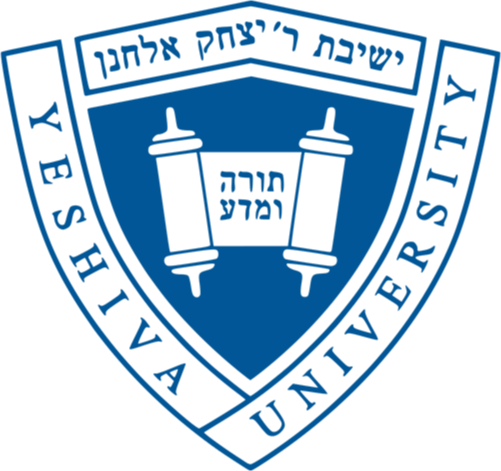</center>

<h1 style='text-align: center;'>Katz School of Science and Health</h1>
<h1 style='text-align: center;'>AIM 5999 Independent Study</h1>
<p>
<h2 style='text-align: center;'>Final Project</h1>
<br><br>
<h2 style='text-align: center;'>Visual Question Answering (VQA) System: Video Understanding of ML Classes</h1>
<br><br>

<div style="display: flex; justify-content: center;">
    <table style="border-collapse: collapse; border: 0;">
        <tr>
            <td style="text-align:center; vertical-align:middle; padding:10px 40px 10px 10px; border: 0;">
                <h3 style="margin: 0;">Radek Holik</h3>
            </td>
            <td style="text-align:center; vertical-align:middle; padding:10px 10px 10px 40px; border: 0;">
                <h3 style="margin: 0;">Ruslan Gokhman</h3>
            </td>
            <td style="text-align:center; vertical-align:middle; padding:10px 10px 10px 40px; border: 0;">
                <h3 style="margin: 0;">Manish Kumar Thota</h3>
            </td>
        </tr>
    </table>
</div>
<br>
<br>
<br>

# __Package Import__

In [1]:
# General system and utility libraries
import os
import platform
from datetime import datetime, timedelta
from timeit import default_timer as timer
import psutil
import win32com.client
import requests
import random
import textwrap

# Data manipulation and analysis libraries
import pandas as pd
import numpy as np
from collections import Counter
from sklearn.model_selection import train_test_split

# Image processing libraries
from PIL import Image

# Network and web-related libraries
import requests

# Machine learning and deep learning libraries
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, TensorDataset, random_split
from torch.nn.utils.rnn import pad_sequence
import torch.nn.functional as F
import torchvision
from torchvision import transforms, models
from io import BytesIO
from torch.optim.lr_scheduler import ReduceLROnPlateau
from tqdm import tqdm


from torch.optim import AdamW
#!pip install 'git+https://github.com/katsura-jp/pytorch-cosine-annealing-with-warmup'
from cosine_annealing_warmup import CosineAnnealingWarmupRestarts
from transformers import Pix2StructForConditionalGeneration, AutoProcessor, Pix2StructProcessor

# Natural language processing libraries
import transformers
# from transformers import ViTFeatureExtractor, ViTModel, ViTConfig, ViTImageProcessor
import clip
# from transformers import BertForQuestionAnswering, BertTokenizer, BertModel

from transformers import GPT2LMHeadModel, GPT2Tokenizer, GPT2Model, GPT2Config
from transformers import DeiTModel
from transformers import AutoFeatureExtractor
# from transformers import T5ForConditionalGeneration, T5Tokenizer
# from transformers import T5Tokenizer, T5EncoderModel, T5ForConditionalGeneration
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split

from transformers import AdamW


from nltk.translate.bleu_score import sentence_bleu
from rouge import Rouge
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity


# Data visualization libraries
import matplotlib.pyplot as plt

# Metrics and evaluation libraries
from sklearn.metrics import f1_score

# Jupyter notebook specific libraries
from IPython.display import clear_output

# Disable warnings for clean notebook presentation
import warnings
warnings.filterwarnings("ignore")
# This will filter all warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

# Configuration for libraries
pd.set_option('display.max_rows', 100)
pd.set_option('display.max_colwidth', None)


In [2]:
def get_basic_system_info():
    # Get CPU Name using WMI
    wmi = win32com.client.GetObject("winmgmts:")
    for item in wmi.ExecQuery("select * from Win32_Processor"):
        cpu_name = item.Name

    # Total RAM capacity in bytes
    total_ram_bytes = psutil.virtual_memory().total

    # Convert total RAM from bytes to GB for better readability
    total_ram_gb = total_ram_bytes / (1024 ** 3)

    return cpu_name, total_ram_gb

print(f"Python Version : {platform.python_version()}")
print(f"Torchvision : {torchvision.__version__}")
print(f"PyTorch Version : {torch.__version__}")
print(f"CUDA Version : {torch.version.cuda}")
print(f"Transformers Version : {transformers.__version__}")

print()

os_info = platform.uname()
print(f"OS System: {os_info.system} {os_info.release}")

print()

cpu_name, total_ram_gb = get_basic_system_info()
print(f"CPU Name: {cpu_name}")
print(f"Total RAM Capacity: {total_ram_gb:.2f} GB")

print()

if torch.cuda.is_available():
  print("CUDA available. Using GPU acceleration.")
  print(f"Number of CUDA devices : {torch.cuda.device_count()}")
  print(f"Device name : {torch.cuda.get_device_name(0)}")
  device = "cuda"
else:
  print("CUDA is NOT available. Using CPU for training.")
  device = "cpu"

Python Version : 3.11.3
Torchvision : 0.15.2+cu118
PyTorch Version : 2.0.1+cu118
CUDA Version : 11.8
Transformers Version : 4.34.0

OS System: Windows 10

CPU Name: 12th Gen Intel(R) Core(TM) i9-12900K
Total RAM Capacity: 63.75 GB

CUDA available. Using GPU acceleration.
Number of CUDA devices : 1
Device name : NVIDIA GeForce RTX 3090


# __Data Preprocessing__

### Loading Data

In [3]:
# Data Paths
data_dir = "./data/"

# qa_path = data_dir + "qa.json"
qa_path = data_dir + "QA_v2.json"
transcript_path = data_dir + "transcript.json"
img_path = data_dir + "images.json"

img_directory = data_dir + 'imgs/'

In [4]:
df_qa = pd.read_json(qa_path)
df_transcript = pd.read_json(transcript_path) 
df_image = pd.read_json(img_path)

print(df_qa.columns)
print(df_transcript.columns)
print(df_image.columns)

Index(['instruction', 'context', 'response', 'category', 'week', 'page'], dtype='object')
Index(['transcript', 'week', 'page'], dtype='object')
Index(['name', 'path', 'week', 'page'], dtype='object')


In [5]:
# Missing values in each column
print("Missing values in df_qa columns:")
print(df_qa.isnull().sum())

print("\nMissing values in df_transcript columns:")
print(df_transcript.isnull().sum())

print("\nMissing values in df_image columns:")
print(df_image.isnull().sum())

Missing values in df_qa columns:
instruction    0
context        0
response       0
category       0
week           0
page           0
dtype: int64

Missing values in df_transcript columns:
transcript    0
week          0
page          0
dtype: int64

Missing values in df_image columns:
name    0
path    0
week    0
page    0
dtype: int64


In [6]:
df_qa

,instruction,context,response,category,week,page
0,Can you explain this slide?,AIM 5005 Machine Learning slide,"The slide introduces AIM 5005 Machine Learning course, with the first lecture focusing on an introduction to machine learning. The instructor is Dr. Youshan Zhang.",summarization,1,1
1,Who is the instructor for this course?,AIM 5005 Machine Learning slide,The instructor is Dr. Youshan Zhang.,information_extraction,1,1
2,What is the course code?,AIM 5005 Machine Learning slide,The course code is AIM 5005.,information_extraction,1,1
3,What is the focus of Lecture 1?,AIM 5005 Machine Learning slide,Lecture 1 focuses on an introduction to machine learning.,closed_qa,1,1
4,What is the date of the lecture?,AIM 5005 Machine Learning slide,The lecture date is 01/18/2023.,information_extraction,1,1
...,...,...,...,...,...,...
9411,Can you explain this slide?,A slide titled 'Questions' with an image of a figure beside a large question mark.,"The slide titled 'Questions' showcases an image of a humanoid figure standing next to a large question mark, possibly indicating a session or segment for queries.",summarization,16,12
9412,What is the primary focus of the slide?,A slide titled 'Questions' with an image of a figure beside a large question mark.,"The primary focus of the slide is 'Questions', emphasized by the image of a humanoid figure beside a question mark.",classification,16,12
9413,What might be the purpose of this slide in a presentation?,A slide titled 'Questions' with an image of a figure beside a large question mark.,The slide might be used to prompt audience interaction or to indicate the Q&A segment of a presentation.,general_qa,16,12
9414,What emotions might this slide evoke in an audience?,A slide titled 'Questions' with an image of a figure beside a large question mark.,"The slide might evoke curiosity, anticipation, or a sense of engagement, prompting the audience to think of questions they have.",creative_writing,16,12


### Category Distribution

In [7]:
# Counting the number of samples for each unique value in the 'category' column
category_counts = df_qa['category'].value_counts()

# Displaying the result
print(category_counts)

category
closed_qa                 2776
information_extraction    2122
general_qa                1125
open_qa                   1083
summarization              934
brainstorming              540
classification             510
creative_writing           326
Name: count, dtype: int64


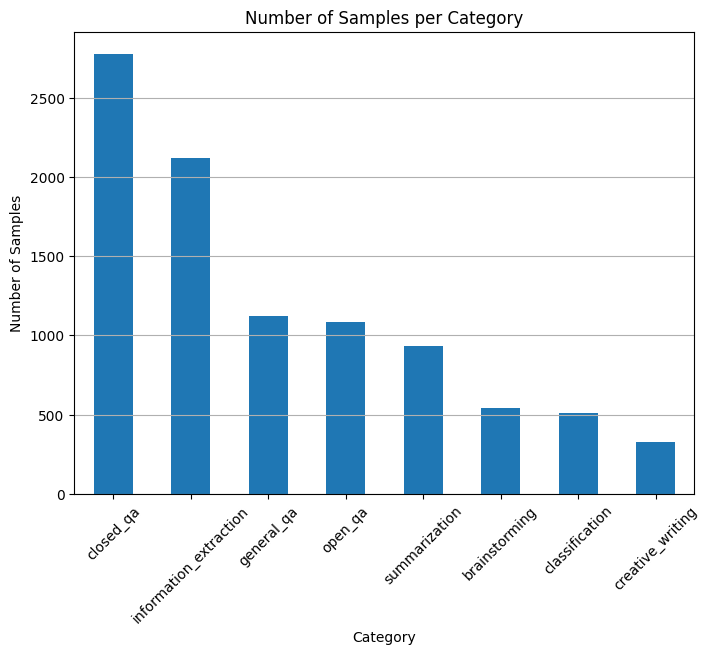

In [8]:
# Plotting the counts
plt.figure(figsize=(8, 6)) # You can adjust the figure size as needed
category_counts.plot(kind='bar') # Creates a bar chart
plt.title('Number of Samples per Category') # Adds a title to the chart
plt.xlabel('Category') # Label for the x-axis
plt.ylabel('Number of Samples') # Label for the y-axis
plt.xticks(rotation=45) # Rotates x-axis labels for better readability
plt.grid(axis='y') # Adds a grid on the y-axis
plt.show() # Displays the plot

#### QAs

In [9]:
df_qa_counts = df_qa['week'].value_counts().reset_index().sort_values(by = 'week')
df_qa_total_count = df_qa_counts['count'].sum()
df_qa_total_row = pd.DataFrame({'week': ['Total'], 'count': [df_qa_total_count]})
df_qa_counts = pd.concat([df_qa_counts, df_qa_total_row], ignore_index=True)
print(df_qa_counts)

     week  count
0       1   1090
1       2    765
2       3   1210
3       4    635
4       5    806
5       6    525
6       7    780
7       8    560
8       9    390
9      10    800
10     11    440
11     14    680
12     15    600
13     16    135
14  Total   9416


#### Transcipt

In [10]:
df_transcript_counts = df_transcript['week'].value_counts().reset_index().sort_values(by = 'week')
df_transcript_total_count = df_transcript_counts['count'].sum()
df_transcript_total_row = pd.DataFrame({'week': ['Total'], 'count': [df_transcript_total_count]})
df_transcript_counts = pd.concat([df_transcript_counts, df_transcript_total_row], ignore_index=True)
print(df_transcript_counts)

     week  count
0       1     92
1       2     68
2       3    117
3       4     61
4       5     81
5       6     53
6       7     76
7       8     54
8       9     38
9      10     78
10     11     41
11     14     58
12     15     56
13     16     12
14  Total    885


#### Images

In [11]:
df_images_counts = df_image['week'].value_counts().reset_index().sort_values(by = 'week')
df_images_total_count = df_images_counts['count'].sum()
df_images_total_row = pd.DataFrame({'week': ['Total'], 'count': [df_images_total_count]})
df_images_counts = pd.concat([df_images_counts, df_images_total_row], ignore_index = True)
print(df_images_counts)

     week  count
0       1     92
1       2     68
2       3    117
3       4     61
4       5     81
5       6     53
6       7     76
7       8     54
8       9     38
9      10     78
10     11     41
11     14     58
12     15     56
13     16     12
14  Total    885


### Merging dataframes

In [12]:
# Merge the dataframes based on 'week' and 'page'
df_merged = df_qa.merge(df_transcript, on = ['week', 'page']).merge(df_image, on = ['week', 'page'])

# Select and rename the desired columns
df_final = df_merged[['instruction', 'response', 'transcript', 'name', 'path']]
df_final = df_final.rename(columns = {
    'instruction': 'question',
    'response': 'answer'
})

In [13]:
df_final.columns

Index(['question', 'answer', 'transcript', 'name', 'path'], dtype='object')

In [14]:
df_final.head()

,question,answer,transcript,name,path
0,Can you explain this slide?,"The slide introduces AIM 5005 Machine Learning course, with the first lecture focusing on an introduction to machine learning. The instructor is Dr. Youshan Zhang.",As you guys have probably already noticed that I'm currently an assistant professor at our AI program.,week_01_page_001.png,.\data\imgs\week_01\week_01_page_001.png
1,Who is the instructor for this course?,The instructor is Dr. Youshan Zhang.,As you guys have probably already noticed that I'm currently an assistant professor at our AI program.,week_01_page_001.png,.\data\imgs\week_01\week_01_page_001.png
2,What is the course code?,The course code is AIM 5005.,As you guys have probably already noticed that I'm currently an assistant professor at our AI program.,week_01_page_001.png,.\data\imgs\week_01\week_01_page_001.png
3,What is the focus of Lecture 1?,Lecture 1 focuses on an introduction to machine learning.,As you guys have probably already noticed that I'm currently an assistant professor at our AI program.,week_01_page_001.png,.\data\imgs\week_01\week_01_page_001.png
4,What is the date of the lecture?,The lecture date is 01/18/2023.,As you guys have probably already noticed that I'm currently an assistant professor at our AI program.,week_01_page_001.png,.\data\imgs\week_01\week_01_page_001.png


In [15]:
# Missing values in each column
print("Missing values in df_qa columns:")
print(df_final.isnull().sum())

Missing values in df_qa columns:
question      0
answer        0
transcript    0
name          0
path          0
dtype: int64


In [16]:
# df_final.to_csv("./data/dataset.csv")
df_final.to_csv("./data/dataset_v2.csv")

In [17]:
df_final.columns

Index(['question', 'answer', 'transcript', 'name', 'path'], dtype='object')

### Distribution Based on the Length of the Answers and Questions

#### Answers

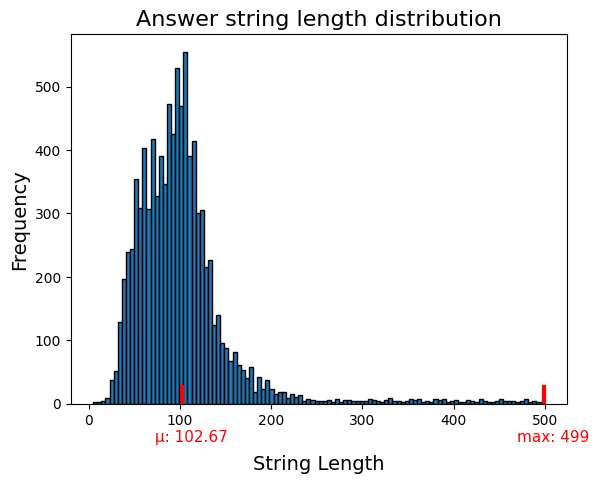

In [18]:
mean_value_a = df_final['answer'].str.len().mean()
max_value_a = df_final['answer'].str.len().max()

# Plot the distribution using a histogram
hist, bin_edges, _ = plt.hist(df_final['answer'].str.len(), bins = 110, edgecolor = 'k')

plt.xlabel('\nString Length', fontsize = 14)
plt.ylabel('Frequency', fontsize = 14)
plt.title('Answer string length distribution', fontsize = 16)

# Add a vertical line to indicate the mean value
plt.plot([mean_value_a, mean_value_a], [0, int(max(hist)/20)], color='red', linestyle ='solid', linewidth = 3)
plt.text(mean_value_a - 30, -60,'μ: {:.2f}'.format(mean_value_a), rotation = 0, color = 'red', fontsize = 11)

plt.plot([max_value_a, max_value_a], [0, int(max(hist)/20)], color = 'red', linestyle = 'solid', linewidth = 3)
plt.text(max_value_a - 30,  -60,'max: {}'.format(max_value_a), rotation = 0, color = 'red', fontsize = 11)

plt.show()

#### Questions

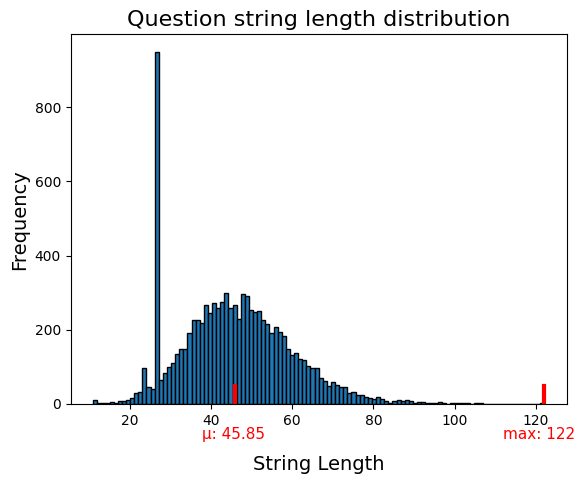

In [19]:
mean_value_q = df_final['question'].str.len().mean()
max_value_q = df_final['question'].str.len().max()

# Plot the histogram
hist, bin_edges, _ = plt.hist(df_final['question'].str.len(), bins = 110, edgecolor = 'k')

plt.xlabel('\nString Length', fontsize = 14)
plt.ylabel('Frequency', fontsize = 14)
plt.title('Question string length distribution', fontsize = 16)

# Add a vertical line to indicate the mean value
plt.plot([mean_value_q, mean_value_q], [0, int(max(hist)/20)], color='red', linestyle ='solid', linewidth = 3)
plt.text(mean_value_q - 8, - 95,'μ: {:.2f}'.format(mean_value_q), rotation = 0, color = 'red', fontsize = 11)

plt.plot([max_value_q, max_value_q], [0, int(max(hist)/20)], color = 'red', linestyle = 'solid', linewidth = 3)
plt.text(max_value_q - 10, - 95,'max: {}'.format(max_value_q), rotation = 0, color = 'red', fontsize = 11)

plt.show()

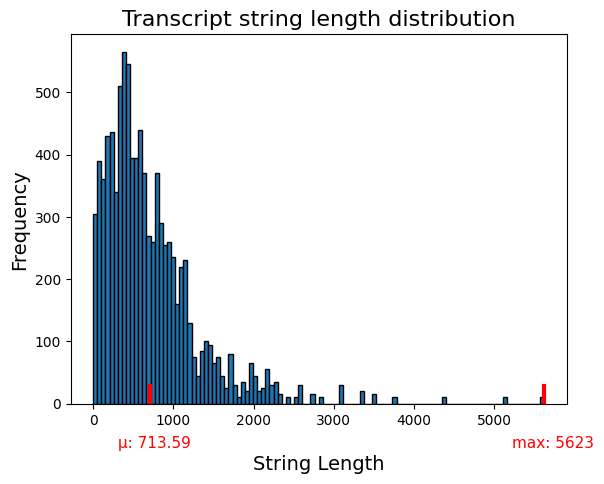

In [20]:
mean_value_t = df_final['transcript'].str.len().mean()
max_value_t = df_final['transcript'].str.len().max()

# Plot the histogram
hist, bin_edges, _ = plt.hist(df_final['transcript'].str.len(), bins = 110, edgecolor='k')

plt.xlabel('\nString Length', fontsize = 14)
plt.ylabel('Frequency', fontsize = 14)
plt.title('Transcript string length distribution', fontsize = 16)

# Add a vertical line to indicate the mean value
plt.plot([mean_value_t, mean_value_t], [0, int(max(hist)/20)], color='red', linestyle ='solid', linewidth = 3)
plt.text(mean_value_t - 400, - 70,'μ: {:.2f}'.format(mean_value_t), rotation = 0, color = 'red', fontsize = 11)

plt.plot([max_value_t, max_value_t], [0, int(max(hist)/20)], color = 'red', linestyle = 'solid', linewidth = 3)
plt.text(max_value_t - 400, - 70,'max: {}'.format(max_value_t), rotation = 0, color = 'red', fontsize = 11)

plt.show()

In [21]:
max_text_length = max(max_value_q, max_value_a)
print(f"max_text_length: {max_text_length}")

max_text_length: 499


In [22]:
max_value_q = df_final['question'].str.len().max()
max_value_a = df_final['answer'].str.len().max()
max_value_t = df_final['transcript'].str.len().max()

print(f"Maximum length of the questions: {max_value_q}")
print(f"Maximum length of the answers: {max_value_a}")
print(f"Maximum length of the transcripts: {max_value_t}")

Maximum length of the questions: 122
Maximum length of the answers: 499
Maximum length of the transcripts: 5623


# __Models__

### Model Testing

In [ ]:
# Define a transformation to convert the PIL image to a PyTorch tensor
transform = transforms.ToTensor()

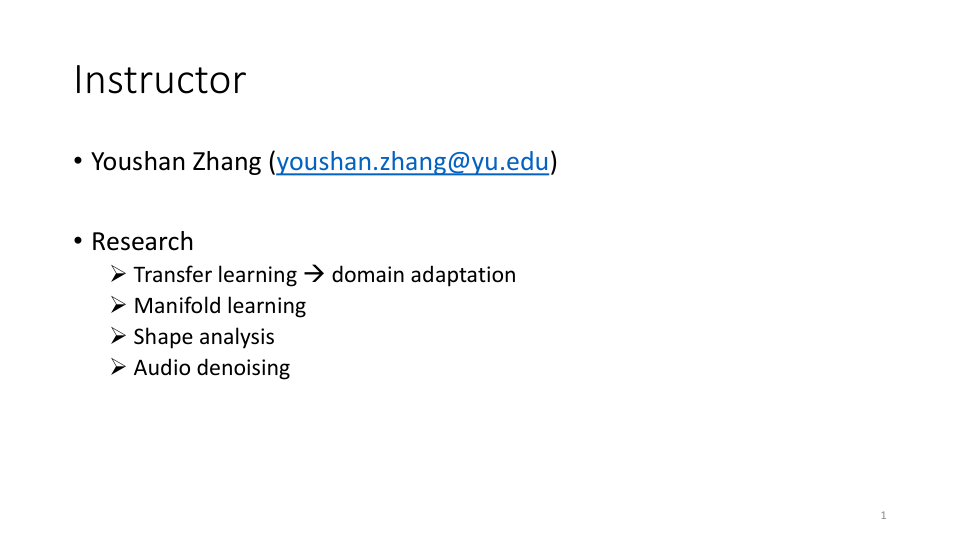

In [ ]:
# Load image from URL
image = Image.open(data_dir + 'demo_img' + '/' + 'week_01_page_002.png').convert('RGB')
image 

In [ ]:
# Apply the transformation to the image
image_tensor = transform(image).unsqueeze(0)

In [ ]:
transcript = "And let me quickly talk about my research. So, here is my email address, if you have any questions regarding to your course or regarding to your future, you know, or any other minor stuff you can feel free send me an email. My research and regular focus are on these 4 directions. So first of all, I'll majority of my papers, I focus on transfer learning. So specifically, I focused on as more domain for the domain adaptation. So later I will explain what the domain adaptation meaning here. Next, I am interested in manifold learning, which is kind of an expansion of space is different from our training space. And next, I am interested in the shape analysis, and this is really, relatively related to the medical field. And lastly, recently, I'm more focused on the audio denoising problem."

In [ ]:
# question = "Can you explain this slide?"
# question = "Who is the professor for this course?"
# question = "What is the professor's email address?"
# question = "What are the professor's research interests?"
question = "What is Transfer Learning?"
# question = "What is Manifold Learning?"
# question = "What is Shape Analysis?"
# question = "What is audio denoising?"

## __QA Models__

### Bert

In [ ]:
model_bert = BertForQuestionAnswering.from_pretrained("deepset/bert-large-uncased-whole-word-masking-squad2") # "deepset/bert-large-uncased-whole-word-masking-squad2", "deepset/bert-base-cased-squad2", "bert-large-uncased-whole-word-masking-finetuned-squad" 

Some weights of the model checkpoint at deepset/bert-large-uncased-whole-word-masking-squad2 were not used when initializing BertForQuestionAnswering: ['bert.pooler.dense.bias', 'bert.pooler.dense.weight']
- This IS expected if you are initializing BertForQuestionAnswering from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertForQuestionAnswering from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


In [ ]:
# Model Parameters
total_trainable_params = sum(p.numel() for p in model_bert.parameters() if p.requires_grad)
print(f"{total_trainable_params:,} model trainable parameters")

334,094,338 model trainable parameters


In [ ]:
# Tokenize the input
inputs = tokenizer_bert(question, transcript, return_tensors="pt")
input_ids = inputs["input_ids"].tolist()[0]

# Predict
outputs = model_bert(**inputs)
answer_start_scores = outputs.start_logits
answer_end_scores = outputs.end_logits

# Get the most likely beginning and end of the answer
answer_start = torch.argmax(answer_start_scores)
answer_end = torch.argmax(answer_end_scores) + 1

# Convert tokens to string
answer = tokenizer_bert.convert_tokens_to_string(tokenizer_bert.convert_ids_to_tokens(input_ids[answer_start:answer_end]))

print(answer)

domain for the domain adaptation


### GPT2

In [ ]:
model_gpt2 = GPT2LMHeadModel.from_pretrained("gpt2-large") # "gpt2-small", "gpt2-medium", "gpt2-large", "gpt2-xl"

In [ ]:
# Model Parameters
total_trainable_params = sum(p.numel() for p in model_gpt2.parameters() if p.requires_grad)
print(f"{total_trainable_params:,} model trainable parameters")

774,030,080 model trainable parameters


In [ ]:
# Combine the transcript and question to form a prompt for GPT-2
prompt = f"{transcript} {question}"

# Tokenize the prompt
input_ids = tokenizer_gpt2.encode(prompt, return_tensors = "pt")
attention_mask = torch.ones(input_ids.shape, dtype = torch.long)  # create a mask of 1s for each token

# Predict with modified hyperparameters
output = model_gpt2.generate(input_ids, 
                            max_length = 384, 
                            num_return_sequences = 1, 
                            temperature = 0.7, 
                            top_k = 50, 
                            top_p = 0.95,
                            pad_token_id = model_gpt2.config.eos_token_id,
                            attention_mask = attention_mask)

# Convert tokens to string
answer = tokenizer_gpt2.decode(output[0], skip_special_tokens = True)

# Extract the answer from the generated response
answer = answer.split(prompt)[-1].strip()

# Truncate after the first two sentences for conciseness
answer = '. '.join(answer.split('. ')[:2]) + '.'

print(answer)

Transfer learning is a process that is used to transfer knowledge from one domain to another. So, for example, if you are a doctor, you can learn a lot about the anatomy of the human body.


### T5

In [ ]:
model_t5 = T5ForConditionalGeneration.from_pretrained("t5-large") # "t5-small", "t5-base", "t5-large", "t5-3b", "t5-11b"

In [ ]:
# Model Parameters
total_trainable_params = sum(p.numel() for p in model_t5.parameters() if p.requires_grad)
print(f"{total_trainable_params:,} model trainable parameters")

737,668,096 model trainable parameters


In [ ]:
# Create the input string for T5 (T5 expects 'question: <your question> context: <your context>')
input_text = f"question: {question} context: {transcript}"

# Tokenize the input
input_ids = tokenizer_t5(input_text, return_tensors="pt").input_ids

# Predict
output = model_t5.generate(input_ids)

# Convert tokens to string without special tokens
answer = tokenizer_t5.decode(output[0], skip_special_tokens=True)

print(answer)

more domain for the domain adaptation


## __VQA Model__

In [ ]:
class VQAModel(nn.Module):
    def __init__(self):
        super().__init__()

        # Text encoding
        # For GPT2-Small. Use 'gpt2-medium', 'gpt2-large', or 'gpt2-xl' for other variants.
        self.text_encoder = GPT2Model.from_pretrained('gpt2-large').to(device)
        
        # Image encoding
        # self.image_encoder = ViTModel.from_pretrained('google/vit-base-patch16-224-in21k').to(device)
        self.image_encoder = ViTModel.from_pretrained('google/vit-large-patch16-224-in21k').to(device)
        # Setting the output layer to identity since there is not need a classification layer here
        self.image_encoder.fc = nn.Identity()

        # A linear layer to reshape concatenated embeddings, 1280 (GPT-2 question) + 1280 (GPT-2 transcript) + 1024 (ViT image) = 3584
        self.embedding_to_decoder_input = nn.Linear(3584, 1280).to(device)


        # Decoder
        self.decoder = GPT2LMHeadModel.from_pretrained('gpt2-large').to(device)

        # Freeze the image_encoder (ViT model)
        # for param in self.image_encoder.parameters():
        #     param.requires_grad = False

        # Freeze all the parameters in the model initially
        for param in self.parameters():
            param.requires_grad = False

        # Unfreeze the parameters in the last 3 layers of the decoder
        for i, layer in enumerate(self.decoder.transformer.h[-3:]):
            for param in layer.parameters():
                param.requires_grad = True

    def forward(self, question, question_attention_mask, transcript, transcript_attention_mask, image):
        # Encoding text (transcript + question)

        # Get embeddings (using first token's representation as example)
        text_emb = self.text_encoder(input_ids = question, attention_mask = question_attention_mask).last_hidden_state[:, 0, :]
        print(f"text_emb shape: {text_emb.shape}") # Debugging print

        transcript_emb = self.text_encoder(input_ids = transcript, attention_mask = transcript_attention_mask).last_hidden_state[:, 0, :]
        print(f"transcript_emb shape: {transcript_emb.shape}") # Debugging print

        # Encoding image
        image_emb = self.image_encoder(image).pooler_output
        print(f"image_emb shape: {image_emb.shape}") # Debugging print
        
        # Concatenate and reshape for decoder
        combined_emb = torch.cat((text_emb, transcript_emb, image_emb), dim = 1)
        print(f"combined_emb shape: {combined_emb.shape}") # Debugging print

        decoder_context = self.embedding_to_decoder_input(combined_emb)
        print(f"decoder_context shape: {decoder_context.shape}") # Debugging print

        # Decoding answer
        decoder_outputs = self.decoder(inputs_embeds=decoder_context.unsqueeze(1))

        return decoder_outputs.logits
        

In [ ]:
# Instantiate model
model = VQAModel().to(device)

In [ ]:
# Model Parameters
total_params = sum(p.numel() for p in model.parameters())
total_trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)

print(f"{total_params:,} total model parameters")
print(f"{total_trainable_params:,} model trainable parameters")

print(f"\nIs my model in GPU? : {next(model.parameters()).is_cuda}\n")

# GPU memory cache size
if torch.cuda.is_available():
    print(f"The allocated memory in the GPU for the model : {torch.cuda.memory_allocated()/(1024 * 1024):.3f}MB")

1,857,000,192 total model parameters
59,032,320 model trainable parameters

Is my model in GPU? : True

The allocated memory in the GPU for the model : 7301.638MB


In [ ]:
# Initialize the GPT-2 tokenizer
tokenizer = GPT2Tokenizer.from_pretrained('gpt2-large')

# Use the EOS token as the padding token
tokenizer.pad_token = tokenizer.eos_token

# vit_feature_extractor = ViTFeatureExtractor.from_pretrained('google/vit-base-patch16-224-in21k')
vit_feature_extractor = ViTFeatureExtractor.from_pretrained('google/vit-large-patch16-224-in21k')

## Test model functionality on pseudo data

In [ ]:
# batch size is 1
batch_size = 1

# Pseudo image data: 3-channel images of size 224x224
# pseudo_images = torch.randn(batch_size, 3, 224, 224)
transform = transforms.ToTensor()
image = Image.open(data_dir + 'demo_img' + '/' + 'week_01_page_002.png').convert('RGB')
image_tensor = transform(image).unsqueeze(0)
pseudo_images = image_tensor

# Preprocess the pseudo images using the ViT feature extractor, Convert tensor images to PIL Images for the ViT feature extractor
pseudo_images = [transforms.ToPILImage()(img) for img in pseudo_images]
processed_images = vit_feature_extractor(pseudo_images, return_tensors='pt')

# Pseudo text data: creating some fake questions and transcripts
pseudo_questions = ["What is Transfer Learning?"]
pseudo_transcripts = ["And let me quickly talk about my research. So, here is my email address, if you have any questions regarding to your course or regarding to your future, you know, or any other minor stuff you can feel free send me an email. My research and regular focus are on these 4 directions. So first of all, I'll majority of my papers, I focus on transfer learning. So specifically, I focused on as more domain for the domain adaptation. So later I will explain what the domain adaptation meaning here. Next, I am interested in manifold learning, which is kind of an expansion of space is different from our training space. And next, I am interested in the shape analysis, and this is really, relatively related to the medical field. And lastly, recently, I'm more focused on the audio denoising problem."]

# Tokenize the text dat
encoded_questions = tokenizer(pseudo_questions, return_tensors = 'pt', padding = True, truncation = True, max_length = 256)
encoded_transcripts = tokenizer(pseudo_transcripts, return_tensors ='pt', padding = True, truncation=True, max_length = 1024)

# Ensure the data is on the correct device
encoded_questions = {key: val.to(device) for key, val in encoded_questions.items()}
encoded_transcripts = {key: val.to(device) for key, val in encoded_transcripts.items()}
processed_images = {key: val.to(device) for key, val in processed_images.items()}

In [ ]:
# Pass the pseudo data through your model
with torch.no_grad():  # No need to compute gradients for this test
    output = model(
        question=encoded_questions['input_ids'],
        question_attention_mask=encoded_questions['attention_mask'],
        transcript=encoded_transcripts['input_ids'],
        transcript_attention_mask=encoded_transcripts['attention_mask'],
        image=processed_images['pixel_values']
    )

# Print the output shape to verify the model is working as expected
print(f"Output shape: {output.shape}")

# Get the predicted token ids by finding the argmax over the vocabulary dimension
predicted_token_ids = torch.argmax(output, dim=-1)

# Convert tensor to list and decode to strings
predicted_token_ids_list = predicted_token_ids.squeeze().cpu().tolist()
decoded_strings = tokenizer.decode(predicted_token_ids_list, skip_special_tokens = True)

print(decoded_strings)

text_emb shape: torch.Size([1, 1280])
transcript_emb shape: torch.Size([1, 1280])
image_emb shape: torch.Size([1, 1024])
combined_emb shape: torch.Size([1, 3584])
decoder_context shape: torch.Size([1, 1280])
Output shape: torch.Size([1, 1, 50257])
—


## Creating Dataset

#### Shuffle the Dataset

In [ ]:
df_final = shuffle(df_final, random_state = 2023)

#### Split the Dataset

In [ ]:
training_ration = 0.9
ratio_division = 1 - training_ration


train_df, val_df = train_test_split(df_final, test_size = ratio_division, random_state = 2023)

#### Custom Dataset Classes

In [ ]:
class VQADataset(Dataset):
    def __init__(self, dataframe, tokenizer, vit_feature_extractor):
        self.dataframe = dataframe
        self.tokenizer = tokenizer
        self.vit_feature_extractor = vit_feature_extractor
        
    def __len__(self):
        return len(self.dataframe)
    
    def __getitem__(self, idx):
        row = self.dataframe.iloc[idx]
        question = row['question']
        # transcript = row['transcript']
        image_path = row['path']
        answer = row['answer']  # Assuming 'answer' is the column name for the answers
        
        # Load the image
        image = Image.open(image_path)
        
        # Return a dictionary containing the raw data and the answer
        return {
            'question': question,
            # 'transcript': transcript,
            'image': image,
            'answer': answer
        }

def collate_fn(batch):
    # Process images
    images = [item['image'] for item in batch]
    processed_images = vit_feature_extractor(images, return_tensors='pt')
    
    # Tokenize text
    questions = [item['question'] for item in batch]
    # transcripts = [item['transcript'] for item in batch]
    encoded_questions = tokenizer(questions, return_tensors='pt', padding=True, truncation=True, max_length=256)
    # encoded_transcripts = tokenizer(transcripts, return_tensors='pt', padding=True, truncation=True, max_length=1024)
    
    # Tokenize answers
    answers = [item['answer'] for item in batch]
    encoded_answers = tokenizer(answers, return_tensors='pt', padding=True, truncation=True, max_length=512)
    
    # Return a dictionary containing the processed data
    return {
        'question': encoded_questions['input_ids'],
        'question_attention_mask': encoded_questions['attention_mask'],
        # 'transcript': encoded_transcripts['input_ids'],
        'transcript_attention_mask': encoded_transcripts['attention_mask'],
        'image': processed_images['pixel_values'],
        'labels': encoded_answers['input_ids']  # Including the tokenized answers as labels
    }

def move_batch_to_device(batch, device):
    moved_batch = {}
    for key, value in batch.items():
        if isinstance(value, dict):
            # If the value is a dictionary, move each tensor in the dictionary to the device
            moved_batch[key] = {k: v.to(device) for k, v in value.items()}
        else:
            # If the value is a tensor, move it to the device
            moved_batch[key] = value.to(device)
    return moved_batch

#### Instantiate the Datasets and DataLoaders

In [ ]:
batch_size = 10

In [ ]:
# Instantiate the datasets
train_dataset = VQADataset(train_df, tokenizer, vit_feature_extractor)
val_dataset = VQADataset(val_df, tokenizer, vit_feature_extractor)

print(f'Total number of samples in the train dataset: {len(train_dataset)}')
print(f'Total number of samples in the val dataset: {len(val_dataset)}')

Total number of samples in the train dataset: 4239
Total number of samples in the val dataset: 472


In [ ]:
# Instantiate the data loaders
train_dataloader = DataLoader(train_dataset, batch_size = batch_size, shuffle = True, collate_fn = collate_fn)
val_dataloader = DataLoader(val_dataset, batch_size = batch_size, shuffle = False, collate_fn = collate_fn)

In [ ]:
# Get a batch of data
for batch in train_dataloader:
    # Now batch is a dictionary with tokenized/processed data
    print(f"\nTrain Question dimensions: {batch['question'].shape}")
    print(f"Train Transcript dimensions: {batch['transcript'].shape}")
    print(f"Train Image dimensions: {batch['image'].shape}")
    break  # only print the first batch


Train Question dimensions: torch.Size([10, 21])
Train Transcript dimensions: torch.Size([10, 558])
Train Image dimensions: torch.Size([10, 3, 224, 224])


In [ ]:
# Get a batch of data
for batch in val_dataloader:
    # Now batch is a dictionary with tokenized/processed data
    print(f"\nVal Question dimensions: {batch['question'].shape}")
    print(f"Val Transcript dimensions: {batch['transcript'].shape}")
    print(f"Val Image dimensions: {batch['image'].shape}")
    break  # only print the first batch


Val Question dimensions: torch.Size([10, 26])
Val Transcript dimensions: torch.Size([10, 819])
Val Image dimensions: torch.Size([10, 3, 224, 224])


In [ ]:
# # Get the first batch of data
# first_batch = next(iter(train_dataloader))

# # Print the keys in the first batch
# print(first_batch.keys())

# first_batch['labels']

# __Training__

#### Auxiliary Functions

In [ ]:
# Plot and print during training

def update_plots(loss_values_train, loss_values_val, acc_values_train, acc_values_val, print_messages):
    clear_output(wait = True)

    # Display print messages
    for message in print_messages:
        print(message)

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize = (18, 5))

    # Plot loss values
    ax1.plot(range(1, len(loss_values_train) + 1), loss_values_train, label = "Train Loss")
    ax1.plot(range(1, len(loss_values_val) + 1), loss_values_val, label = "Validation Loss")
    ax1.set_xlabel("Epoch")
    ax1.set_ylabel("Loss")
    ax1.legend()
    ax1.set_title("Loss Values")
    ax1.grid(linestyle = "--", linewidth = 0.75)

    # Plot IoU values
    ax2.plot(range(1, len(acc_values_train) + 1), acc_values_train, label = "Train Accuracy (F1 Score)")
    ax2.plot(range(1, len(acc_values_val) + 1), acc_values_val, label = "Validation Accuracy (F1 Score)")
    ax2.set_xlabel("Epoch")
    ax2.set_ylabel("Accuracy (%)")
    ax2.legend()
    ax2.set_title("Accuracy Values (F1 Score)")
    ax2.grid(linestyle = "--", linewidth = 0.75)

    plt.show()

def time_to_seconds(time_string):
    '''
    Input Format :  'hh:mm:ss'
    '''
    time_components = time_string.split(':')
    hours = int(time_components[0])
    minutes = int(time_components[1])
    seconds = int(time_components[2])
    time_in_seconds = hours * 3600 + minutes * 60 + seconds

    return time_in_seconds

# Define the F1 score function
def get_f1_score(true, pred):
    true_tokens = true.split()
    pred_tokens = pred.split()
    
    # Convert tokens to counters
    true_counter = Counter(true_tokens)
    pred_counter = Counter(pred_tokens)
    
    # Calculate precision and recall
    common_tokens = true_counter & pred_counter
    num_common = sum(common_tokens.values())
    
    if num_common == 0:
        return 0
    
    precision = num_common / len(pred_tokens)
    recall = num_common / len(true_tokens)
    
    # Calculate F1 score
    f1_score_value = (2 * precision * recall) / (precision + recall)
    return f1_score_value

def batch_f1_score(true_batch, pred_batch):
    batch_size = len(true_batch)
    total_f1 = 0.0

    for i in range(batch_size):
        f1 = get_f1_score(true_batch[i], pred_batch[i])
        total_f1 += f1
        
    return total_f1 / batch_size

def compute_f1(model, dataloader):
    # Function to compute F1 score
    all_preds = []
    all_labels = []
    with torch.no_grad():
        for batch in dataloader:
            outputs = model(**batch)
            preds = torch.argmax(outputs.logits, dim=-1)  # Assuming model returns logits
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(batch['labels'].cpu().numpy())
    return f1_score(all_labels, all_preds, average='weighted')

### Hyperparameters

In [ ]:
# Total number of training epochs to run.
num_epochs = 100

# Cross Entropy Loss is commonly used for classification tasks.
loss_function = nn.CrossEntropyLoss().to(device)

'''
 Parameters:

    - optimizer: The optimizer instance managing the model's parameters and performing updates.

    - num_warmup_steps: The number of initial steps where the learning rate increases gradually. 
      This warmup phase helps the model stabilize before entering the main training phase.

    - num_training_steps: The total number of training steps. 
      The scheduler adjusts the learning rate using a cosine annealing curve after the warmup phase.
 
'''
# AdamW optimizer
learning_rate = 5e-4
optimizer = AdamW(model.parameters(), lr = learning_rate, betas=(0.9, 0.999))


# Specify the number of warmup steps and the total number of training steps
steps_per_epoch = len(train_dataloader)
total_epochs = num_epochs
first_cycle_epochs = total_epochs // 5  # Replacing steps with epochs here
num_warmup_epochs = first_cycle_epochs // 4  

# Convert to steps since scheduler expects steps
first_cycle_steps = first_cycle_epochs #* steps_per_epoch
num_warmup_steps = num_warmup_epochs #* steps_per_epoch
total_steps = total_epochs #* steps_per_epoch

# Create the scheduler
scheduler = CosineAnnealingWarmupRestarts(optimizer,
                                          first_cycle_steps = first_cycle_steps,
                                          cycle_mult = 1.0,
                                          max_lr = learning_rate,
                                          min_lr = learning_rate / 100,
                                          warmup_steps = num_warmup_steps,
                                          gamma = 0.5)


## Training Loop

In [ ]:
from_beginning = True
# from_beginning = False


	 ****** Training has begun. ******

Epoch: 001 | Learning Rate : 5.000000E-06 | Train Loss: 6.18447891 | Val Loss: 4.92168663 | Train Acc: 0.012181 | Val Acc: 0.010336 | Time: 00:06:22
Epoch: 002 | Learning Rate : 1.040000E-04 | Train Loss: 4.37523820 | Val Loss: 4.15882195 | Train Acc: 0.016895 | Val Acc: 0.003426 | Time: 00:12:33
Epoch: 003 | Learning Rate : 2.030000E-04 | Train Loss: 4.22085048 | Val Loss: 4.21573437 | Train Acc: 0.015815 | Val Acc: 0.005008 | Time: 00:18:43
Epoch: 004 | Learning Rate : 3.020000E-04 | Train Loss: 4.19328429 | Val Loss: 4.16344247 | Train Acc: 0.013355 | Val Acc: 0.007369 | Time: 00:24:55
Epoch: 005 | Learning Rate : 4.010000E-04 | Train Loss: 4.18350528 | Val Loss: 4.16059896 | Train Acc: 0.016105 | Val Acc: 0.003816 | Time: 00:31:04
Epoch: 006 | Learning Rate : 5.000000E-04 | Train Loss: 4.19418954 | Val Loss: 4.15366406 | Train Acc: 0.012877 | Val Acc: 0.004177 | Time: 00:37:14
Epoch: 007 | Learning Rate : 4.945915E-04 | Train Loss: 4.16489649 |

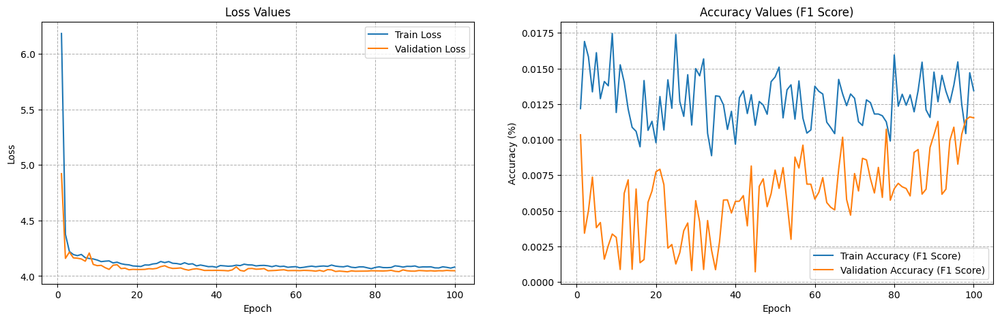

In [ ]:
torch.cuda.empty_cache()

if from_beginning == False:
    # Read the DataFrame from the CSV file
    df = pd.read_csv('./data/training_outcomes/outcomes_Blip2ForConditionalGeneration_10_03_30_21.csv')

    # Assign each column of the DataFrame to its respective list variable
    epoch_list = df['Epoch'].tolist()
    history_learning_rate = df['Learning_Rate'].tolist()
    loss_values_train = df['Train_Loss'].tolist()
    loss_values_val = df['Validation_Loss'].tolist()
    acc_train = df['Train_Accuracy'].tolist()
    acc_val = df['Validation_Accuracy'].tolist()
    epoch_time = df['Time'].tolist()

    print_messages = ['\n\t ****** Training has begun. ******\n']
    for i in range(0, epoch_list[-1]):
        message = f'Epoch: {epoch_list[i]:03} | Learning Rate : {history_learning_rate[i]:.6E} | Train Loss: {loss_values_train[i]:.8f} | Val Loss: {loss_values_val[i]:.8f} | Train Acc: {acc_train[i]:.6f} | Val Acc: {acc_val[i]:.6f} | Time: {epoch_time[i]}'
        print_messages.append(message)

    starting_epoch = epoch_list[-1] + 1
    print(f"Starting epoch : {starting_epoch}")
    dt = time_to_seconds(epoch_time[-1])

else: 
    epoch_list = []
    loss_values_train = []
    loss_values_val = []
    acc_train = []
    acc_val = []
    history_learning_rate = []
    epoch_time = []

    starting_epoch = 1
    print_messages = ['\n\t ****** Training has begun. ******\n']
    dt = 0



start = timer()

update_plots(loss_values_train, loss_values_val, acc_train, acc_val, print_messages)

# Training loop
for epoch in range(starting_epoch, num_epochs + 1):
    epoch_list.append(epoch)

    # Training
    model.train()

    history_learning_rate.append(optimizer.param_groups[0]['lr'])
    total_train_loss = 0
    train_preds, train_labels = [], []

    for batch in train_dataloader:

        # batch = move_batch_to_device(batch, device)

        # Move batch to device
        for key in batch:
            batch[key] = batch[key].to(device)

        # Zero the gradients
        optimizer.zero_grad()

        # Forward pass
        outputs = model(
            question=batch['question'],
            question_attention_mask=batch['question_attention_mask'],
            transcript=batch['transcript'],
            transcript_attention_mask=batch['transcript_attention_mask'],
            image=batch['image']
        )
        outputs = torch.squeeze(outputs, dim=1)

        # Compute loss
        labels = batch['labels']
        labels = torch.argmax(labels, dim=-1)  # Convert one-hot encoded labels to class indices

        # print(outputs.shape)
        # print(labels.shape)
        loss = loss_function(outputs, labels)

        # Backward pass
        loss.backward()

        # Update parameters
        optimizer.step()

        
        total_train_loss += loss.item()

        train_preds.extend(torch.argmax(outputs, dim=-1).flatten().cpu().numpy())
        train_labels.extend(labels.flatten().cpu().numpy())
    
    # Update the learning rate
    scheduler.step()
    
    avg_train_loss = total_train_loss / len(train_dataloader)
    train_f1 = f1_score(train_labels, train_preds, average = 'weighted')
    loss_values_train.append(avg_train_loss)
    acc_train.append(train_f1)

    # Validation
    model.eval()
    total_val_loss = 0
    val_preds, val_labels = [], []

    for batch in val_dataloader:
        with torch.no_grad():

            # batch = move_batch_to_device(batch, device)
            # Move batch to device
            for key in batch:
                batch[key] = batch[key].to(device)
            
            outputs = model(
                question=batch['question'],
                question_attention_mask=batch['question_attention_mask'],
                transcript=batch['transcript'],
                transcript_attention_mask=batch['transcript_attention_mask'],
                image=batch['image']
            )
            outputs = torch.squeeze(outputs, dim=1) 

            # Compute loss
            labels = batch['labels']
            labels = torch.argmax(labels, dim=-1)  # Convert one-hot encoded labels to class indices
            loss = loss_function(outputs, labels)
            
            total_val_loss += loss.item()

            val_preds.extend(torch.argmax(outputs, dim=-1).flatten().cpu().numpy())
            val_labels.extend(labels.flatten().cpu().numpy())
    
    avg_val_loss = total_val_loss / len(val_dataloader)
    val_f1 = f1_score(val_labels, val_preds, average='weighted')
    loss_values_val.append(avg_val_loss)
    acc_val.append(val_f1)

    # Print training statistics
    epoch_time.append(timedelta(seconds = int(timer() - start) + dt).__str__().zfill(8))
    message = f"Epoch: {epoch:03} | Learning Rate : {history_learning_rate[-1]:.6E} | Train Loss: {loss_values_train[-1]:.8f} | Val Loss: {loss_values_val[-1]:.8f} | Train Acc: {acc_train[-1]:.6f} | Val Acc: {acc_val[-1]:.6f} | Time: {epoch_time[-1]}"

    print_messages.append(message)

    # Update the plots
    update_plots(loss_values_train, loss_values_val, acc_train, acc_val, print_messages)
    
# Wrap up the training process
end = timer()
message = '\n\n\t ****** Training has finished. ******\n'

print_messages.append(message)

print(message)

message = f'\tTraining time: {timedelta(seconds = int(end - start) + dt)} [hh:mm:ss]'
print_messages.append(message)
print(message)

# Update the plots
update_plots(loss_values_train, loss_values_val, acc_train, acc_val, print_messages)
    
# Release GPU memory
torch.cuda.empty_cache()

# Creating the DataFrame
outcomes = pd.DataFrame(
    {   'Epoch': epoch_list,
        'Learning_Rate': history_learning_rate,
        'Train_Loss': loss_values_train,
        'Validation_Loss': loss_values_val,
        'Train_Accuracy': acc_train,
        'Validation_Accuracy': acc_val,
        'Time': epoch_time,
    })


# Create folders if they don't exist
if not os.path.exists("./training_outcomes"):
    os.makedirs("./training_outcomes")

if not os.path.exists("./models"):
    os.makedirs("./models")

# saving the DataFrame as a CSV file
if epoch_list: # Check if epoch_list is not empty
    outcomes.to_csv(f'./training_outcomes/outcomes_{model.__class__.__name__}_{epoch_list[-1]}_{epoch_time[-1].replace(":", "_")}.csv', index = False)
else:
    print("epoch_list is empty, so the DataFrame cannot be saved with the specified filename format.")


# Saving the Model
torch.save(model, f'./models/model_{model.__class__.__name__}__{epoch_list[-1]}_{epoch_time[-1].replace(":", "_")}.pth')

# Saving the Model Weights
torch.save(model.state_dict(), f'./models/model_weights_{model.__class__.__name__}__{epoch_list[-1]}_{epoch_time[-1].replace(":", "_")}.pth')

#### Plot of the Loss and the Accuracy History

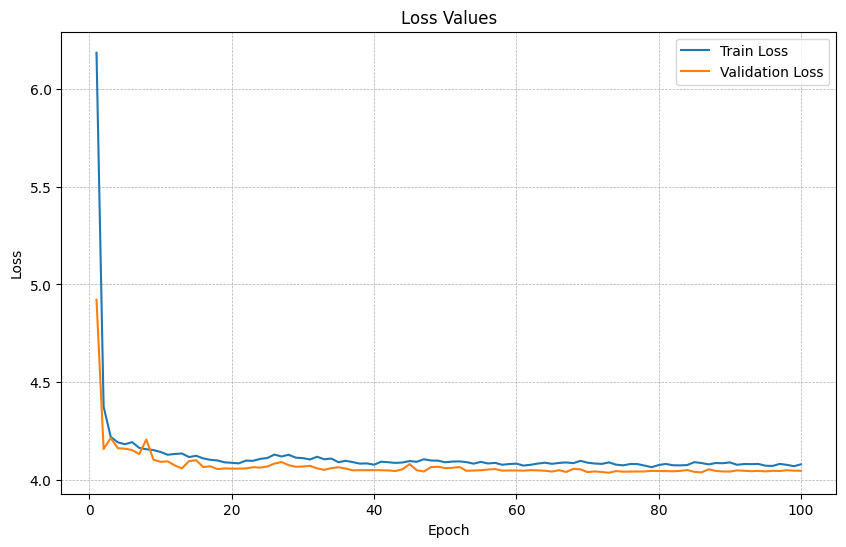

In [ ]:
# Create the first plot for loss values
fig1, ax1 = plt.subplots(figsize = (10, 6))

ax1.plot(range(1, len(loss_values_train) + 1), loss_values_train, label = 'Train Loss')
ax1.plot(range(1, len(loss_values_val) + 1), loss_values_val, label = 'Validation Loss')
ax1.set_xlabel('Epoch')
ax1.set_ylabel('Loss')
ax1.legend()
ax1.set_title('Loss Values')
ax1.grid(linestyle='--', linewidth = 0.5)

plt.show()

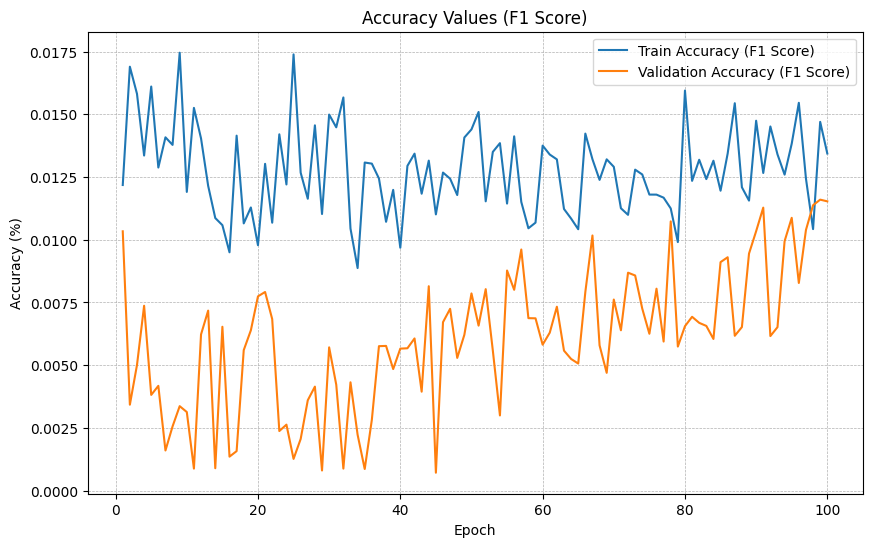

In [ ]:
# Create the second plot for accuracy values
fig2, ax2 = plt.subplots(figsize = (10, 6))

ax2.plot(range(1, len(acc_train) + 1), acc_train, label = 'Train Accuracy (F1 Score)')
ax2.plot(range(1, len(acc_val) + 1), acc_val, label = 'Validation Accuracy (F1 Score)')
ax2.set_xlabel('Epoch')
ax2.set_ylabel('Accuracy (%)')
ax2.legend()
ax2.set_title('Accuracy Values (F1 Score)')
ax2.grid(linestyle = '--', linewidth = 0.5)

plt.show()

#### History of the Learning Rate

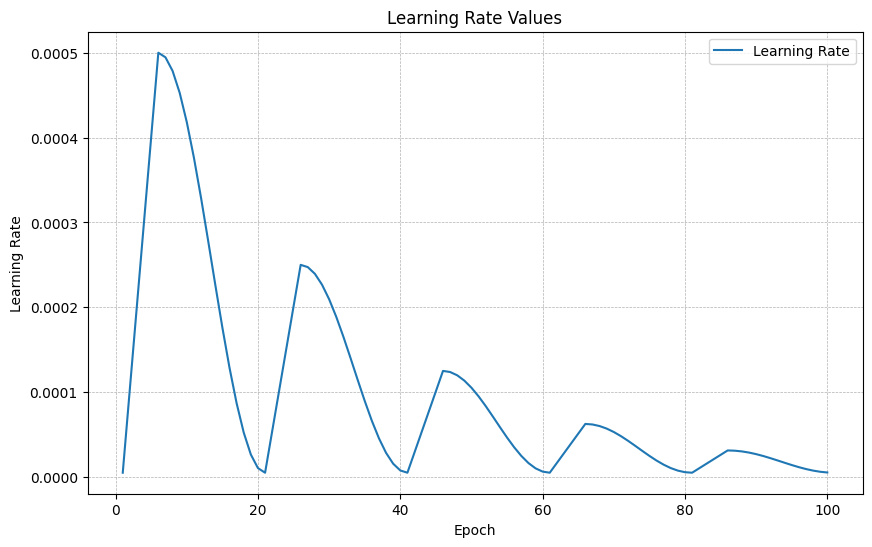

In [ ]:
# Plot learning rate values
plt.figure(figsize = (10, 6))
plt.plot(range(1, len(history_learning_rate) + 1), history_learning_rate, label = 'Learning Rate')
plt.xlabel('Epoch')
plt.ylabel('Learning Rate')
plt.legend()
plt.title('Learning Rate Values')
plt.grid(linestyle = '--', linewidth = 0.5)

plt.show()

### Test the Model on a Sample from the Dataset After Training

In [ ]:
# 1. Randomly Select 10 Samples
random_df = train_df[:10]

In [ ]:
# 2. Prepare Your Data

# Create a DataLoader
random_dataset = VQADataset(random_df, tokenizer, vit_feature_extractor)
random_dataloader = DataLoader(random_dataset, batch_size = len(random_df), shuffle = True, collate_fn = collate_fn)

In [ ]:
print(f'Total number of samples in the random dataset: {len(random_dataset)}')

Total number of samples in the random dataset: 10


In [ ]:
# Get a batch of data
for batch in random_dataloader:
    # Now batch is a dictionary with tokenized/processed data
    print(f"\nRandom Question dimensions: {batch['question'].shape}")
    print(f"Random Transcript dimensions: {batch['transcript'].shape}")
    print(f"Random Image dimensions: {batch['image'].shape}")
    break  # only print the first batch


Random Question dimensions: torch.Size([10, 19])
Random Transcript dimensions: torch.Size([10, 398])
Random Image dimensions: torch.Size([10, 3, 224, 224])


In [ ]:
# 3. Model Evaluation
model.eval()

# 4. Pass Data Through Model
with torch.no_grad():
    for batch in random_dataloader:
            
        # Move batch to device
        for key in batch:
            batch[key] = batch[key].to(device)


        outputs = model(
            question = batch['question'],
            question_attention_mask = batch['question_attention_mask'],
            transcript = batch['transcript'],
            transcript_attention_mask = batch['transcript_attention_mask'],
            image = batch['image']
        )

In [ ]:
# Print the output shape to verify the model is working as expected
print(f"Output shape: {outputs.shape}")

# Get the predicted token ids by finding the argmax over the vocabulary dimension
predicted_token_ids = torch.argmax(outputs, dim = -1)

# Convert tensor to list and decode to strings
predicted_token_ids_list = predicted_token_ids.squeeze().cpu().tolist()
decoded_strings = tokenizer.decode(predicted_token_ids_list, skip_special_tokens = True)

print(decoded_strings)

Output shape: torch.Size([10, 1, 50257])
=@@C@=@C66


## Redefining the VQA Model

In [ ]:
# class VQAModel(nn.Module):
#     def __init__(self):
#         super(VQAModel, self).__init__()
        
#         # Load Pre-trained Models
#         # Vision Transformer (ViT) for image feature extraction
#         # self.vit = ViTModel.from_pretrained('google/vit-base-patch16-224-in21k')
#         self.vit = ViTModel.from_pretrained('google/vit-large-patch16-224-in21k')

#         # GPT-2 encoder to obtain text embeddings
#         # For GPT2-Small. Use 'gpt2-medium', 'gpt2-large', or 'gpt2-xl' for other variants.
#         self.gpt2_encoder = GPT2Model.from_pretrained('gpt2-large')
        
#         # GPT-2 decoder to generate textual output
#         # For GPT2-Small. Use 'gpt2-medium', 'gpt2-large', or 'gpt2-xl' for other variants.
#         self.gpt2_decoder = GPT2LMHeadModel.from_pretrained('gpt2-large')

#         # Fusion Layer
#         # Linear layer to merge embeddings from ViT and GPT-2 encoder
#         # to match the dimensionality of GPT-2 decoder
#         self.fusion_layer = nn.Linear(
#             self.vit.config.hidden_size + self.gpt2_encoder.config.hidden_size, 
#             self.gpt2_decoder.config.hidden_size
#         )


#     def forward(self, input_ids, attention_mask, image, decoder_input_ids, decoder_attention_mask):
#         """
#         Forward pass of the model.

#         Parameters:
#         - input_ids (torch.Tensor): Token IDs for text input.
#         - attention_mask (torch.Tensor): Attention mask for text input to handle variable sequence lengths.
#         - image (torch.Tensor): Input image.
#         - decoder_input_ids (torch.Tensor): Decoder input IDs for text generation.
#         - decoder_attention_mask (torch.Tensor): Attention mask for decoder input to handle variable sequence lengths.

#         Returns:
#         - logits (torch.Tensor): Output logits from GPT-2 decoder.
#         """

#         # Check input shapes
#         # print("Input IDs Shape:", input_ids.shape)
#         # print("Attention Mask Shape:", attention_mask.shape)
#         # print("Image Shape:", image.shape)

#         # ViT Encoder: Extract features from image
#         # - image_embedding: [batch_size, vit_hidden_size]
#         vit_outputs = self.vit(image)
#         image_embedding = vit_outputs['last_hidden_state'][:,0,:]
#         # print("Image Embedding Shape:", image_embedding.shape)

#         # GPT-2 Encoder: Extract features from input text
#         # - text_embedding: [batch_size, gpt2_hidden_size]
#         gpt2_outputs = self.gpt2_encoder(input_ids = input_ids, attention_mask = attention_mask)
#         text_embedding = gpt2_outputs['last_hidden_state'][:,0,:]
#         # print("Text Embedding Shape:", text_embedding.shape)

#         # Fusion Layer: Combine and transform image and text embeddings to 
#         # create a merged embedding compatible with GPT-2 decoder
#         # - merged_embedding: [batch_size, gpt2_hidden_size]
#         combined_embedding = torch.cat((image_embedding, text_embedding), dim = -1)
#         merged_embedding = self.fusion_layer(combined_embedding)
#         # print("Merged Embedding Shape:", merged_embedding.shape)

#         # GPT-2 Decoder: Generate an answer (or further processed by a generation method)
#         # - decoder_output_logits: [batch_size, seq_len, vocab_size]
#         decoder_outputs = self.gpt2_decoder(
#             inputs_embeds = merged_embedding.unsqueeze(1).repeat(1, decoder_input_ids.size(1), 1),
#             attention_mask = decoder_attention_mask
#         )
#         # print("Logits Shape:", decoder_outputs.logits.shape)


#         return decoder_outputs['logits']
    
#     def generate_text(self, input_ids, attention_mask, image, max_length = max_text_length, temperature = 0.7):
#         self.eval()  # Set the model to evaluation mode

#         # Step 1: Process image and text to get initial state
#         with torch.no_grad():
#             vit_outputs = self.vit(image)
#             image_embedding = vit_outputs['last_hidden_state'][:, 0, :]
#             gpt2_outputs = self.gpt2_encoder(input_ids=input_ids, attention_mask = attention_mask)
#             text_embedding = gpt2_outputs['last_hidden_state'][:, 0, :]
#             combined_embedding = torch.cat((image_embedding, text_embedding), dim = -1)
#             merged_embedding = self.fusion_layer(combined_embedding)
        
#         # Initialize generation variables
#         generated_tokens = input_ids
#         current_attention_mask = attention_mask

#         # Step 2: Manual Generation Loop
#         for _ in range(max_length):
#             # Step 3: Token Generation
#             with torch.no_grad():
#                 # Use the merged_embedding as initial state
#                 if generated_tokens.size(1) == 1:
#                     inputs_embeds = merged_embedding.unsqueeze(1)
#                 else:
#                     inputs_embeds = None
                
#                 # Get logits from GPT-2 decoder
#                 decoder_outputs = self.gpt2_decoder(
#                     input_ids=generated_tokens, 
#                     attention_mask=current_attention_mask, 
#                     inputs_embeds=inputs_embeds
#                 )
#                 next_token_logits = decoder_outputs.logits[:, -1, :] / temperature

#                 # Apply softmax and sample a token
#                 next_token_probs = torch.nn.functional.softmax(next_token_logits, dim = -1)
#                 next_token = torch.multinomial(next_token_probs, num_samples=1).squeeze(1)

#                 # Append generated token
#                 generated_tokens = torch.cat((generated_tokens, next_token.unsqueeze(0)), dim = 1)
                
#                 # Update attention mask
#                 current_attention_mask = torch.cat((current_attention_mask, torch.ones((1, 1), device = input_ids.device, dtype = torch.long)), dim = 1)

#                 # If EOS token is generated, break the loop
#                 if next_token.item() == 50256:  # Assuming 50256 is the EOS token for GPT-2
#                     break

#         return generated_tokens[:, input_ids.size(1):]

In [ ]:
class VQAModel(nn.Module):
    def __init__(self):
        super(VQAModel, self).__init__()
        
        # Load Pre-trained Models
        # Vision Transformer (ViT) for image feature extraction
        # self.vit = ViTModel.from_pretrained('google/vit-base-patch16-224-in21k')
        # self.vit = ViTModel.from_pretrained('google/vit-large-patch16-224-in21k')

        # New DeiT loading
        self.visual_model = DeiTModel.from_pretrained('facebook/deit-base-patch16-384')
        
        
        # GPT-2 encoder to obtain text embeddings
        # For GPT2-Small. Use 'gpt2-medium', 'gpt2-large', or 'gpt2-xl' for other variants.
        self.gpt2_encoder = GPT2Model.from_pretrained('gpt2-large')
        
        # GPT-2 decoder to generate textual output
        # For GPT2-Small. Use 'gpt2-medium', 'gpt2-large', or 'gpt2-xl' for other variants.
        self.gpt2_decoder = GPT2LMHeadModel.from_pretrained('gpt2-large')
        
        # Adjusting feature size for DeiT
        deit_feature_size = self.visual_model.config.hidden_size

        # Assuming the output feature size of ViT-L/14@336px is 768
        # vit_feature_size = 768

        # Fusion Layer
        # Linear layer to merge embeddings from ViT and GPT-2 encoder
        # to match the dimensionality of GPT-2 decoder
        # total_feature_size = vit_feature_size + self.gpt2_encoder.config.n_embd
        total_feature_size = deit_feature_size + self.gpt2_encoder.config.n_embd
        
        self.fusion_layer = nn.Linear(
            total_feature_size, 
            self.gpt2_decoder.config.n_embd
        )

        for param in self.visual_model.parameters():
            param.requires_grad = False

        for param in self.gpt2_encoder.parameters():
            param.requires_grad = False



    def forward(self, input_ids, attention_mask, image, decoder_input_ids, decoder_attention_mask):
        """
        Forward pass of the model.

        Parameters:
        - input_ids (torch.Tensor): Token IDs for text input.
        - attention_mask (torch.Tensor): Attention mask for text input to handle variable sequence lengths.
        - image (torch.Tensor): Input image.
        - decoder_input_ids (torch.Tensor): Decoder input IDs for text generation.
        - decoder_attention_mask (torch.Tensor): Attention mask for decoder input to handle variable sequence lengths.

        Returns:
        - logits (torch.Tensor): Output logits from GPT-2 decoder.
        """

        # Check input shapes
        # print("Input IDs Shape:", input_ids.shape)
        # print("Attention Mask Shape:", attention_mask.shape)
        # print("Image Shape:", image.shape)

        # ViT Encoder: Extract features from image
        # - image_embedding: [batch_size, vit_hidden_size]
        # vit_outputs = self.visual_model(image)
        # image_embedding = vit_outputs['last_hidden_state'][:,0,:]

        # DeiT processing
        deit_outputs = self.visual_model(pixel_values=image)
        image_embedding = deit_outputs.last_hidden_state[:, 0, :]
        # image_embedding = deit_outputs.last_hidden_state


        # print("Image Embedding Shape:", image_embedding.shape)

        # GPT-2 Encoder: Extract features from input text
        # - text_embedding: [batch_size, gpt2_hidden_size]
        gpt2_outputs = self.gpt2_encoder(input_ids = input_ids, attention_mask = attention_mask)
        text_embedding = gpt2_outputs['last_hidden_state'][:,0,:]
        # print("Text Embedding Shape:", text_embedding.shape)

        # Fusion Layer: Combine and transform image and text embeddings to 
        # create a merged embedding compatible with GPT-2 decoder
        # - merged_embedding: [batch_size, gpt2_hidden_size]
        combined_embedding = torch.cat((image_embedding, text_embedding), dim = -1)
        merged_embedding = self.fusion_layer(combined_embedding)
        # print("Merged Embedding Shape:", merged_embedding.shape)

        # GPT-2 Decoder: Generate an answer (or further processed by a generation method)
        # - decoder_output_logits: [batch_size, seq_len, vocab_size]
        decoder_outputs = self.gpt2_decoder(
            inputs_embeds = merged_embedding.unsqueeze(1).repeat(1, decoder_input_ids.size(1), 1),
            attention_mask = decoder_attention_mask
        )
        # print("Logits Shape:", decoder_outputs.logits.shape)


        return decoder_outputs['logits']
    
    def generate_text(self, input_ids, attention_mask, image, max_length = max_text_length, temperature = 0.7):
        self.eval()  # Set the model to evaluation mode

        # Check input shapes
        # print("Input IDs Shape:", input_ids.shape)
        # print("Attention Mask Shape:", attention_mask.shape)
        # print("Image Shape:", image.shape)

        # Step 1: Process image and text to get initial state
        with torch.no_grad():
            # vit_outputs = self.vit(image)
            # image_embedding = vit_outputs['last_hidden_state'][:, 0, :]

            # DeiT processing
            deit_outputs = self.visual_model(pixel_values=image)
            image_embedding = deit_outputs.last_hidden_state[:, 0, :]

            # print(f"deit_outputs.keys() : {deit_outputs.keys()}")
            # image_embedding = deit_outputs.last_hidden_state
            # image_embedding = deit_outputs['last_hidden_state'][:,0,:]
            # print("Image Embedding Shape:", image_embedding.shape)

            gpt2_outputs = self.gpt2_encoder(input_ids=input_ids, attention_mask = attention_mask)
            text_embedding = gpt2_outputs['last_hidden_state'][:, 0, :]
            combined_embedding = torch.cat((image_embedding, text_embedding), dim = -1)
            merged_embedding = self.fusion_layer(combined_embedding)
        
        # Initialize generation variables
        generated_tokens = input_ids
        current_attention_mask = attention_mask

        # Step 2: Manual Generation Loop
        for _ in range(max_length):
            # Step 3: Token Generation
            with torch.no_grad():
                # Use the merged_embedding as initial state
                if generated_tokens.size(1) == 1:
                    inputs_embeds = merged_embedding.unsqueeze(1)
                else:
                    inputs_embeds = None
                
                # Get logits from GPT-2 decoder
                decoder_outputs = self.gpt2_decoder(
                    input_ids=generated_tokens, 
                    attention_mask=current_attention_mask, 
                    inputs_embeds=inputs_embeds
                )
                next_token_logits = decoder_outputs.logits[:, -1, :] / temperature

                # Apply softmax and sample a token
                next_token_probs = torch.nn.functional.softmax(next_token_logits, dim = -1)
                next_token = torch.multinomial(next_token_probs, num_samples=1).squeeze(1)

                # Append generated token
                generated_tokens = torch.cat((generated_tokens, next_token.unsqueeze(0)), dim = 1)
                
                # Update attention mask
                current_attention_mask = torch.cat((current_attention_mask, torch.ones((1, 1), device = input_ids.device, dtype = torch.long)), dim = 1)

                # If EOS token is generated, break the loop
                if next_token.item() == 50256:  # Assuming 50256 is the EOS token for GPT-2
                    break

        return generated_tokens[:, input_ids.size(1):]
    
    def loss(self, outputs, labels):
        """
        Calculate the loss between the output logits and the labels.

        Parameters:
        - outputs (torch.Tensor): Output logits from the model.
        - labels (torch.Tensor): Ground truth answer labels.

        Returns:
        - loss (torch.Tensor): Calculated loss value.
        """
        loss_fn = torch.nn.CrossEntropyLoss()
        
        # Reshape labels to match output logits dimensions
        labels = labels.view(-1)

        return loss_fn(outputs.view(-1, outputs.size(-1)), labels)

In [ ]:
# Instantiate model
model = VQAModel().to(device)

You are using a model of type vit to instantiate a model of type deit. This is not supported for all configurations of models and can yield errors.
Some weights of DeiTModel were not initialized from the model checkpoint at facebook/deit-base-patch16-384 and are newly initialized: ['encoder.layer.7.output.dense.weight', 'encoder.layer.2.layernorm_after.bias', 'encoder.layer.7.output.dense.bias', 'encoder.layer.3.intermediate.dense.bias', 'encoder.layer.6.intermediate.dense.bias', 'encoder.layer.3.layernorm_after.weight', 'encoder.layer.10.layernorm_after.bias', 'encoder.layer.9.attention.attention.value.bias', 'encoder.layer.0.attention.output.dense.bias', 'encoder.layer.8.intermediate.dense.weight', 'layernorm.weight', 'encoder.layer.0.intermediate.dense.weight', 'encoder.layer.11.layernorm_after.weight', 'encoder.layer.8.attention.attention.value.bias', 'encoder.layer.7.attention.attention.value.weight', 'encoder.layer.8.layernorm_before.weight', 'encoder.layer.8.layernorm_after.bias

In [ ]:
# Load the model weights
def load_model(model_path):
    # Initialize the model
    # model = MyModel()

    # Load the state dict (the model weights)
    try:
        model.load_state_dict(torch.load(model_path))
        print("Model loaded successfully.")
    except Exception as e:
        print("Error loading model: ", e)
    
    torch.cuda.empty_cache()

In [ ]:
# Replace 'model.pth' with the path to your model file
# model_path = './data/models/model_weights_VQAModel__30_4 days, 7_15_54.pth'
# load_model(model_path)

Model loaded successfully.


In [ ]:
# # Freeze all parameters
for param in model.parameters():
    param.requires_grad = False

# Freeze ViT Model
# for param in model.vit.parameters():
#     param.requires_grad = False

# # Freeze GPT-2 Encoder
# for param in model.gpt2_encoder.parameters():
#     param.requires_grad = False

# # Freeze GPT-2 Dencoder
# for param in model.gpt2_decoder.parameters():
#     param.requires_grad = False

# GPT-2 Decoder and Fusion Layer are left unfrozen by default

# Unfreeze the last 2 decoder layers
for i in range(-2, 0, 1):
    for param in model.gpt2_decoder.transformer.h[i].parameters():
        param.requires_grad = True

# Unfreeze the output layer
for param in model.gpt2_decoder.lm_head.parameters():
    param.requires_grad = True

In [ ]:
# Model Parameters
total_params = sum(p.numel() for p in model.parameters())
total_trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)

print(f"{total_params:,} total model parameters")
print(f"{total_trainable_params:,} model trainable parameters")

print(f"\nIs my model in GPU? : {next(model.parameters()).is_cuda}\n")

# GPU memory cache size
if torch.cuda.is_available():
    print(f"The allocated memory in the GPU for the model : {torch.cuda.memory_allocated()/(1024 * 1024):.3f} MB")

1,637,365,504 total model parameters
103,683,840 model trainable parameters

Is my model in GPU? : True

The allocated memory in the GPU for the model : 6463.604 MB


In [ ]:
# Initialize tokenizers/feature extractors

# ViT expects images in a specific format. Using the ViTFeatureExtractor.
# feature_extractor = ViTFeatureExtractor.from_pretrained('google/vit-large-patch16-224-in21k')

feature_extractor = AutoFeatureExtractor.from_pretrained('facebook/deit-base-patch16-384')

# GPT-2 tokenizer to convert text to token ids.
# For GPT2-Small. Use 'gpt2-medium', 'gpt2-large', or 'gpt2-xl' for other variants.
tokenizer = GPT2Tokenizer.from_pretrained('gpt2-medium', padding_side = 'right')
# tokenizer = GPT2Tokenizer.from_pretrained('gpt2-xl')

# Set pad_token to eos_token
tokenizer.pad_token = tokenizer.eos_token

# Ensure that padding doesn't throw an error
try:
    inputs = tokenizer("What is in the image?", return_tensors="pt", padding=True, truncation=True)
    print("Padded inputs:", inputs)
    # tokenizer.decode(inputs['input_ids'], skip_special_tokens = True)
except ValueError as e:
    print("Error:", e)

Padded inputs: {'input_ids': tensor([[2061,  318,  287,  262, 2939,   30]]), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1]])}


In [ ]:
# tokens = [2061, 318, 287, 262, 2939, 30]
# tokenizer.decode(tokens)

## Creating Dataset

In [ ]:
# Extract week number from the 'name' column
df_final['week'] = df_final['name'].str.extract(r'week_(\d+)').astype(int)

#### Split the Dataset

In [ ]:
# Split the DataFrame based on week number
train_df = df_final[df_final['week'].between(1, 14)]
val_df = df_final[df_final['week'].between(15, 16)]

#### Shuffle the dataset

In [ ]:
train_df = shuffle(train_df, random_state = 2020)
val_df = shuffle(val_df, random_state = 2023)

In [ ]:
# df_final = shuffle(df_final, random_state = 2023)

In [ ]:
# training_ration = 0.8 # 80% for training dataset, 20% for validation dataset
# ratio_division = 1 - training_ration


# train_df, val_df = train_test_split(df_final, test_size = ratio_division, random_state = 2000)

#### Custom Dataset Classes

In [ ]:
class VQADataset(Dataset):
    def __init__(self, dataframe, tokenizer, feature_extractor):
        self.data = dataframe
        self.tokenizer = tokenizer
        self.feature_extractor = feature_extractor

    def __len__(self):
        return len(self.data)

    def __getitem__(self, index):
        row = self.data.iloc[index]
        
        # Tokenize the question and answer
        question_tokenized = self.tokenizer.encode_plus(row['question'], return_tensors="pt", padding='max_length', truncation = True, max_length = max_value_q)
        answer_tokenized = self.tokenizer.encode_plus(row['answer'], return_tensors="pt", padding='max_length', truncation = True, max_length = max_value_a)

        # Preprocess the image
        image_path = row['path']
        image = Image.open(image_path).convert("RGB")
        # pixel_values = self.feature_extractor(images=image, return_tensors="pt")["pixel_values"]
        # image = pixel_values.squeeze(0)
        
        inputs = feature_extractor(images=image, return_tensors="pt")
        image_tensor = inputs["pixel_values"].squeeze(0)  # Remove the extra batch dimension

        return {
            'input_ids': question_tokenized['input_ids'].squeeze(),
            'attention_mask': question_tokenized['attention_mask'].squeeze(),
            'decoder_input_ids': answer_tokenized['input_ids'].squeeze(),
            'decoder_attention_mask': answer_tokenized['attention_mask'].squeeze(),
            'image': image_tensor
        }

#### Instantiate the Datasets and DataLoaders

In [ ]:
batch_size = 8

In [ ]:
# Instantiate the datasets
train_dataset = VQADataset(train_df, tokenizer, feature_extractor)
val_dataset = VQADataset(val_df, tokenizer, feature_extractor)

print(f'Total number of samples in the train dataset: {len(train_dataset)}')
print(f'Total number of samples in the val dataset: {len(val_dataset)}')

Total number of samples in the train dataset: 8681
Total number of samples in the val dataset: 735


In [ ]:
# Instantiate the data loaders
train_dataloader = DataLoader(train_dataset, batch_size = batch_size, shuffle = True)
val_dataloader = DataLoader(val_dataset, batch_size = batch_size, shuffle = False)

In [ ]:
# Get a batch of data
for batch in train_dataloader:
    # Now batch is a dictionary with tokenized/processed data
    
    print(f"\nTrain Question dimensions: {batch['input_ids'].shape}")
    print(f"Train Question Attention Mask dimensions: {batch['attention_mask'].shape}")

    print(f"Train Image dimensions: {batch['image'].shape}")
    print(f"Train Decoder Input Ids dimensions: {batch['decoder_input_ids'].shape}")

    print(f"Train Decoder Input Ids dimensions: {batch['decoder_input_ids'].shape}")
    print(f"Train Decoder Attention Mask' dimensions: {batch['decoder_attention_mask'].shape}")

    
    break  # only print the first batch


Train Question dimensions: torch.Size([8, 122])
Train Question Attention Mask dimensions: torch.Size([8, 122])
Train Image dimensions: torch.Size([8, 3, 384, 384])
Train Decoder Input Ids dimensions: torch.Size([8, 499])
Train Decoder Input Ids dimensions: torch.Size([8, 499])
Train Decoder Attention Mask' dimensions: torch.Size([8, 499])


In [ ]:
# Get a batch of data
for batch in val_dataloader:
    # Now batch is a dictionary with tokenized/processed data
    
    print(f"\nVal Question dimensions: {batch['input_ids'].shape}")
    print(f"Val Question Attention Mask dimensions: {batch['attention_mask'].shape}")

    print(f"Val Image dimensions: {batch['image'].shape}")
    print(f"Val Answer dimensions: {batch['decoder_input_ids'].shape}")

    print(f"Val Decoder Input Ids dimensions: {batch['decoder_input_ids'].shape}")
    print(f"Val Decoder Attention Mask' dimensions: {batch['decoder_attention_mask'].shape}")
    break  # only print the first batch


Val Question dimensions: torch.Size([8, 122])
Val Question Attention Mask dimensions: torch.Size([8, 122])
Val Image dimensions: torch.Size([8, 3, 384, 384])
Val Answer dimensions: torch.Size([8, 499])
Val Decoder Input Ids dimensions: torch.Size([8, 499])
Val Decoder Attention Mask' dimensions: torch.Size([8, 499])


In [ ]:
# # Get the first batch of data
# first_batch = next(iter(train_dataloader))

# # Print the keys in the first batch
# print(first_batch.keys())

# first_batch['labels']

## Test model functionality on a few samples

### Demo on Trainig Samples (before training)

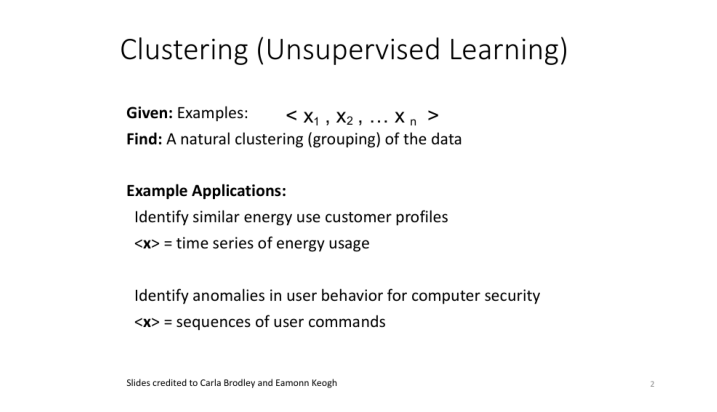

Question:

 What is the objective of clustering?

True Answer:

 The objective is to find a natural grouping of the data.

Predicted Answer:

   The objective of clustering is to identify clusters of similarity.  The objective of clustering is
to find and use clusters to construct a model of co-occurrence of features.  Cluster size is the
largest size of clusters that can be built by these techniques.  Cluster size is a linear measure of
the number of features in a cluster.  Cluster size is a hierarchical measure of the number of
features in a cluster.  Cluster size is the mean cluster size of the data in the sample.  Cluster
size can be used to estimate the number of clusters that could be constructed by a given data set.
Cluster size is the mean percentage of the size of the features in a cluster.  Cluster size is the
mean fraction of the size of the features in a cluster.  Cluster size is the mean fraction of the
features in a cluster that are in common.  Cluster size is the mean fr

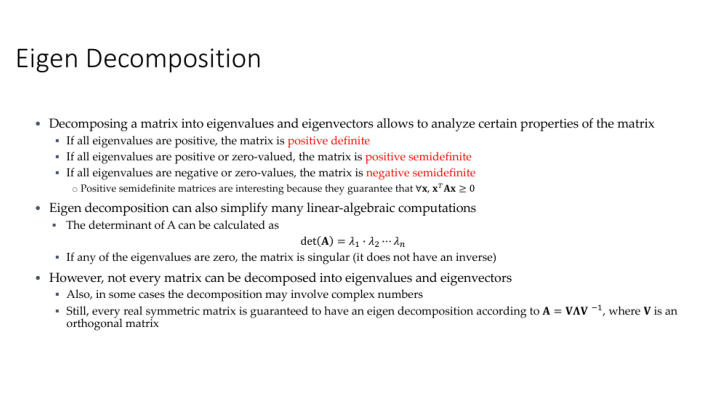

Question:

 How are negative semidefinite matrices defined?

True Answer:

 Negative semidefinite matrices have eigenvalues that are either negative or zero.

Predicted Answer:

   A positive semidefinite matrix is defined by a series of linear equations. The equations are then
expressed in terms of the variables in the matrix.  What are the technical terms used when stating a
matrix?  The terminology used in mathematics is defined by the National Institute of Standards and
Technology (NIST). NIST recommends that you use "matrix" instead of "matrix multiplication" when
describing the matrix multiplication operation.  Do I need to know the n-th term of a matrix?  No.
The n-th term of a matrix is determined by the n-th term of the sum of the first n terms of the
product.  What are the 4 basic arithmetic operators?  Arithmetic operators are defined as:  (a + b)
* (a – b)  (a + b) / (a – b)  (a + b) % (a – b)  (a + b) ÷ (a – b)  (a + b) <= (a – b)  (a + b) > (a
– b)  (a + b) >= (a – b)  (a

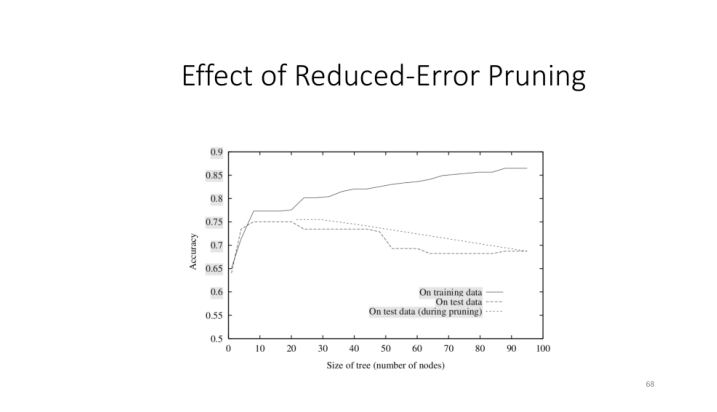

Question:

 How does the graph help in understanding overfitting?

True Answer:

 The graph shows that as the tree grows (more nodes), accuracy on training data increases, but test
data accuracy may decline, indicating potential overfitting.

Predicted Answer:

   If you look at the slope of the line, you can see that it is somewhat wrong. Function calls are
quite a bit higher than expected, and are more than 2x as likely as they should be. As the graph
looks at the exponent, it looks like the function is fitting the data very well. This is because the
exponent is so much lower than you would expect.  So what is happening here? We are not trying to
fit the data accurately. We simply want to fit the data as efficiently as possible.  If you have
used histograms before, then you might be familiar with the idea of negative binomial distributions.
This is a way of assigning probabilities to data that is packed into a bin. A negative binomial
distribution is a distribution that is biased to 

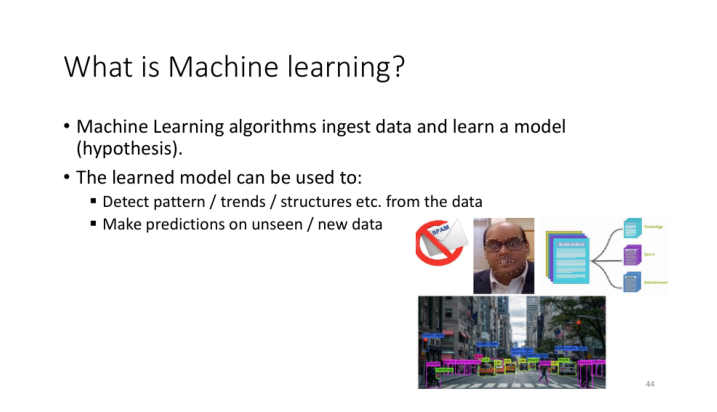

Question:

 Does Machine Learning require a lot of data?

True Answer:

 Typically, Machine Learning benefits from large datasets, but the amount of data required can vary
based on the specific problem and algorithm used.

Predicted Answer:

   Many of the new technologies in the world of machine learning are now being applied to real-world
problems. We use machine learning for training of our web applications and our mobile devices. We
use machine learning to improve our system for predicting traffic patterns in the city of New York.
We use machine learning for the training of our smart phones, and the mobile phones in the United
States. Our business is based on the many and varied uses of machine learning.  You have said that
AI and machine learning will have a huge impact on your business, but I also think that AI is
unproven. How much of this impact do you think is real? How much is just hype?  The future is so
unpredictable that we need to be very careful with what we say. But we 

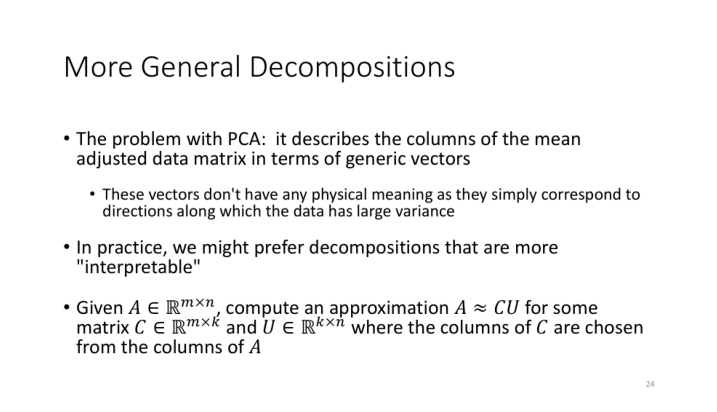

Question:

 Do the vectors used by PCA have physical meaning?

True Answer:

 No, the vectors used by PCA don't have any physical meaning.

Predicted Answer:

   How to answer this question is a little trickier. We need to take a look at the coordinates of the
origin of the output vector. The reason we have to do this is because every single point in our PCA
may have a different origin. To make matters worse, the PCA may contain the coordinates of the
origin but not the path itself. This means that the path may not be correct.  To solve this problem,
we have to find the location of the nearest point that has the properties that we want. In other
words, we need to find a point along the path.  So we need to perform a PCA on the vector of the
path. This vector is the path.  To find a point on the path, first we need to find the nearest point
on the path that has the property that we want.  Let's take a look at how you can do this. For this
example we'll use the path that we created in th

In [ ]:
torch.cuda.empty_cache()

# Sample 5 random rows from the train_df
samples = train_df[:5]
# samples = df_final.sample(n=10, random_state=2023)

for _, row in samples.iterrows():
    question = row['question']

    # Tokenize the question
    input_ids = tokenizer.encode(text = question, return_tensors = "pt", padding = True, truncation = True, max_length = max_value_q)
    attention_mask = torch.ones_like(input_ids)

    input_ids = input_ids.to(device)
    attention_mask = attention_mask.to(device)
    
    # Process the image
    image_path = row['path']
    image = Image.open(image_path).convert("RGB")


    # pixel_values = feature_extractor(images=image, return_tensors="pt")["pixel_values"]
    # image = pixel_values.squeeze(0)
    # image_tensor = pixel_values.to(device)

    inputs = feature_extractor(images = image, return_tensors = "pt")
    image_tensor = inputs["pixel_values"]
    image_tensor = image_tensor.to(device)

    # Print device information
    # print(f"input_ids device: {input_ids.device}")
    # print(f"attention_mask device: {attention_mask.device}")
    # print(f"image_tensor device: {image_tensor.device}")


    # Generate an answer with the model
    model.eval()  # Set the model to evaluation mode
    with torch.no_grad():
        generated_ids = model.generate_text(input_ids, attention_mask, image_tensor)
    generated_text = tokenizer.decode(generated_ids[0], skip_special_tokens = True)
    
    # Visualize the data
    plt.figure(figsize=(9, 9))
    raw_image = Image.open(image_path)
    plt.imshow(raw_image)
    plt.axis('off')
    plt.show()

    print(f"Question:\n\n {question}")
    print(f"\nTrue Answer:\n\n {textwrap.fill(row['answer'], width = 100)}")
    print(f"\nPredicted Answer:\n\n {textwrap.fill(generated_text, width = 100)}\n")
    print("="*50)

    del input_ids, attention_mask, image_tensor, generated_ids, generated_text

torch.cuda.empty_cache()

### Demo on Validation Samples (before training)

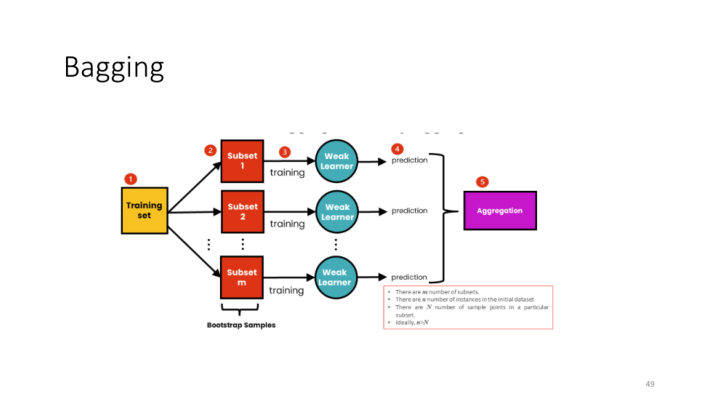

Question:

 What happens after the 'Weak Learner' makes a prediction?

True Answer:

 After the 'Weak Learner' makes a prediction, the predictions from all learners are aggregated for a
final output.

Predicted Answer:

   For the weak learner, the prediction is not the end of the story. The weak learner is not out of
luck. He or she can still go back to the school and learn from the teachers.  For a stronger
learner, the end of the story is that the teacher is now a 'weak learner'. The teacher gets a 'bad'
rating, and if the teacher had not given a bad rating, the learner would not have made the
prediction. The teacher is now 'weak'.  In both cases, the 'weak learner' is not out of luck.  What
happens to the teacher?  The teacher gets a 'bad' rating and loses the teaching job.  In both cases,
the teacher gets a 'bad' rating and loses the teaching job. As long as the 'weak learner' gets a bad
rating, the teacher will remain 'weak'.  Why is the 'weak learner' rated bad?  If the weak lea

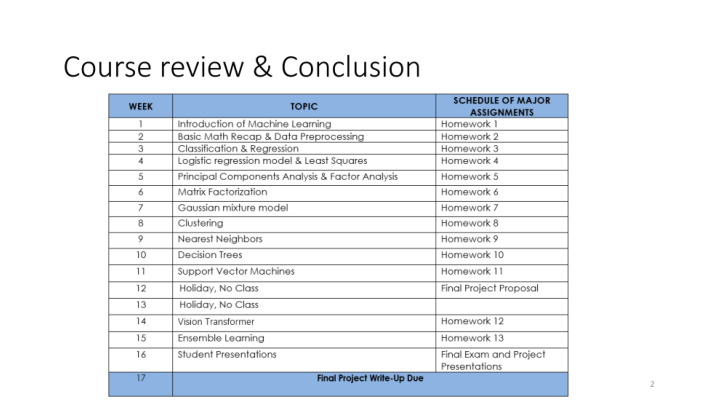

Question:

 What did we learn about in week 8?

True Answer:

 We learned about clustering in week 8.

Predicted Answer:

   1. They're good at pass rushing  The Texans rank eighth in the NFL in sacks, with 4.5 per game.
They've also ranked in the top 10 in receiving yards allowed (the Texans rank first in the NFL in
receiving yards allowed) and pass defense (12th).  What else?  The Texans have the league's worst
pass blocking unit, allowing a NFL-low 86.5 rushing yards per game.  The Texans rank ninth in the
NFL in rushing yards allowed per attempt, with 3.2 per attempt.  When you combine those numbers with
the Texans' pass blocking, it's not surprising that they're allowing 6.1 yards per carry, the fifth-
lowest rate in the NFL per Pro Football Focus.  2. They're great at making big plays on special
teams  The Texans have the 35th best special teams efficiency in the NFL, per Pro Football Focus.
They've forced 54.6 percent of their fumbles, which is good for 23rd in the NFL.  On the 

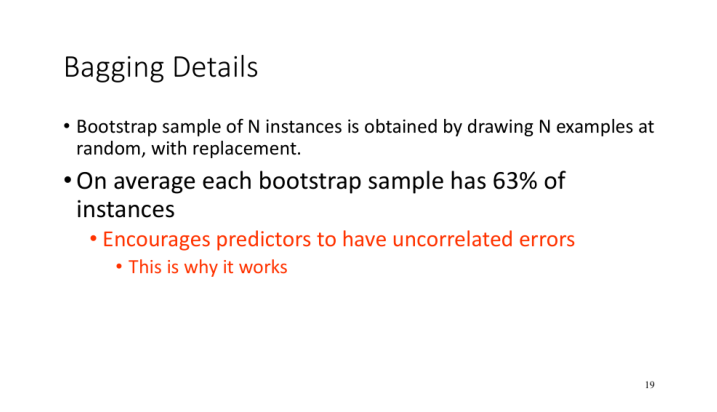

Question:

 Why is the statement 'This is why it works' mentioned?

True Answer:

 It emphasizes that having uncorrelated errors among predictors is the key reason Bagging is
effective.

Predicted Answer:

  Because it is the definition of the word 'work'.   The physical definition of work is 'an act
performed by an individual to obtain an immediate result'. This is the definition of work, or
something that you can do, not something you create, which is the definition of creativity. The
physical definition of what was created is just another way of saying the same thing.   The first
requirement of creative work is to create something. Creativity is the act of creating something,
and this is the only definition of what we can call creativity, which is the act of creating
something.   The second requirement of creative work is to give something away for free. This is the
definition of creativity, and it is the definition of what we call money.   The third requirement of
creative work is 

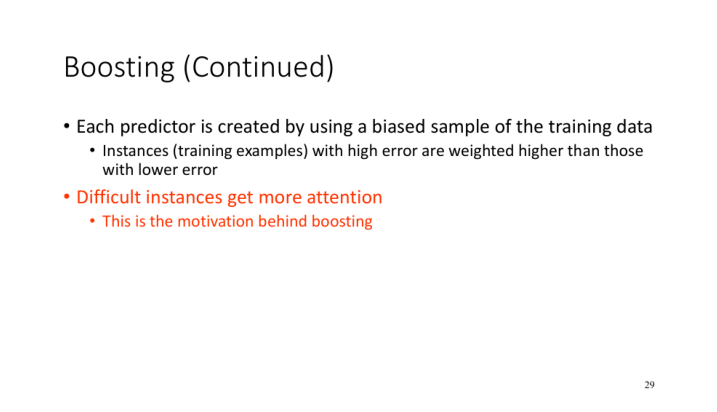

Question:

 How are predictors created in boosting?

True Answer:

 Predictors in boosting are created using a biased sample of the training data.

Predicted Answer:

   Boosting is a process in which multiple predictive models for a given task are combined into a
single model. This comprehensive model is then tested against each other for accuracy. This process
is called "boosting" and it is a common source of improvement in machine learning.  Probabilistic
modeling  In probabilistic modeling, the model is trained by using data from a large set of
interactions between a subject and a machine. The model is then tested against other models in the
same set.  For example, in a probabilistic model, you combine the data from a group of interactions
and predict the probability of each interaction. A probabilistic model can be trained using a large
number of observations, but the model is not directly a probabilistic one.  We have seen that from a
probabilistic modeling point of view, a singl

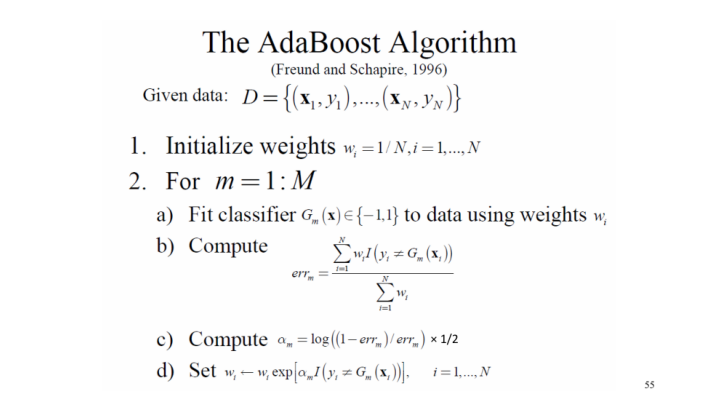

Question:

 What is the significance of weights in AdaBoost?

True Answer:

 Weights help AdaBoost prioritize misclassified instances in subsequent iterations.

Predicted Answer:

   Weight is an Ada language construct that is used as a command to manipulate the result of a
computation. A weight is a value of type Ada::Rational::Weight. The weight is used to differentiate
the result of a computation from a source of values. Weight can be used for both input and output.
A weight can be used to do the following:  Calculate the result of a computation  Calculate the
result of a computation and store it in a variable  Calculate and store the result of a computation
and store it in a variable (Goodbye, input/output)  Calculate and store the result of a computation
and store it in a variable (Goodbye, input/output) Store the result of the computation in a variable
Store the result of a computation in a variable (Goodbye, input/output) Store the result of a
computation and store it in a varia

In [ ]:
torch.cuda.empty_cache()

# Sample 5 random rows from the train_df
samples = val_df[:5]
# samples = df_final.sample(n=10, random_state=2023)

for _, row in samples.iterrows():
    question = row['question']

    # Tokenize the question
    input_ids = tokenizer.encode(text = question, return_tensors = "pt", padding = True, truncation = True, max_length = max_value_q)
    attention_mask = torch.ones_like(input_ids)

    input_ids = input_ids.to(device)
    attention_mask = attention_mask.to(device)
    
    # Process the image
    image_path = row['path']
    image = Image.open(image_path).convert("RGB")


    # pixel_values = feature_extractor(images=image, return_tensors="pt")["pixel_values"]
    # image = pixel_values.squeeze(0)
    # image_tensor = pixel_values.to(device)

    inputs = feature_extractor(images = image, return_tensors = "pt")
    image_tensor = inputs["pixel_values"]
    image_tensor = image_tensor.to(device)

    # Print device information
    # print(f"input_ids device: {input_ids.device}")
    # print(f"attention_mask device: {attention_mask.device}")
    # print(f"image_tensor device: {image_tensor.device}")


    # Generate an answer with the model
    model.eval()  # Set the model to evaluation mode
    with torch.no_grad():
        generated_ids = model.generate_text(input_ids, attention_mask, image_tensor)
    generated_text = tokenizer.decode(generated_ids[0], skip_special_tokens = True)
    
    # Visualize the data
    plt.figure(figsize=(9, 9))
    raw_image = Image.open(image_path)
    plt.imshow(raw_image)
    plt.axis('off')
    plt.show()

    print(f"Question:\n\n {question}")
    print(f"\nTrue Answer:\n\n {textwrap.fill(row['answer'], width = 100)}")
    print(f"\nPredicted Answer:\n\n {textwrap.fill(generated_text, width = 100)}\n")
    print("="*50)

    del input_ids, attention_mask, image_tensor, generated_ids, generated_text

torch.cuda.empty_cache()

## Training Loop

#### Auxiliary Functions

In [ ]:
def update_plots(loss_values_train, loss_values_val, print_messages):
    clear_output(wait = True)

    # Display print messages
    for message in print_messages:
        print(message)

    fig, ax1 = plt.subplots(1, 1, figsize = (9, 5))

    # Plot loss values
    ax1.plot(range(1, len(loss_values_train) + 1), loss_values_train, label = "Train Loss")
    ax1.plot(range(1, len(loss_values_val) + 1), loss_values_val, label = "Validation Loss")
    ax1.set_xlabel("Epoch")
    ax1.set_ylabel("Loss")
    ax1.legend()
    ax1.set_title("Loss Values")
    ax1.grid(linestyle = "--", linewidth = 0.75)

    plt.show()

def time_to_seconds(time_string):
    '''
    Input Format can be: '1 day, hh:mm:ss' or 'hh:mm:ss'
    '''
    # Initialize days to 0
    days = 0

    # Check if 'day' or 'days' is in the time_string
    if 'day' in time_string:
        
        # Split the string into the day part and the time part
        day_part, time_part = time_string.split(',', 1)

        # Extract the number of days
        days = int(day_part.split()[0])

        # The rest is the time string
        time_string = time_part.strip()

    # Now split the time string into its components
    time_components = time_string.split(':')
    hours = int(time_components[0])
    minutes = int(time_components[1])
    seconds = int(time_components[2])

    # Calculate total time in seconds including days
    time_in_seconds = days * 86400 + hours * 3600 + minutes * 60 + seconds

    return time_in_seconds

### Hyperparameters

In [ ]:
criterion = torch.nn.CrossEntropyLoss(ignore_index = tokenizer.pad_token_id)

### - The classes correspond to tokens in the output vocabulary.
### - The model is trying to predict the next token in the sequence, and Cross Entropy loss will penalize the model based on the difference between the predicted probabilities and the actual token.
### - Cross Entropy loss is the standard choice for sequence generation tasks.

In [ ]:
initial_learning_rate = 1e-6
optimizer = torch.optim.Adam(model.parameters(), lr = initial_learning_rate)
# optimizer = AdamW(model.parameters(), lr = initial_learning_rate, betas = (0.9, 0.999))

In [ ]:
# Try loading the optimizer state
# optimizer_state_path = './Data/Optimizers/optimizer_state_50_1 day, 3_58_00.pth'
# try:
#     optimizer_state = torch.load(optimizer_state_path, map_location=torch.device('cpu'))
#     optimizer.load_state_dict(optimizer_state)
#     print("Optimizer state loaded successfully.")
    
#     # Optionally, inspect the optimizer state
#     for var_name in optimizer_state:
#         print(var_name, "\t", optimizer_state[var_name])
# except Exception as e:
#     print("An error occurred while loading the optimizer state: ", e)

In [ ]:
# Setting up the scheduler:
scheduler = ReduceLROnPlateau(optimizer, mode='min', factor = 0.1, patience = 5, verbose = True)

In [ ]:
# # Load the scheduler state
# scheduler_state_dict = torch.load('scheduler_state.pth')
# scheduler.load_state_dict(scheduler_state_dict)

In [ ]:
# Total number of training epochs to run.
num_epochs = 50

## Training Loop

In [ ]:
# for param_group in optimizer.param_groups:
#         param_group['lr'] = 1e-6

In [ ]:
# from_beginning = True
from_beginning = False

In [ ]:
torch.cuda.empty_cache()

if from_beginning == False:
    # Read the DataFrame from the CSV file
    df = pd.read_csv('./data/training_outcomes/outcomes_VQAModel_25_07_04_34.csv')

    # Assign each column of the DataFrame to its respective list variable
    epoch_list = df['Epoch'].tolist()
    history_learning_rate = df['Learning_Rate'].tolist()
    loss_values_train = df['Train_Loss'].tolist()
    loss_values_val = df['Validation_Loss'].tolist()
    # acc_train = df['Train_Accuracy'].tolist()
    # acc_val = df['Validation_Accuracy'].tolist()
    epoch_time = df['Time'].tolist()

    print_messages = ['\n\t ****** Training has begun. ******\n']
    for i in range(0, epoch_list[-1]):
        message = f'Epoch: {epoch_list[i]:03} | Learning Rate : {history_learning_rate[i]:.6E} | Train Loss: {loss_values_train[i]:.8f} | Val Loss: {loss_values_val[i]:.8f} | Time: {epoch_time[i]}'#Train Acc: {acc_train[i]:.6f} | Val Acc: {acc_val[i]:.6f} | Time: {epoch_time[i]}'
        print_messages.append(message)

    starting_epoch = epoch_list[-1] + 1
    print(f"Starting epoch : {starting_epoch}")
    dt = time_to_seconds(epoch_time[-1])

else: 
    epoch_list = []
    loss_values_train = []
    loss_values_val = []
    # acc_train = []
    # acc_val = []
    history_learning_rate = []
    epoch_time = []

    starting_epoch = 1
    print_messages = ['\n\t ****** Training has begun. ******\n']
    dt = 0

Starting epoch : 26



	 ****** Training has begun. ******

Epoch: 001 | Learning Rate : 1.000000E-06 | Train Loss: 9.13788113 | Val Loss: 8.18541124 | Time: 00:16:28
Epoch: 002 | Learning Rate : 1.000000E-06 | Train Loss: 8.06441980 | Val Loss: 7.68468840 | Time: 00:32:44
Epoch: 003 | Learning Rate : 1.000000E-06 | Train Loss: 7.63659838 | Val Loss: 7.47510156 | Time: 00:49:10
Epoch: 004 | Learning Rate : 1.000000E-06 | Train Loss: 7.38722474 | Val Loss: 7.35900020 | Time: 01:05:41
Epoch: 005 | Learning Rate : 1.000000E-06 | Train Loss: 7.22378022 | Val Loss: 7.28819722 | Time: 01:22:12
Epoch: 006 | Learning Rate : 1.000000E-06 | Train Loss: 7.10314955 | Val Loss: 7.24617505 | Time: 01:38:34
Epoch: 007 | Learning Rate : 1.000000E-06 | Train Loss: 7.02033256 | Val Loss: 7.22866093 | Time: 01:54:57
Epoch: 008 | Learning Rate : 1.000000E-06 | Train Loss: 6.95643167 | Val Loss: 7.22255616 | Time: 02:11:23
Epoch: 009 | Learning Rate : 1.000000E-06 | Train Loss: 6.90840694 | Val Loss: 7.22726697 | Time: 02:27:45

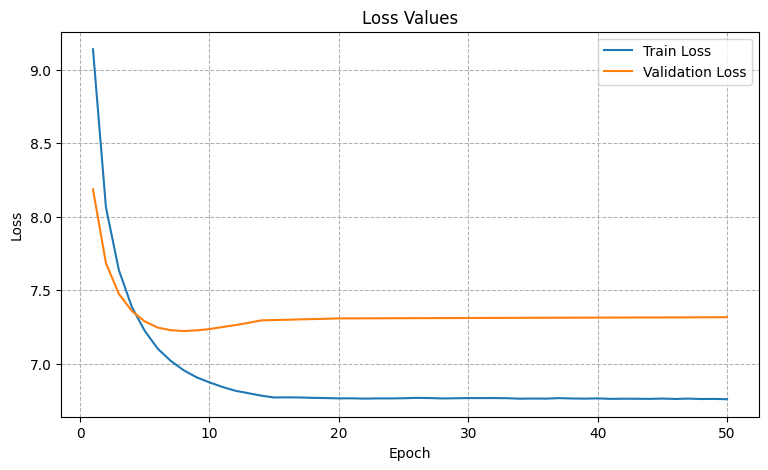

In [ ]:
start = timer()

update_plots(loss_values_train, loss_values_val, print_messages)#acc_train, acc_val, print_messages)

for epoch in range(starting_epoch, num_epochs + 1):
    epoch_list.append(epoch)
    history_learning_rate.append(optimizer.param_groups[0]['lr'])
    
    # ===========================  Training ===========================  
    model.train()

    # Training phase
    total_loss = 0
    # total_accuracy = 0

    train_progress_bar = tqdm(train_dataloader, desc = f"Training Epoch {epoch}", leave = False)
    for batch in train_progress_bar:
        

        input_ids = batch['input_ids'].to(device)
        attention_mask = batch['attention_mask'].to(device)
        image = batch['image'].to(device)
        decoder_input_ids = batch['decoder_input_ids'].to(device)
        decoder_attention_mask = batch['decoder_attention_mask'].to(device)
        
        # Zero the gradients
        optimizer.zero_grad()
        
        # Forward pass
        outputs = model(
            input_ids = input_ids, 
            attention_mask = attention_mask, 
            image = image, 
            decoder_input_ids = decoder_input_ids, 
            decoder_attention_mask = decoder_attention_mask
        )
        
        # Compute the loss
        logits = outputs
        loss = criterion(logits.view(-1, logits.size(-1)), decoder_input_ids.view(-1))
        # batch_accuracy = accuracy(logits, decoder_input_ids)
        
        # Backward pass
        loss.backward()

        # Update parameters
        optimizer.step()

        # Update total loss and accuracy
        total_loss += loss.item()
        # total_accuracy += batch_accuracy.item()

        # Update progress bar description with loss and accuracy
        train_progress_bar.set_postfix(lr = history_learning_rate[-1], loss = loss.item())#, accuracy = batch_accuracy.item())

    
    # Average loss and accuracy for the epoch
    avg_train_loss = total_loss / len(train_dataloader)
    # avg_train_accuracy = total_accuracy / len(train_dataloader)
    
    loss_values_train.append(avg_train_loss)
    # acc_train.append(avg_train_accuracy * 100)
    
    # =========================== Validation ===========================
    model.eval()

    total_val_loss = 0
    # total_val_accuracy = 0

    val_progress_bar = tqdm(val_dataloader, desc = f"Validation Epoch {epoch}", leave = False)
    with torch.no_grad():

        for batch in val_progress_bar:

            input_ids = batch['input_ids'].to(device)
            attention_mask = batch['attention_mask'].to(device)
            image = batch['image'].to(device)
            decoder_input_ids = batch['decoder_input_ids'].to(device)
            decoder_attention_mask = batch['decoder_attention_mask'].to(device)

            # Forward pass
            outputs = model(
                input_ids = input_ids, 
                attention_mask = attention_mask, 
                image = image, 
                decoder_input_ids = decoder_input_ids, 
                decoder_attention_mask = decoder_attention_mask
            )
            
            # Compute the loss and accuracy
            logits = outputs
            val_loss = criterion(logits.view(-1, logits.size(-1)), decoder_input_ids.view(-1))
            # batch_val_accuracy = accuracy(logits, decoder_input_ids)
            
            # Update total validation loss and accuracy
            total_val_loss += val_loss.item()
            # total_val_accuracy += batch_val_accuracy.item()

            # Update progress bar description with validation loss and accuracy
            val_progress_bar.set_postfix(val_loss = val_loss.item())#, val_accuracy = batch_val_accuracy.item())


    # Average validation loss and accuracy for the epoch
    avg_val_loss = total_val_loss / len(val_dataloader)
    # avg_val_accuracy = total_val_accuracy / len(val_dataloader)

    loss_values_val.append(avg_val_loss)
    # acc_val.append(avg_val_accuracy * 100)


    scheduler.step(avg_val_loss)


    
    # Print training statistics
    epoch_time.append(timedelta(seconds = int(timer() - start) + dt).__str__().zfill(8))
    message = f"Epoch: {epoch:03} | Learning Rate : {history_learning_rate[-1]:.6E} | Train Loss: {loss_values_train[-1]:.8f} | Val Loss: {loss_values_val[-1]:.8f} | Time: {epoch_time[-1]}"#| Train Acc: {acc_train[-1]:.6f} | Val Acc: {acc_val[-1]:.6f} | Time: {epoch_time[-1]}"
    print_messages.append(message)

    # Update the plots
    update_plots(loss_values_train, loss_values_val, print_messages)# acc_train, acc_val, print_messages)

# Wrap up the training process
end = timer()
message = '\n\n\t ****** Training has finished. ******\n'

print_messages.append(message)

print(message)

message = f'\tTraining time: {timedelta(seconds = int(end - start) + dt)} [hh:mm:ss]'
print_messages.append(message)
print(message)

# Update the plots
update_plots(loss_values_train, loss_values_val, print_messages)# acc_train, acc_val, print_messages)
    
# Release GPU memory
torch.cuda.empty_cache()

#### Saving the Model, Optimizer State, and Training Process Data

In [ ]:
print_messages[-2:]

['\n\n\t ****** Training has finished. ******\n',
 '\tTraining time: 13:48:54 [hh:mm:ss]']

In [ ]:
# Saving the Model
# torch.save(model, f'./data/models/model_{model.__class__.__name__}__{epoch_list[-1]}_{epoch_time[-1].replace(":", "_")}.pth')

In [ ]:
# Saving the Model Weights
torch.save(model.state_dict(), f'./data/models/model_weights_{model.__class__.__name__}__{epoch_list[-1]}_{epoch_time[-1].replace(":", "_")}.pth')

In [ ]:
# Save the optimizer state
torch.save(optimizer.state_dict(), f'./data/Optimizers/optimizer_state_{epoch_list[-1]}_{epoch_time[-1].replace(":", "_")}.pth')

In [ ]:
# Save the scheduler state
torch.save(scheduler.state_dict(),  f'./data/Schedulers/scheduler_state_{epoch_list[-1]}_{epoch_time[-1].replace(":", "_")}.pth')

In [ ]:
# Creating the DataFrame
outcomes = pd.DataFrame(
    {   'Epoch': epoch_list,
        'Learning_Rate': history_learning_rate,
        'Train_Loss': loss_values_train,
        'Validation_Loss': loss_values_val,
        # 'Train_Accuracy': acc_train,
        # 'Validation_Accuracy': acc_val,
        'Time': epoch_time,
    })

# saving the DataFrame as a CSV file
if epoch_list: # Check if epoch_list is not empty
    outcomes.to_csv(f'./data/training_outcomes/outcomes_{model.__class__.__name__}_{epoch_list[-1]}_{epoch_time[-1].replace(":", "_")}.csv', index = False)
else:
    print("epoch_list is empty, so the DataFrame cannot be saved with the specified filename format.")

### Demo on Trainig Samples (after training)

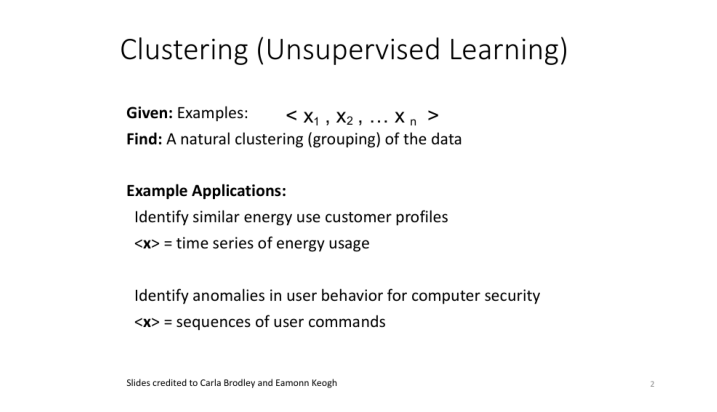

Question:

 What is the objective of clustering?

True Answer:

 The objective is to find a natural grouping of the data.

Predicted Answer:

  It is to produce a set of points that are as close to the original (in the image) as possible. A
number of clustering algorithms are used to achieve this. Clustering algorithms are like a sorting
algorithm using a higher weight to clusters that have more points. Clustering can also be used to
predict the distribution of a function when the values of the function are the same. The
distribution of a function, or the expected value of a function, can be predicted by clustering.
This is analogous to the way a data set can be classified and assigned to one class or the other.
For example, the distribution of a function can be predicted by clustering the functions in the data
set, or the numbers of the data points can be assigned to classes. When classes are used, we can
predict the expected values of the function based on how the function was classi

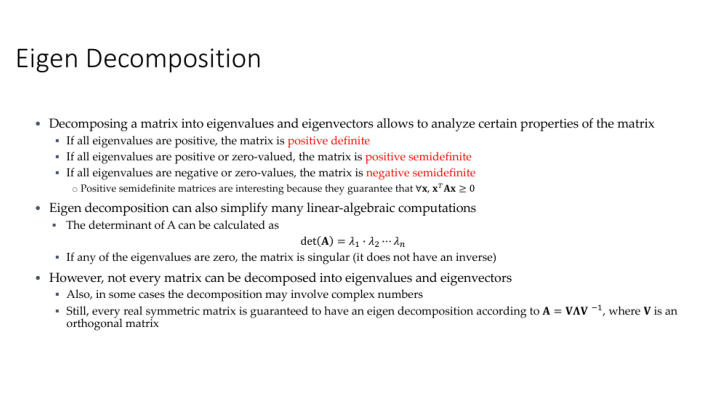

Question:

 How are negative semidefinite matrices defined?

True Answer:

 Negative semidefinite matrices have eigenvalues that are either negative or zero.

Predicted Answer:

  Let's use the CUDA function summation as a example.The first line of the function are the equation
that are used to calculate the diagonal of a negative matrix.The second line is the expected result
in the case of the matrix is in the diagonal of the positive matrix and the diagonal is negative,
zero vector ℁.The diagonal of the positive matrix is ℁-1, the diagonal of the negative matrix is −1,
and the difference of the two is the diagonal vector, the basis vector.The function is the same for
the two vectors.The result is the diagonal of a negative matrix matrix, which is a vector of
negative matrix matrix.The different values of the equation is a vector of matrices of matrix
quadrices, which is a representation of a matrix, which is a vector of matrix matrix, in a specific
dimension.The matrix quadrices are 

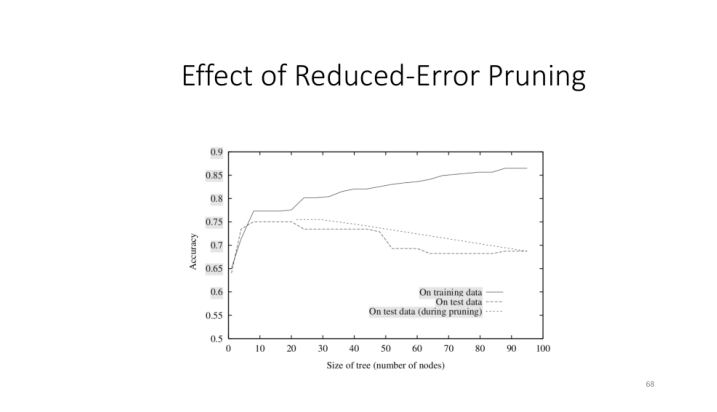

Question:

 How does the graph help in understanding overfitting?

True Answer:

 The graph shows that as the tree grows (more nodes), accuracy on training data increases, but test
data accuracy may decline, indicating potential overfitting.

Predicted Answer:

  The previous graphs from the is. be. decision tree used to compute the overfitting graph, was: the
output of the two-step process for the two components and given the axes of the output matrix. We
can do the other one in one step. As a final step we can transform the two-step function to a one-
step function. From the output of the two-step function we get the new axis of output using the
color function from the prior graph, like this: (1) the results of the two-step and one-step in the
above graph. And that is, from D.E. suggested function, the coefficients are the same. but be to the
output, in the new function, be first is in the two-dimensional matrix. but the input to be in the
one-dimensional matrix is the input of the t

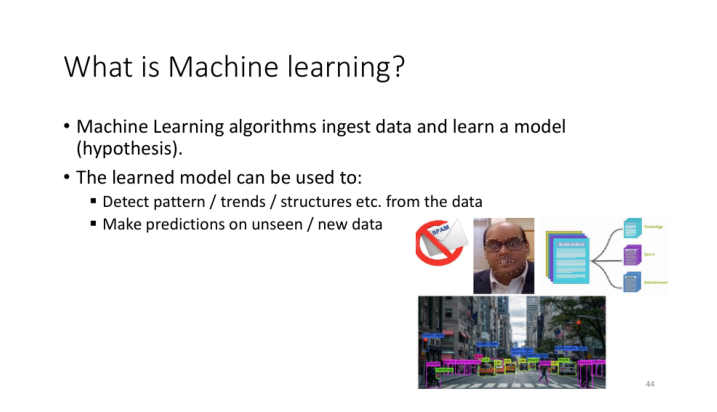

Question:

 Does Machine Learning require a lot of data?

True Answer:

 Typically, Machine Learning benefits from large datasets, but the amount of data required can vary
based on the specific problem and algorithm used.

Predicted Answer:

  Example data might include a database query or an image classification task, without much
information. Understanding how to extract the information from these data can be a challenging task.
The best way to analyze data can be in a data-driven, data-driven, data-driven, data-. So, the best
way to understand Machine Learning, in the context of this paper, is to use an example dataset, one
that you have already extracted the information. Import data, and the best way to analyze the data
is to use a linear regression or optimization algorithm, which can be the first tools that you can
use that are used to analyze data. For example, to use the standard linear regression the data and
the model are shown, and the error function is calculated using the 

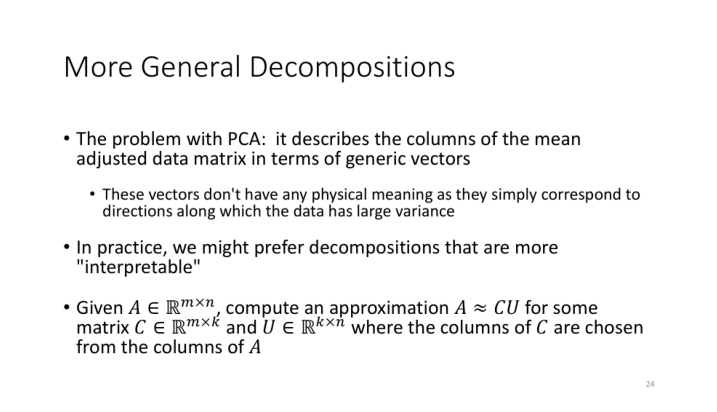

Question:

 Do the vectors used by PCA have physical meaning?

True Answer:

 No, the vectors used by PCA don't have any physical meaning.

Predicted Answer:

  Well, yes and no. As a rule of the, a vector is a local, or internal, transformation of a matrix,
the other vectors in PCA are not. So, a matrix is always a vector, and a vector is always a matrix.
I can see some argument that vectorx is an example of a vector. So, vectors are not a part of the
matrix, they are just a local transformation of the matrix. But, vectors can be used in a matrix.
So, in a matrix, a vector is like a matrix. The difference is that vectors are a relation in space-
time, not the exact representation of a matrix. And, vectors can be used in a matrix. A vector is a
numerical operation. A vector is an integral, but vector values can be represented in time. In the
computer, a vector can have values that are a time's distance to the origin. So, a matrix is useful
in all of these cases. The matrix is an approx

In [ ]:
torch.cuda.empty_cache()

# Sample 5 random rows from the train_df
samples = train_df[:5]
# samples = df_final.sample(n=10, random_state=2023)

for _, row in samples.iterrows():
    question = row['question']

    # Tokenize the question
    input_ids = tokenizer.encode(text = question, return_tensors = "pt", padding = True, truncation = True, max_length = max_value_q)
    attention_mask = torch.ones_like(input_ids)

    input_ids = input_ids.to(device)
    attention_mask = attention_mask.to(device)
    
    # Process the image
    image_path = row['path']
    image = Image.open(image_path).convert("RGB")


    # pixel_values = feature_extractor(images=image, return_tensors="pt")["pixel_values"]
    # image = pixel_values.squeeze(0)
    # image_tensor = pixel_values.to(device)

    inputs = feature_extractor(images = image, return_tensors = "pt")
    image_tensor = inputs["pixel_values"]
    image_tensor = image_tensor.to(device)

    # Print device information
    # print(f"input_ids device: {input_ids.device}")
    # print(f"attention_mask device: {attention_mask.device}")
    # print(f"image_tensor device: {image_tensor.device}")


    # Generate an answer with the model
    model.eval()  # Set the model to evaluation mode
    with torch.no_grad():
        generated_ids = model.generate_text(input_ids, attention_mask, image_tensor)
    generated_text = tokenizer.decode(generated_ids[0], skip_special_tokens = True)
    
    # Visualize the data
    plt.figure(figsize=(9, 9))
    raw_image = Image.open(image_path)
    plt.imshow(raw_image)
    plt.axis('off')
    plt.show()

    print(f"Question:\n\n {question}")
    print(f"\nTrue Answer:\n\n {textwrap.fill(row['answer'], width = 100)}")
    print(f"\nPredicted Answer:\n\n {textwrap.fill(generated_text, width = 100)}\n")
    print("="*50)

    del input_ids, attention_mask, image_tensor, generated_ids, generated_text

torch.cuda.empty_cache()

### Demo on Validation Samples (after training)

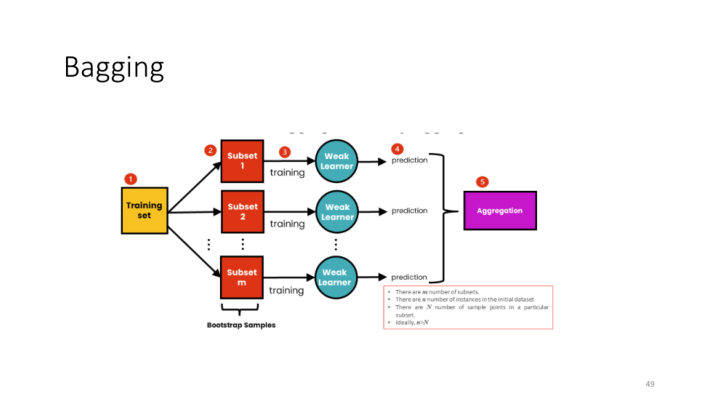

Question:

 What happens after the 'Weak Learner' makes a prediction?

True Answer:

 After the 'Weak Learner' makes a prediction, the predictions from all learners are aggregated for a
final output.

Predicted Answer:

  In the above case, you might see the 'Weak' variables as the predictions of a Machine Learning
model. The 'Reveal' variables are the predictions of the 'Weak' train and the 'Reveal' model, and
the 'A' variables are 'A model'. The 'A' variables are the predictors. The 'Reveal' model is used to
predict the 'A' variables. So, in the two cases, we have two classes of 'A' variables, the 'A' model
and the 'A' predictor variables. A 'Reveal' model predicts the 'A' variables, while the 'A' model
predicts the 'Reveal' and 'A' variables, which explains the the 'A' prediction model. So, in the
above example of 'learning' an 'A' variables, the 'A' predictor variables are the predictions of the
'Weak' models and the 'A' model is then used to predict the 'A' variables. It is quite 

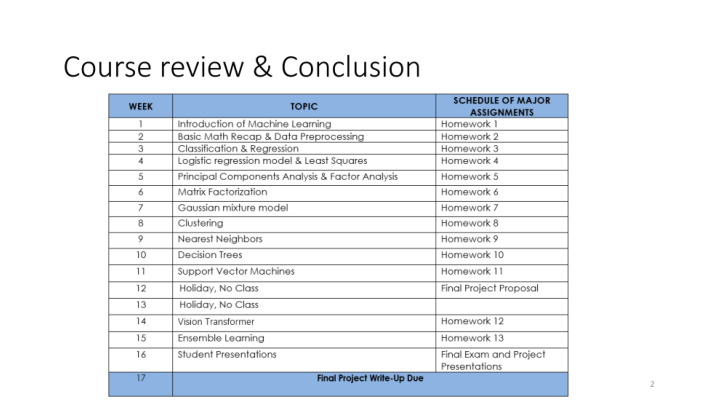

Question:

 What did we learn about in week 8?

True Answer:

 We learned about clustering in week 8.

Predicted Answer:

  What can we take away from the key points? The pieces of data we have are not just the conclusions
of a regression model calculated by a computer algorithm, but also the means by which the linear
function is computed. The model is a probabilistic model: we can simulate the data in the models,
and the values of the variables can be computed. And the values of the variables can be computed
many times. And the values of the variables can be computed many times. The data features that are
used in the model are the features of the data, not the features of the model. In other words, the
data features are used as the output of the model. So the main source of error is the model and the
data.The models the algorithm uses are the regression A and the logistic regression A. A regression
model is a probabilistic model. It is a probabilistic model in which the parameters, th

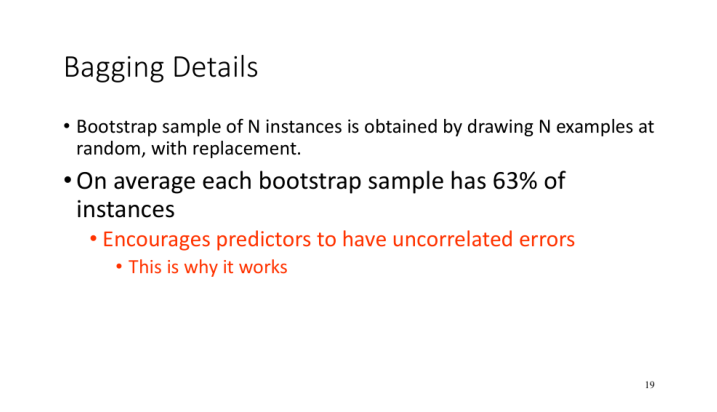

Question:

 Why is the statement 'This is why it works' mentioned?

True Answer:

 It emphasizes that having uncorrelated errors among predictors is the key reason Bagging is
effective.

Predicted Answer:

  It is mentioned because the point of the focus was on the function. It does not have to be the
function of the understanding. It is the function of understanding. It is the function of
understanding. (In the Thretistic approach, the point of the focus is not the function of the
understanding, which is the function of the understanding. It is not the function of the
understanding as the function to be used by the understanding. It is not the function of the
understanding as the function that is used in the understanding. It is not the function of the
others as the function to be applied by the understanding. It is not the function of the
understanding as the function to be used in the understanding. It is not the function of the others
as the function to be applied by the understand

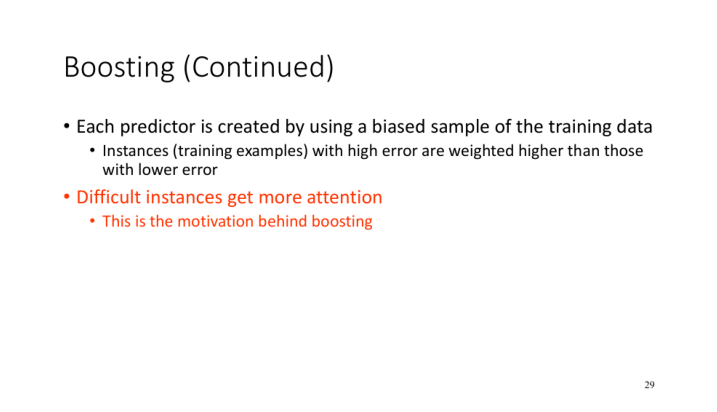

Question:

 How are predictors created in boosting?

True Answer:

 Predictors in boosting are created using a biased sample of the training data.

Predicted Answer:

  (F's, for instance, leave the next step up for their values, whilea-shaped a should be used for the
predicted value.) The factors in the model then calculate significance to the data, assigning
P(F|X,Y,1) the probability an F(X,Y,1) is true, and the likelihood is the 'classifier' of the data
of the the classifiers, the 'ClassifierThel is used to predict the value. (X has to be the output
data of the model, of course, not of the data it is predicting. So the classes are 'classifiers, the
classifier the data classification algorithm, the classifier the classifiers is the class the
classifiers are the best classifier, and the classifier is the best class of the classification
algorithm, and the classifiers are the best class predictors. X is the data, and the data
classification model is the model the model the model the m

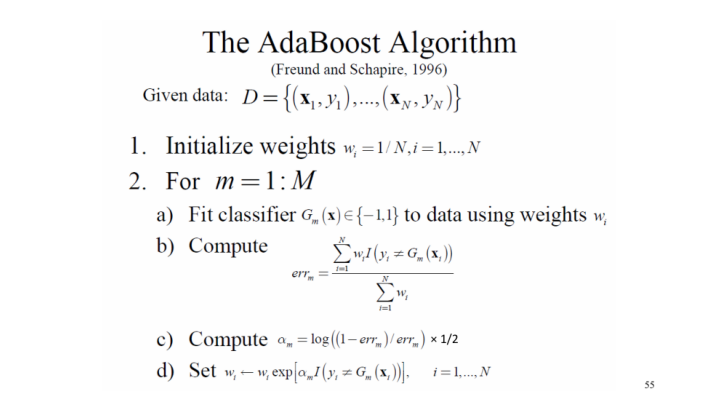

Question:

 What is the significance of weights in AdaBoost?

True Answer:

 Weights help AdaBoost prioritize misclassified instances in subsequent iterations.

Predicted Answer:

  You usually want to scale the order of values of the weights to be non-negative, which offers a
method of dealing with the problem of how to represent the value in the vector. It is also necessary
to slide the order of the values of the vectors, which ensures that the vector represents the list
of values in the vector. For example, to calculate the value of the vector may be the vector in the
order: x value, y value, z value, x value, y value, z value, x value, y value, z value, x value, y
value, z value and for the dimension class, x x, y y, z z. The slide ensures that the values are in
the same order. How to use weights in your function? In order to slide the weights, we have to use a
function with the name of the vector vector. For a parameter with the name of the vector vector, the
function should be ca

In [ ]:
torch.cuda.empty_cache()

# Sample 5 random rows from the train_df
samples = val_df[:5]
# samples = df_final.sample(n=10, random_state=2023)

for _, row in samples.iterrows():
    question = row['question']

    # Tokenize the question
    input_ids = tokenizer.encode(text = question, return_tensors = "pt", padding = True, truncation = True, max_length = max_value_q)
    attention_mask = torch.ones_like(input_ids)

    input_ids = input_ids.to(device)
    attention_mask = attention_mask.to(device)
    
    # Process the image
    image_path = row['path']
    image = Image.open(image_path).convert("RGB")


    # pixel_values = feature_extractor(images=image, return_tensors="pt")["pixel_values"]
    # image = pixel_values.squeeze(0)
    # image_tensor = pixel_values.to(device)

    inputs = feature_extractor(images = image, return_tensors = "pt")
    image_tensor = inputs["pixel_values"]
    image_tensor = image_tensor.to(device)

    # Print device information
    # print(f"input_ids device: {input_ids.device}")
    # print(f"attention_mask device: {attention_mask.device}")
    # print(f"image_tensor device: {image_tensor.device}")


    # Generate an answer with the model
    model.eval()  # Set the model to evaluation mode
    with torch.no_grad():
        generated_ids = model.generate_text(input_ids, attention_mask, image_tensor)
    generated_text = tokenizer.decode(generated_ids[0], skip_special_tokens = True)
    
    # Visualize the data
    plt.figure(figsize=(9, 9))
    raw_image = Image.open(image_path)
    plt.imshow(raw_image)
    plt.axis('off')
    plt.show()

    print(f"Question:\n\n {question}")
    print(f"\nTrue Answer:\n\n {textwrap.fill(row['answer'], width = 100)}")
    print(f"\nPredicted Answer:\n\n {textwrap.fill(generated_text, width = 100)}\n")
    print("="*50)

    del input_ids, attention_mask, image_tensor, generated_ids, generated_text

torch.cuda.empty_cache()

## __Evaluation Metrics__

### __Prediction on Validation Data__

In [ ]:
mat_val_df = val_df[["name","path","question","answer"]]
mat_val_df["predicted_answer"] = ""

In [ ]:
mat_val_df

,name,path,question,answer,predicted_answer
9203,week_15_page_049.png,.\data\imgs\week_15\week_15_page_049.png,What happens after the 'Weak Learner' makes a prediction?,"After the 'Weak Learner' makes a prediction, the predictions from all learners are aggregated for a final output.",
9306,week_16_page_003.png,.\data\imgs\week_16\week_16_page_003.png,What did we learn about in week 8?,We learned about clustering in week 8.,
8885,week_15_page_020.png,.\data\imgs\week_15\week_15_page_020.png,Why is the statement 'This is why it works' mentioned?,It emphasizes that having uncorrelated errors among predictors is the key reason Bagging is effective.,
8978,week_15_page_030.png,.\data\imgs\week_15\week_15_page_030.png,How are predictors created in boosting?,Predictors in boosting are created using a biased sample of the training data.,
9266,week_15_page_055.png,.\data\imgs\week_15\week_15_page_055.png,What is the significance of weights in AdaBoost?,Weights help AdaBoost prioritize misclassified instances in subsequent iterations.,
...,...,...,...,...,...
8733,week_15_page_006.png,.\data\imgs\week_15\week_15_page_006.png,"After creating multiple data sets, what's the next step?",The next step is to build multiple classifiers using the created data sets.,
9196,week_15_page_048.png,.\data\imgs\week_15\week_15_page_048.png,How do Boosting methods affect bias?,Boosting methods aim to decrease the bias of the prediction.,
9376,week_16_page_009.png,.\data\imgs\week_16\week_16_page_009.png,Which job role is 'Adobe' hiring for?,Adobe is hiring for the 'Machine Learning Engineer' role.,
9135,week_15_page_044.png,.\data\imgs\week_15\week_15_page_044.png,What follows the training of each weak model?,"After training each weak model, weights of the examples are adjusted using alphas.",


In [ ]:
torch.cuda.empty_cache()

# Predict and save the answers in the DataFrame
for index, row in mat_val_df.iterrows():
    image_path = row['path']  # Ensure this column contains the correct relative path
    question = row['question']

    input_ids = tokenizer.encode(text = question, return_tensors = "pt", padding = True, truncation = True, max_length = 128)
    attention_mask = torch.ones_like(input_ids)
    input_ids = input_ids.to(device)
    attention_mask = attention_mask.to(device)

    image = Image.open(image_path).convert('RGB')  # Assumes images are stored in popular formats like JPEG, PNG
    pixel_values = feature_extractor(images=image, return_tensors="pt")["pixel_values"]
    # image = pixel_values.squeeze(0)
    image_tensor = pixel_values.to(device)

    # Generate an answer with the model
    model.eval()  # Set the model to evaluation mode
    with torch.no_grad():
        generated_ids = model.generate_text(input_ids, attention_mask, image_tensor)
    generated_text = tokenizer.decode(generated_ids[0], skip_special_tokens = True)
    
    try:
        mat_val_df.at[index, "predicted_answer"] = generated_text
    except Exception as e:
        print(f"Error processing index {index}: {e}")
        mat_val_df.at[index, "predicted_answer"] = None

    torch.cuda.empty_cache()

In [ ]:
mat_val_df.head()

,name,path,question,answer,predicted_answer
9203,week_15_page_049.png,.\data\imgs\week_15\week_15_page_049.png,What happens after the 'Weak Learner' makes a prediction?,"After the 'Weak Learner' makes a prediction, the predictions from all learners are aggregated for a final output.","If we have a 'Theory' or 'Theoretical Model of the Language' of the 'Strong Learner' (in my example, the 'Weak Learner'), and we are willing to model the 'Theoretical Model of the Language' of the 'Strong Learner', then there is a very simple and easy problem to solve in the 'Theoretical Model'. If the 'Theoretical Model' actually is the 'Theoretical Model of the Language' of the 'Weak Learner', then you have the strength of the 'Theoretical Model' of the 'Weak Learner'.The problem is that if you don't model the 'Theoretical Model of the Language' of the 'Weak Learner', then the 'Theoretical Model of the Language' of the 'Strong Learner' will be a model of the 'Weak Learner'.This is the key problem. The 'Theoretical Model of the Language' of the 'Strong Learner' is a model of the'sustained learner'.It is, in many ways, the'sustained learner' of the 'Strong Learner'.The 'Theoretical Model of Language' of the 'Strong Learner' has a 'Theoretical Model of the Language' consisting of the 'Theoretical Model of the Language' of the 'Weak Learner'.The 'Theoretical Model of Language' of the 'Strong Learner' is the model of the'sustained learner'.The 'Theoretical Model of Language' of the 'Strong Learner' is the model of the'sustained learner'.The 'Theoretical Model of Language' of the 'Strong Learner' is the model of the'sustained learner'.The 'Theoretical Model of Language' of the 'Strong Learner' has a 'Theoretical Model of the Language' consisting of the 'Theoretical Model of the Language' of the 'Theoretical Model of the Language' of the 'Theoretical Model of the Language'.The 'Theoretical Model of Language' of the 'Strong Learner' has a 'Theoretical Model of the Language' consisting of the 'Theoretical Model of the Language' of the 'Theoretical Model of the Language'.The 'Theoretical Model of Language' of the 'Strong Learner' has a 'Theoret"
9306,week_16_page_003.png,.\data\imgs\week_16\week_16_page_003.png,What did we learn about in week 8?,We learned about clustering in week 8.,"\nThe team rented a space in a nearby restaurant, but they were still only paying for the total cost of the space, and not the cost of the equipment. They also missed one meal, which was expected, but the team was still under-budgeted by 5.5% of the total cost. The team got a service, which was a good sign, but they were also under-budgeted by 4.9% for food and phone. These are some of the problems you can face when you have no previous experience. Some of the problems the team are having are:\nThe gym is not working. They have used the time on the gym to build their new business, and are not brought in to fix it. The work on the weight room is done, and they are not needed to fix it. This is a huge problem for a team that has been in startups for more than a year. They have done a great job with their gym and the training, but they are not required to have a gym that is working. It is not as if the team is not using the weight room, and they will just have to get the equipment to work properly. It is not as if the team is not using the gym, and they will just have to get the equipment to work properly. It is not as if the team is not using the weight room, and they will just have to get the equipment to work properly. The cost of the food is not covering the people's normal daily expenses, and it is not covered by the utility. They are not being paid for the electricity or the water to the space. It is not as if the team is not using the space, and they will just have to get the equipment to work properly. It is not as if the team is not using the space, and they will just have to get the equipment to work properly. The cost of the space is not covering the cost of the equ

In [ ]:
# mat_val_df.to_csv("./Data/ViT_GPT2_val_pred.csv")

### __Prediction on Training Data__

In [ ]:
mat_train_df = train_df[["name","path","question","answer"]]
mat_train_df["predicted_answer"] = ""

In [ ]:
mat_train_df

,name,path,question,answer,predicted_answer
5054,week_07_page_003.png,.\data\imgs\week_07\week_07_page_003.png,What is the objective of clustering?,The objective is to find a natural grouping of the data.,
1502,week_02_page_035.png,.\data\imgs\week_02\week_02_page_035.png,How are negative semidefinite matrices defined?,Negative semidefinite matrices have eigenvalues that are either negative or zero.,
7475,week_10_page_069.png,.\data\imgs\week_10\week_10_page_069.png,How does the graph help in understanding overfitting?,"The graph shows that as the tree grows (more nodes), accuracy on training data increases, but test data accuracy may decline, indicating potential overfitting.",
553,week_01_page_045.png,.\data\imgs\week_01\week_01_page_045.png,Does Machine Learning require a lot of data?,"Typically, Machine Learning benefits from large datasets, but the amount of data required can vary based on the specific problem and algorithm used.",
4753,week_06_page_025.png,.\data\imgs\week_06\week_06_page_025.png,Do the vectors used by PCA have physical meaning?,"No, the vectors used by PCA don't have any physical meaning.",
...,...,...,...,...,...
4253,week_05_page_056.png,.\data\imgs\week_05\week_05_page_056.png,How many dimensions did we reduce?,Dimensions were reduced from 144D to 16D.,
3655,week_04_page_057.png,.\data\imgs\week_04\week_04_page_057.png,Can you explain this slide?,The slide presents formulas for estimating slope and intercept in regression and introduces definitions for covariance and variance.,
1661,week_02_page_049.png,.\data\imgs\week_02\week_02_page_049.png,Why is studying convex problems beneficial?,Studying convex problems is beneficial as it provides insights for advancing the field of machine learning.,
2139,week_03_page_027.png,.\data\imgs\week_03\week_03_page_027.png,Can KL divergence be negative?,"No, KL divergence is always non-negative. It's zero if two distributions are identical.",


In [ ]:
torch.cuda.empty_cache()

# Predict and save the answers in the DataFrame
for index, row in mat_train_df.iterrows():
    image_path = row['path']  # Ensure this column contains the correct relative path
    question = row['question']

    input_ids = tokenizer.encode(text = question, return_tensors = "pt", padding = True, truncation = True, max_length = 128)
    attention_mask = torch.ones_like(input_ids)
    input_ids = input_ids.to(device)
    attention_mask = attention_mask.to(device)

    image = Image.open(image_path).convert('RGB')  # Assumes images are stored in popular formats like JPEG, PNG
    pixel_values = feature_extractor(images=image, return_tensors="pt")["pixel_values"]
    # image = pixel_values.squeeze(0)
    image_tensor = pixel_values.to(device)

    # Generate an answer with the model
    model.eval()  # Set the model to evaluation mode
    with torch.no_grad():
        generated_ids = model.generate_text(input_ids, attention_mask, image_tensor)
    generated_text = tokenizer.decode(generated_ids[0], skip_special_tokens = True)
    
    try:
        mat_train_df.at[index, "predicted_answer"] = generated_text
    except Exception as e:
        print(f"Error processing index {index}: {e}")
        mat_train_df.at[index, "predicted_answer"] = None

    torch.cuda.empty_cache()

In [ ]:
# mat_train_df.to_csv("./Data/ViT_GPT2_train_pred.csv")

### Load the Predicted Answers

In [ ]:
mat_val_df = pd.read_csv("./Data/ViT_GPT2_val_pred.csv")
mat_val_df['answer'] = mat_val_df['answer'].astype(str)
mat_val_df['predicted_answer'] = mat_val_df['predicted_answer'].astype(str)

In [ ]:
mat_val_df.head()

,Unnamed: 0,name,path,question,answer,predicted_answer
0,9203,week_15_page_049.png,.\data\imgs\week_15\week_15_page_049.png,What happens after the 'Weak Learner' makes a prediction?,"After the 'Weak Learner' makes a prediction, the predictions from all learners are aggregated for a final output.","If we have a 'Theory' or 'Theoretical Model of the Language' of the 'Strong Learner' (in my example, the 'Weak Learner'), and we are willing to model the 'Theoretical Model of the Language' of the 'Strong Learner', then there is a very simple and easy problem to solve in the 'Theoretical Model'. If the 'Theoretical Model' actually is the 'Theoretical Model of the Language' of the 'Weak Learner', then you have the strength of the 'Theoretical Model' of the 'Weak Learner'.The problem is that if you don't model the 'Theoretical Model of the Language' of the 'Weak Learner', then the 'Theoretical Model of the Language' of the 'Strong Learner' will be a model of the 'Weak Learner'.This is the key problem. The 'Theoretical Model of the Language' of the 'Strong Learner' is a model of the'sustained learner'.It is, in many ways, the'sustained learner' of the 'Strong Learner'.The 'Theoretical Model of Language' of the 'Strong Learner' has a 'Theoretical Model of the Language' consisting of the 'Theoretical Model of the Language' of the 'Weak Learner'.The 'Theoretical Model of Language' of the 'Strong Learner' is the model of the'sustained learner'.The 'Theoretical Model of Language' of the 'Strong Learner' is the model of the'sustained learner'.The 'Theoretical Model of Language' of the 'Strong Learner' is the model of the'sustained learner'.The 'Theoretical Model of Language' of the 'Strong Learner' has a 'Theoretical Model of the Language' consisting of the 'Theoretical Model of the Language' of the 'Theoretical Model of the Language' of the 'Theoretical Model of the Language'.The 'Theoretical Model of Language' of the 'Strong Learner' has a 'Theoretical Model of the Language' consisting of the 'Theoretical Model of the Language' of the 'Theoretical Model of the Language'.The 'Theoretical Model of Language' of the 'Strong Learner' has a 'Theoret"
1,9306,week_16_page_003.png,.\data\imgs\week_16\week_16_page_003.png,What did we learn about in week 8?,We learned about clustering in week 8.,"\nThe team rented a space in a nearby restaurant, but they were still only paying for the total cost of the space, and not the cost of the equipment. They also missed one meal, which was expected, but the team was still under-budgeted by 5.5% of the total cost. The team got a service, which was a good sign, but they were also under-budgeted by 4.9% for food and phone. These are some of the problems you can face when you have no previous experience. Some of the problems the team are having are:\nThe gym is not working. They have used the time on the gym to build their new business, and are not brought in to fix it. The work on the weight room is done, and they are not needed to fix it. This is a huge problem for a team that has been in startups for more than a year. They have done a great job with their gym and the training, but they are not required to have a gym that is working. It is not as if the team is not using the weight room, and they will just have to get the equipment to work properly. It is not as if the team is not using the gym, and they will just have to get the equipment to work properly. It is not as if the team is not using the weight room, and they will just have to get the equipment to work properly. The cost of the food is not covering the people's normal daily expenses, and it is not covered by the utility. They are not being paid for the electricity or the water to the space. It is not as if the team is not using the space, and they will just have to get the equipment to work properly. It is not as if the team is not using the space, and they will just have to get the equipment to work properly. The cost of the space is not covering the 

In [ ]:
mat_train_df = pd.read_csv("./Data/ViT_GPT2_train_pred.csv")
mat_train_df['answer'] = mat_train_df['answer'].astype(str)
mat_train_df['predicted_answer'] = mat_train_df['predicted_answer'].astype(str)

In [ ]:
mat_train_df.head()

,Unnamed: 0,name,path,question,answer,predicted_answer
0,5054,week_07_page_003.png,.\data\imgs\week_07\week_07_page_003.png,What is the objective of clustering?,The objective is to find a natural grouping of the data.,"A presentation of the analysis of the data, which can be viewed as a 'Mapping the 'For-Profit' and 'Non-Profit'' groups'. The values of the 'For-Profit' and 'Non-Profit' are the values of the 'Smallest' and 'Maximum' values. These values are the decimals of the Euclidean distance between the two groups. The 'For-Profit' and 'Non-Profit' values are the decimals of the Euclidean distance between the two groups, with the 'Smallest' value being the'smallest Euclidean distance'. The 'Smallest' value corresponds to the average of the 'Maximum' values, and is the product of the Euclidean distances between the 'For-Profit' and 'Non-Profit' values. The 'Maximum' value corresponds to the average of the 'Smallest' values, and is the product of the Euclidean distances between the 'For-Profit' and 'Non-Profit' values. 'The 'For-Profit' and 'Non-Profit' values are the values used for the clustering of the data. The 'For-Profit' and 'Non-Profit' values are the values of the 'Smallest' and 'Maximum' values, which are the decimals of the Euclidean distance between the two groups. In the classification stage, the 'For-Profit' and 'Non-Profit' values are used to pass from the classification stage to the clustering stage. The 'For-Profit' value is the criterion to which to compare and in which the 'Non-Profit' value is to be compared. The 'Non-Profit' value is the criterion to which to compare and in which the 'For-Profit' value is to be compared. The 'Non-Profit' value is the criterion to which to compare and in which the 'For-Profit' value is to be compared. The 'For-Profit' and 'Non-Profit' values are the two main information factors used in the classification and clustering stage. The 'For-Profit' and 'Non-Profit' values are the two main information factors used in the clustering of the data. The 'For-Profit' and the 'Non-Profit' values"
1,1502,week_02_page_035.png,.\data\imgs\week_02\week_02_page_035.png,How are negative semidefinite matrices defined?,Negative semidefinite matrices have eigenvalues that are either negative or zero.,"For the class of negative semidefinite matrices, the value of the vector is the, and the value of the vector is the product of the matrix's coefficients. The value of the vector can be calculated from the matrix's coefficients, and the values of the two vector matrices can be calculated from their product. They are usually called classes. The class of a semidefinite matrix is the set of all the matrices in that class, and its square is the sum of their squares. In general, a row of the class of a matrix is the row of the matrix itself, and the first row of a class is the matrix itself. The vector's values can be calculated from the product of its values. In the examples in the first and second sections, the values of the two vectors in the matrix are the product of the values of the vectors in the matrices, and the two matrices' values are the product of the values of the matrix's rows, the matrix's columns, and the matrix's square. If the class of a matrix is of the form, the vector values of the class are the product of the values of the matrix's rows, the matrix's columns, and the matrix's square. In the examples in the first and second sections, the values of the two vectors in the matrix are the product of the values of the vectors in the matrices, and the two matrices' values are the product of the values of the matrix's rows, the matrix's columns, and the matrix's square. If the matrices have the same number of rows and columns, respectively, and the two matrices' values are the product of the values of the matrices, the matrix's class is the sum of the matrices' classes. It is often easier to think of the matrix's class as the set of all the matrices in that class, and the matrix's square a

### Cosine Similarity

In [ ]:
mat_train_df["Cosine_Similarity"] = ""
mat_val_df["Cosine_Similarity"] = ""

In [ ]:
def calculate_average_cosine_similarity(my_df):
    # Initialize the TF-IDF Vectorizer
    vectorizer = TfidfVectorizer()

    # Fit and transform the data
    vec = vectorizer.fit_transform(my_df['answer'].tolist() + my_df['predicted_answer'].tolist())

    # Calculate cosine similarities for each row
    my_df['Cosine_Similarity'] = [
        cosine_similarity(vec[i:i+1], vec[len(my_df) + i:len(my_df) + i + 1])[0][0]
        for i in range(len(my_df))
    ]

    # Calculate the average cosine similarity
    average_cosine_similarity = np.mean(my_df['Cosine_Similarity'])

    return my_df, average_cosine_similarity

In [ ]:
updated_mat_train_df, average_similarity = calculate_average_cosine_similarity(mat_train_df)

print("Average Cosine Similarity for the training data:", average_similarity)

Average Cosine Similarity for the training data: 0.13922084658203387


In [ ]:
updated_mat_val_df, average_similarity = calculate_average_cosine_similarity(mat_val_df)

print("Average Cosine Similarity for the validation data:", average_similarity)

Average Cosine Similarity for the validation data: 0.12787090698996437


### BLEU Score

In [ ]:
mat_train_df = updated_mat_train_df
mat_val_df = updated_mat_val_df

In [ ]:
mat_train_df["BLEU_Score"] = ""
mat_val_df["BLEU_Score"] = ""

In [ ]:
def calculate_bleu(actual, predicted):
    return sentence_bleu([actual.split()], predicted.split())

def calculate_and_add_bleu_scores(my_df):
    # Calculate BLEU scores for each row
    my_df['BLEU'] = my_df.apply(lambda row: calculate_bleu(row['answer'], row['predicted_answer']), axis=1)

    # Calculate the average BLEU score
    average_bleu_score = np.mean(my_df['BLEU'])

    return my_df, average_bleu_score

In [ ]:
updated_mat_train_df, average_bleu = calculate_and_add_bleu_scores(mat_train_df)
print("Average BLEU Score for training data:", average_bleu)

Average BLEU Score for training data: 0.00046218100007195176


In [ ]:
updated_mat_val_df, average_bleu = calculate_and_add_bleu_scores(mat_val_df)
print("Average BLEU Score for validation data:", average_bleu)

Average BLEU Score for validation data: 0.0003890329075754328


### ROUGE Score

In [ ]:
mat_train_df = updated_mat_train_df
mat_val_df = updated_mat_val_df

In [ ]:
mat_train_df["ROUGE_Score"] = ""
mat_val_df["ROUGE_Score"] = ""

In [ ]:
def calculate_and_add_rouge_scores(my_df):
    # Initialize Rouge
    rouge = Rouge()

    # Calculate ROUGE scores for each row
    rouge_scores = my_df.apply(lambda row: rouge.get_scores(row['predicted_answer'], row['answer'])[0]['rouge-l']['f'], axis=1)
    my_df['ROUGE_Score'] = rouge_scores

    # Calculate the average ROUGE score
    average_rouge_score = np.mean(rouge_scores)

    return my_df, average_rouge_score

In [ ]:
updated_mat_train_df, average_rouge = calculate_and_add_rouge_scores(mat_train_df)
print("Average ROUGE Score for training data:", average_rouge)

Average ROUGE Score for training data: 0.10119386697035593


In [ ]:
updated_mat_val_df, average_bleu = calculate_and_add_rouge_scores(mat_val_df)
print("Average ROUGE Score for validation data:", average_bleu)

Average ROUGE Score for validation data: 0.09305486472943304


In [ ]:
mat_train_df = updated_mat_train_df
mat_val_df = updated_mat_val_df

In [ ]:
mat_train_df.to_csv("./Data/ViT_GPT2_train_pred.csv")
mat_val_df.to_csv("./Data/ViT_GPT2_val_pred.csv")

In [ ]:
mat_train_df

,Unnamed: 0,name,path,question,answer,predicted_answer,Cosine_Similarity,BLEU,ROUGE_Score
0,5054,week_07_page_003.png,.\data\imgs\week_07\week_07_page_003.png,What is the objective of clustering?,The objective is to find a natural grouping of the data.,"A presentation of the analysis of the data, which can be viewed as a 'Mapping the 'For-Profit' and 'Non-Profit'' groups'. The values of the 'For-Profit' and 'Non-Profit' are the values of the 'Smallest' and 'Maximum' values. These values are the decimals of the Euclidean distance between the two groups. The 'For-Profit' and 'Non-Profit' values are the decimals of the Euclidean distance between the two groups, with the 'Smallest' value being the'smallest Euclidean distance'. The 'Smallest' value corresponds to the average of the 'Maximum' values, and is the product of the Euclidean distances between the 'For-Profit' and 'Non-Profit' values. The 'Maximum' value corresponds to the average of the 'Smallest' values, and is the product of the Euclidean distances between the 'For-Profit' and 'Non-Profit' values. 'The 'For-Profit' and 'Non-Profit' values are the values used for the clustering of the data. The 'For-Profit' and 'Non-Profit' values are the values of the 'Smallest' and 'Maximum' values, which are the decimals of the Euclidean distance between the two groups. In the classification stage, the 'For-Profit' and 'Non-Profit' values are used to pass from the classification stage to the clustering stage. The 'For-Profit' value is the criterion to which to compare and in which the 'Non-Profit' value is to be compared. The 'Non-Profit' value is the criterion to which to compare and in which the 'For-Profit' value is to be compared. The 'Non-Profit' value is the criterion to which to compare and in which the 'For-Profit' value is to be compared. The 'For-Profit' and 'Non-Profit' values are the two main information factors used in the classification and clustering stage. The 'For-Profit' and 'Non-Profit' values are the two main information factors used in the clustering of the data. The 'For-Profit' and the 'Non-Profit' values",0.090026,3.759393e-79,0.166667
1,1502,week_02_page_035.png,.\data\imgs\week_02\week_02_page_035.png,How are negative semidefinite matrices defined?,Negative semidefinite matrices have eigenvalues that are either negative or zero.,"For the class of negative semidefinite matrices, the value of the vector is the, and the value of the vector is the product of the matrix's coefficients. The value of the vector can be calculated from the matrix's coefficients, and the values of the two vector matrices can be calculated from their product. They are usually called classes. The class of a semidefinite matrix is the set of all the matrices in that class, and its square is the sum of their squares. In general, a row of the class of a matrix is the row of the matrix itself, and the first row of a class is the matrix itself. The vector's values can be calculated from the product of its values. In the examples in the first and second sections, the values of the two vectors in the matrix are the product of the values of the vectors in the matrices, and the two matrices' values are the product of the values of the matrix's rows, the matrix's columns, and the matrix's square. If the class of a matrix is of the form, the vector values of the class are the product of the values of the matrix's rows, the matrix's columns, and the matrix's square. In the examples in the first and second sections, the values of the two vectors in the matrix are the product of the values of the vectors in the matrices, and the two matrices' values are the product of the values of the matrix's rows, the matrix's columns, and the matrix's square. If the matrices have the same number of rows and columns, respectively, and the two matrices' values are the product of the values of the matrices, the matrix's class is the sum of the matrices' classes. It is often easier to think of the matrix's class as th

In [ ]:
mat_val_df

,Unnamed: 0,name,path,question,answer,predicted_answer,Cosine_Similarity,BLEU,ROUGE_Score
0,9203,week_15_page_049.png,.\data\imgs\week_15\week_15_page_049.png,What happens after the 'Weak Learner' makes a prediction?,"After the 'Weak Learner' makes a prediction, the predictions from all learners are aggregated for a final output.","If we have a 'Theory' or 'Theoretical Model of the Language' of the 'Strong Learner' (in my example, the 'Weak Learner'), and we are willing to model the 'Theoretical Model of the Language' of the 'Strong Learner', then there is a very simple and easy problem to solve in the 'Theoretical Model'. If the 'Theoretical Model' actually is the 'Theoretical Model of the Language' of the 'Weak Learner', then you have the strength of the 'Theoretical Model' of the 'Weak Learner'.The problem is that if you don't model the 'Theoretical Model of the Language' of the 'Weak Learner', then the 'Theoretical Model of the Language' of the 'Strong Learner' will be a model of the 'Weak Learner'.This is the key problem. The 'Theoretical Model of the Language' of the 'Strong Learner' is a model of the'sustained learner'.It is, in many ways, the'sustained learner' of the 'Strong Learner'.The 'Theoretical Model of Language' of the 'Strong Learner' has a 'Theoretical Model of the Language' consisting of the 'Theoretical Model of the Language' of the 'Weak Learner'.The 'Theoretical Model of Language' of the 'Strong Learner' is the model of the'sustained learner'.The 'Theoretical Model of Language' of the 'Strong Learner' is the model of the'sustained learner'.The 'Theoretical Model of Language' of the 'Strong Learner' is the model of the'sustained learner'.The 'Theoretical Model of Language' of the 'Strong Learner' has a 'Theoretical Model of the Language' consisting of the 'Theoretical Model of the Language' of the 'Theoretical Model of the Language' of the 'Theoretical Model of the Language'.The 'Theoretical Model of Language' of the 'Strong Learner' has a 'Theoretical Model of the Language' consisting of the 'Theoretical Model of the Language' of the 'Theoretical Model of the Language'.The 'Theoretical Model of Language' of the 'Strong Learner' has a 'Theoret",0.191908,1.416260e-155,0.142857
1,9306,week_16_page_003.png,.\data\imgs\week_16\week_16_page_003.png,What did we learn about in week 8?,We learned about clustering in week 8.,"\nThe team rented a space in a nearby restaurant, but they were still only paying for the total cost of the space, and not the cost of the equipment. They also missed one meal, which was expected, but the team was still under-budgeted by 5.5% of the total cost. The team got a service, which was a good sign, but they were also under-budgeted by 4.9% for food and phone. These are some of the problems you can face when you have no previous experience. Some of the problems the team are having are:\nThe gym is not working. They have used the time on the gym to build their new business, and are not brought in to fix it. The work on the weight room is done, and they are not needed to fix it. This is a huge problem for a team that has been in startups for more than a year. They have done a great job with their gym and the training, but they are not required to have a gym that is working. It is not as if the team is not using the weight room, and they will just have to get the equipment to work properly. It is not as if the team is not using the gym, and they will just have to get the equipment to work properly. It is not as if the team is not using the weight room, and they will just have to get the equipment to work properly. The cost of the food is not covering the people's normal daily expenses, and it is not covered by the utility. They are not being paid for the electricity or the water to the space. It is not as if the team is not using the space, and they will just have to get the equipment to work properly. It is not as if the team is not using the space, and they will just have to get the equ

# Pix2Struct: Screenshot Parsing as Pretraining for Visual Language Understanding

https://arxiv.org/abs/2210.03347

In [23]:
model = Pix2StructForConditionalGeneration.from_pretrained("google/pix2struct-docvqa-large", torch_dtype=torch.bfloat16).to(device)
processor = Pix2StructProcessor.from_pretrained("google/pix2struct-docvqa-large")

In [24]:
# Load the model weights
def load_model(model_path):
    # Initialize the model
    # model = MyModel()

    # Load the state dict (the model weights)
    try:
        model.load_state_dict(torch.load(model_path))
        print("Model loaded successfully.")
    except Exception as e:
        print("Error loading model: ", e)
    
    torch.cuda.empty_cache()

In [25]:
# Replace 'model.pth' with the path to your model file
model_path = './data/models/model_weights_Pix2StructForConditionalGeneration__3_2 days, 3_10_28.pth'
load_model(model_path)

Model loaded successfully.


In [26]:
# Get the EOS token
eos_token =  processor.tokenizer.eos_token
eos_token_id =  processor.tokenizer.eos_token_id

# Get the BOS token
bos_token =  processor.tokenizer.bos_token
bos_token_id =  processor.tokenizer.bos_token_id

# Get the PAD token
pad_token =  processor.tokenizer.pad_token
pad_token_id =  processor.tokenizer.pad_token_id

print("EOS token:", eos_token)
print("EOS token ID:", eos_token_id)
print("BOS token:", bos_token)
print("BOS token ID:", bos_token_id)
print("PAD token:", pad_token)
print("PAD token ID:", pad_token_id)

Using bos_token, but it is not set yet.


EOS token: </s>
EOS token ID: 1
BOS token: None
BOS token ID: None
PAD token: <pad>
PAD token ID: 0


In [27]:
# Model Parameters
total_params = sum(p.numel() for p in model.parameters())
total_trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)

print(f"{total_params:,} total model parameters")
print(f"{total_trainable_params:,} model trainable parameters")

print(f"\nIs my model in GPU? : {next(model.parameters()).is_cuda}\n")

# GPU memory cache size
if torch.cuda.is_available():
    print(f"The allocated memory in the GPU for the model : {torch.cuda.memory_allocated()/(1024 * 1024):.3f} MB")

1,336,107,264 total model parameters
1,336,107,264 model trainable parameters

Is my model in GPU? : True

The allocated memory in the GPU for the model : 2590.524 MB


## Creating Dataset

In [28]:
# Extract week number from the 'name' column
df_final['week'] = df_final['name'].str.extract(r'week_(\d+)').astype(int)

#### Split the Dataset

In [29]:
# Split the DataFrame based on week number
train_df = df_final[df_final['week'].between(1, 14)]
val_df = df_final[df_final['week'].between(15, 16)]

#### Shuffle the dataset

In [ ]:
# train_df = shuffle(train_df, random_state = 2020)
# val_df = shuffle(val_df, random_state = 2023)

#### Custom Dataset Classes

In [30]:
class VQADataset(Dataset):
    def __init__(self, dataframe, processor):
        self.data = dataframe
        self.processor = processor

    def __len__(self):
        return len(self.data)

    def __getitem__(self, index):
        row = self.data.iloc[index]
        image_path = row['path']
        question = row['question']
        answer = row['answer']

        # Load the image and handle errors
        try:
            image = Image.open(image_path).convert("RGB")
        except (FileNotFoundError, OSError) as e:
            print(f"Error loading image {image_path}: {e}")
            return None

        # Process the image and the question using Pix2StructProcessor
        processed_inputs = self.processor(images = image, text = row['question'], return_tensors = "pt")


        # Process the answer text using Pix2StructProcessor
        true_answer = self.processor.tokenizer(text = answer, return_tensors = 'pt', padding = 'max_length', max_length = max_value_a)
        labels = true_answer.input_ids.squeeze()

        # Prepare the inputs for the model
        inputs = {
            'flattened_patches': processed_inputs['flattened_patches'].squeeze(0).to(dtype=torch.bfloat16),
            'attention_mask': processed_inputs['attention_mask'].squeeze(0).to(dtype=torch.bfloat16),
            'labels': labels
        }

        return inputs

In [50]:
# dataset = VQADataset(dataframe=train_df, processor=processor)

In [43]:
# # Choose an index to inspect, for example 0
# index_to_inspect = 0

# # Manually call the __getitem__ method
# data_point = dataset.__getitem__(index_to_inspect)

In [66]:
# print(model.forward.__doc__)

#### Instantiate the Datasets and DataLoaders

In [31]:
batch_size = 1

In [32]:
# Instantiate the datasets
train_dataset = VQADataset(train_df, processor)
val_dataset = VQADataset(val_df, processor)

print(f'Total number of samples in the train dataset: {len(train_dataset)}')
print(f'Total number of samples in the val dataset: {len(val_dataset)}')

Total number of samples in the train dataset: 8681
Total number of samples in the val dataset: 735


In [33]:
# Instantiate the data loaders
train_dataloader = DataLoader(train_dataset, batch_size = batch_size, shuffle = True)
val_dataloader = DataLoader(val_dataset, batch_size = batch_size, shuffle = False)

In [34]:
# Get a batch of data
for batch in train_dataloader:
    print(f"\nTrain Flattened Patches dimensions: {batch['flattened_patches'].shape}")
    print(f"Train Attention Mask dimensions: {batch['attention_mask'].shape}")
    print(f"Train Labels dimensions: {batch['labels'].shape}")
    
    break  # only print the first batch


Train Flattened Patches dimensions: torch.Size([1, 2048, 770])
Train Attention Mask dimensions: torch.Size([1, 2048])
Train Labels dimensions: torch.Size([1, 499])


In [35]:
# Get a batch of data
for batch in val_dataloader:
    print(f"\nValid Flattened Patches dimensions: {batch['flattened_patches'].shape}")
    print(f"Valid Attention Mask dimensions: {batch['attention_mask'].shape}")
    print(f"Valid Labels dimensions: {batch['labels'].shape}")
    
    break  # only print the first batch


Valid Flattened Patches dimensions: torch.Size([1, 2048, 770])
Valid Attention Mask dimensions: torch.Size([1, 2048])
Valid Labels dimensions: torch.Size([1, 499])


## Test model functionality on a few samples

### Demo on Trainig Samples (before training)

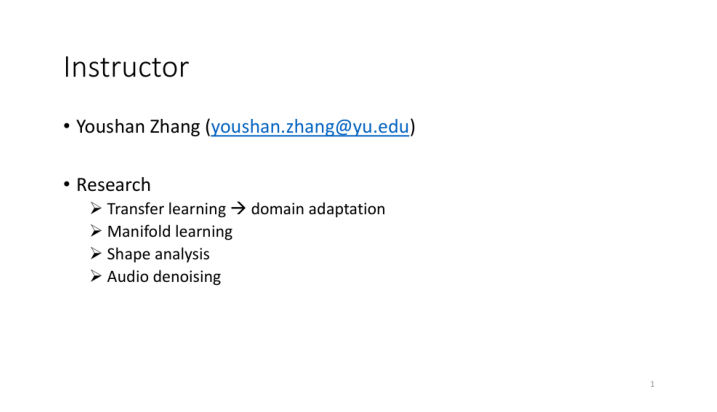

Question:

 Can you explain this slide?

True Answer:

 This slide provides information about the instructor, Youshan Zhang, including his email and main
research areas like transfer learning, manifold learning, and audio denoising.

Predicted Answer:

 Instructor



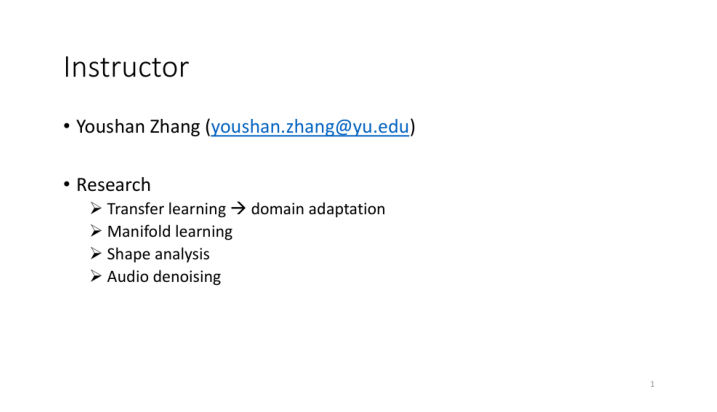

Question:

 Who is the instructor mentioned in the slide?

True Answer:

 The instructor mentioned in the slide is Youshan Zhang.

Predicted Answer:

 Youshan Zhang



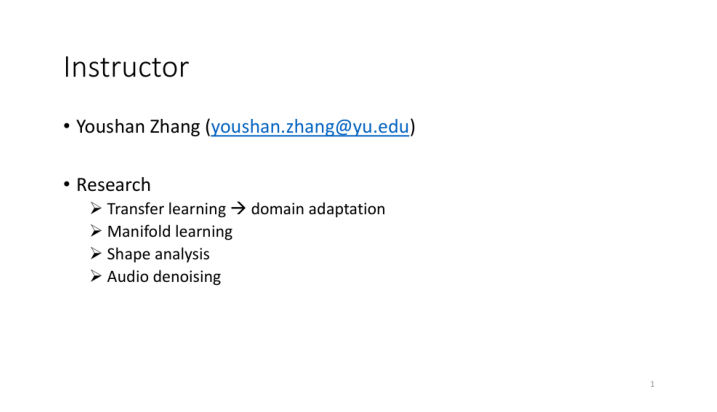

Question:

 What is the email of the instructor?

True Answer:

 The instructor's email is youshan.zhang@yu.edu.

Predicted Answer:

 youshan.zhang@yu.edu



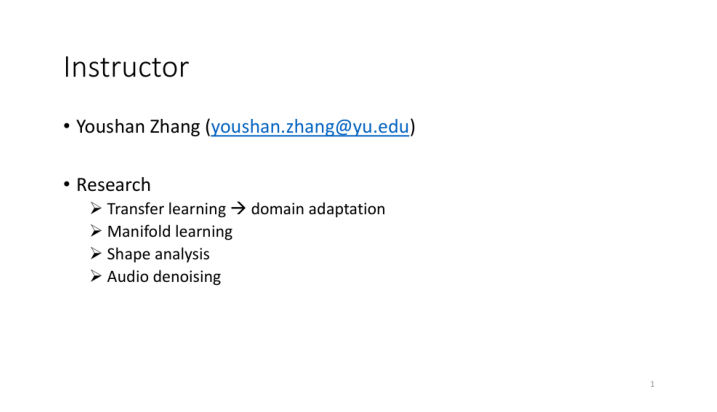

Question:

 Does Youshan Zhang specialize in audio denoising?

True Answer:

 Yes, audio denoising is one of Youshan Zhang's research areas.

Predicted Answer:

 Research



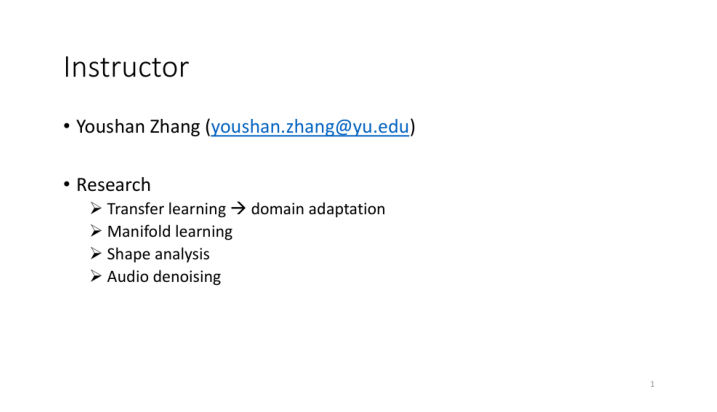

Question:

 What is transfer learning in relation to?

True Answer:

 Transfer learning is related to domain adaptation, as mentioned in the slide.

Predicted Answer:

 domain adaptation



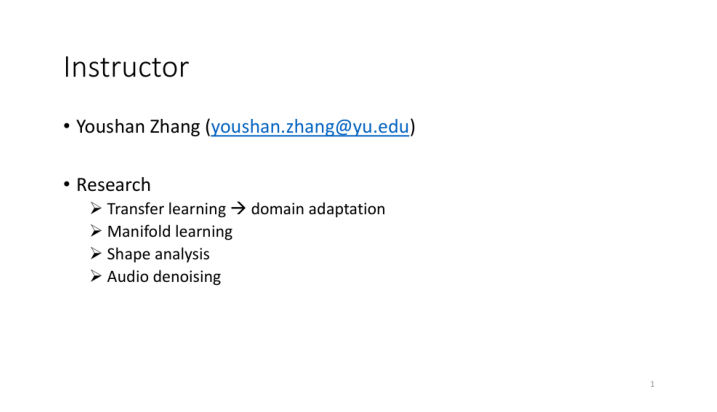

Question:

 List some research areas of the instructor.

True Answer:

 Some research areas are transfer learning, manifold learning, shape analysis, and audio denoising.

Predicted Answer:

 Transfer learning > domain adaptation



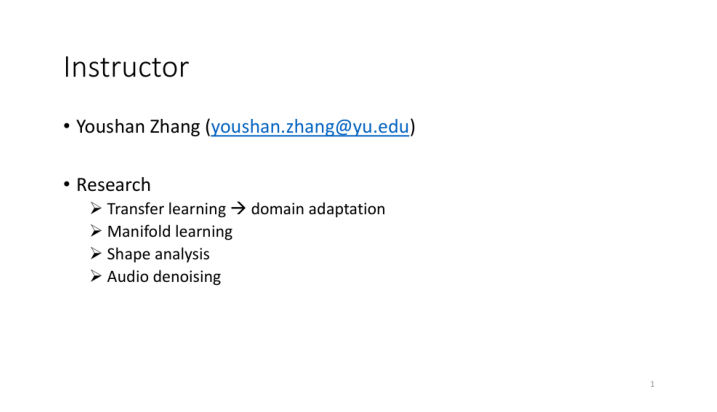

Question:

 Is manifold learning one of the research areas?

True Answer:

 Yes, manifold learning is one of the research areas.

Predicted Answer:

 Transfer learning > domain adaptation



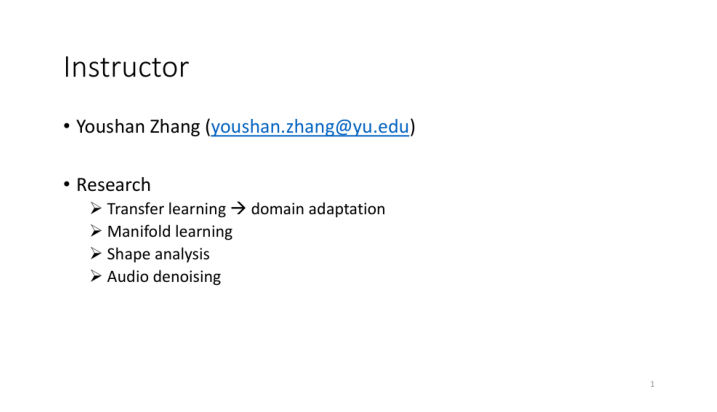

Question:

 Brainstorm applications of audio denoising.

True Answer:

 Applications can include voice assistants, hearing aids, audio recording, and telecommunication.

Predicted Answer:

 Brainstorm applications of audio denoising.



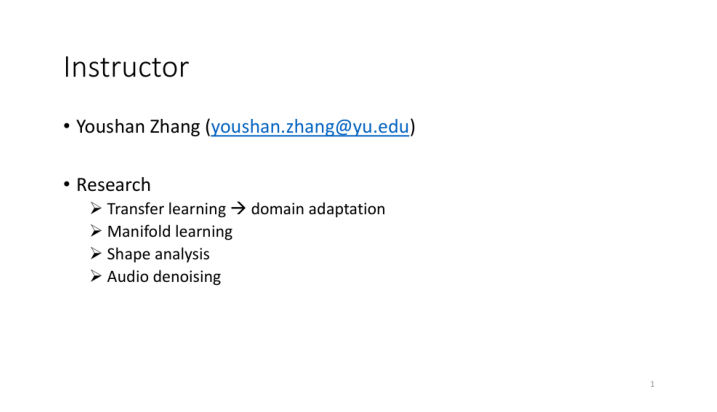

Question:

 What can transfer learning be used for?

True Answer:

 Transfer learning can be used for domain adaptation, enabling a model trained on one domain to work
on another.

Predicted Answer:

 domain adaptation



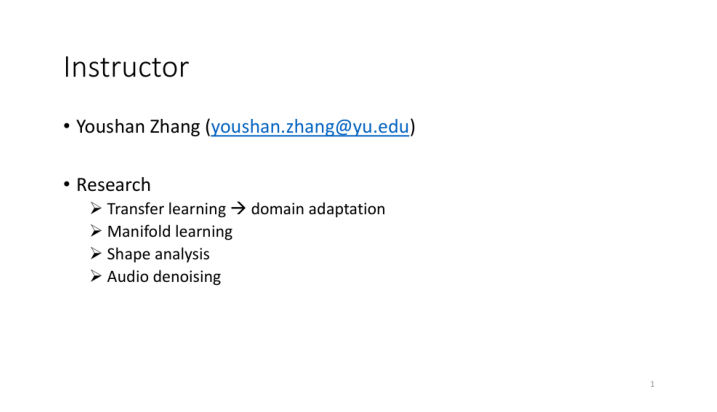

Question:

 What is the page number of this slide?

True Answer:

 The page number of this slide is 2.

Predicted Answer:

 1



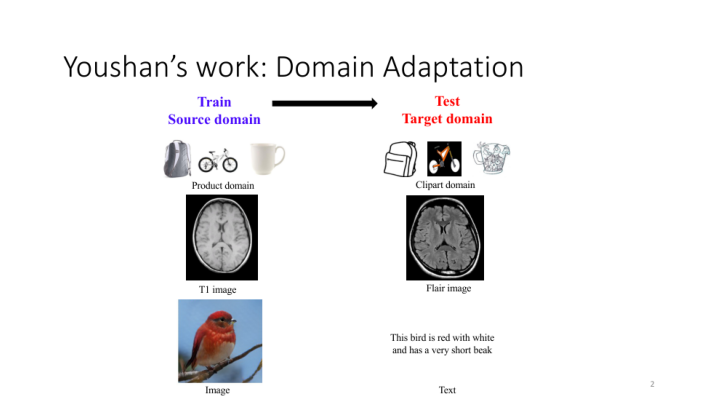

Question:

 Can you explain this slide?

True Answer:

 The slide illustrates Youshan's work on domain adaptation, showing the transition from source
domains like products to target domains like cliparts.

Predicted Answer:

 Domain Adaptation



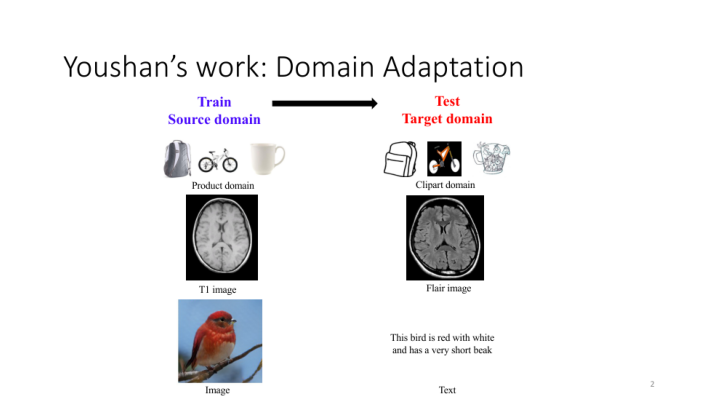

Question:

 What is the main topic of this slide?

True Answer:

 The main topic of the slide is 'Domain Adaptation' showcasing Youshan's work.

Predicted Answer:

 Domain Adaptation



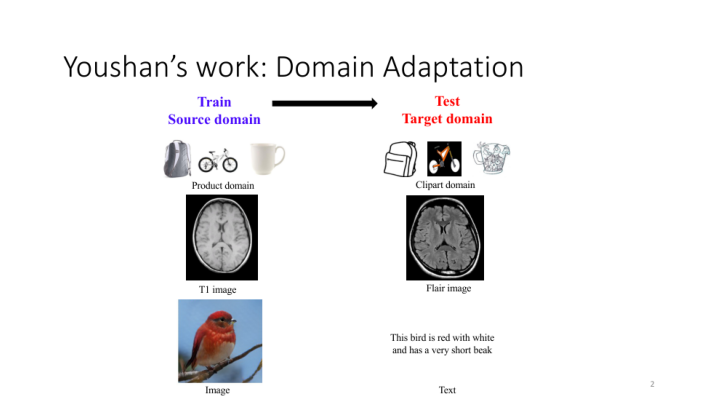

Question:

 Which domains are used for training?

True Answer:

 The source domain used for training includes the product domain and images.

Predicted Answer:

 Source domain



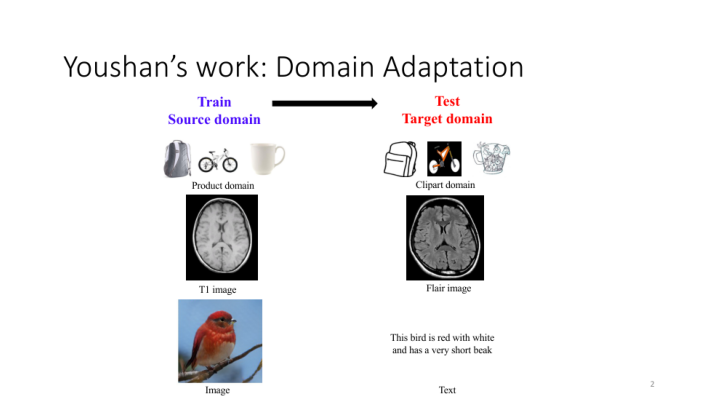

Question:

 Which domains are tested on?

True Answer:

 The target domains tested on include the clipart domain, flair images, and text.

Predicted Answer:

 Target domain



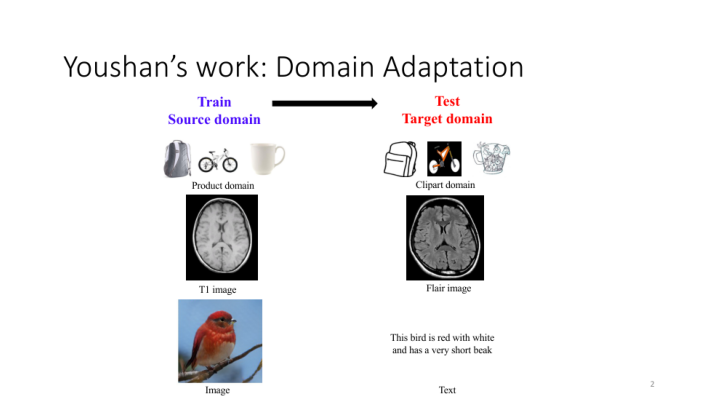

Question:

 What type of image is shown below the product domain?

True Answer:

 Below the product domain, there's a T1 image of the brain.

Predicted Answer:

 T1 image



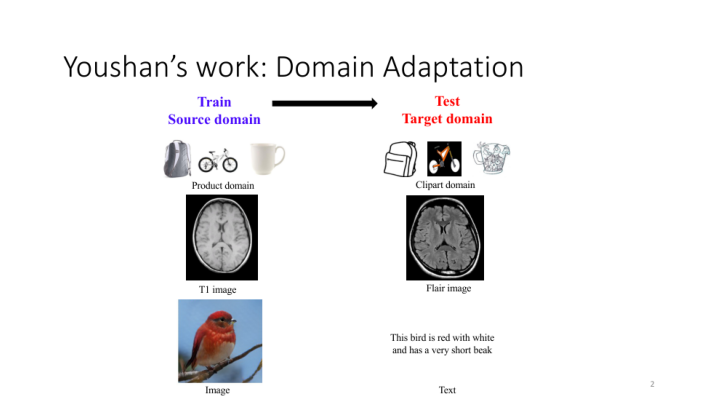

Question:

 Describe the bird image.

True Answer:

 The bird image shows a red bird with white patches and a very short beak.

Predicted Answer:

 red with white



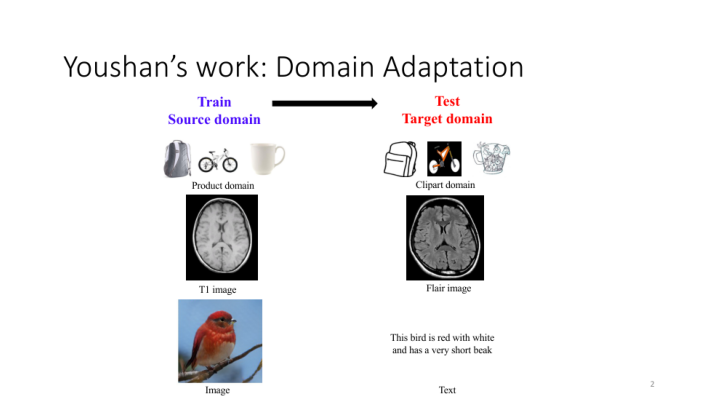

Question:

 Is the bird red?

True Answer:

 Yes, the bird is red with white patches.

Predicted Answer:

 with white



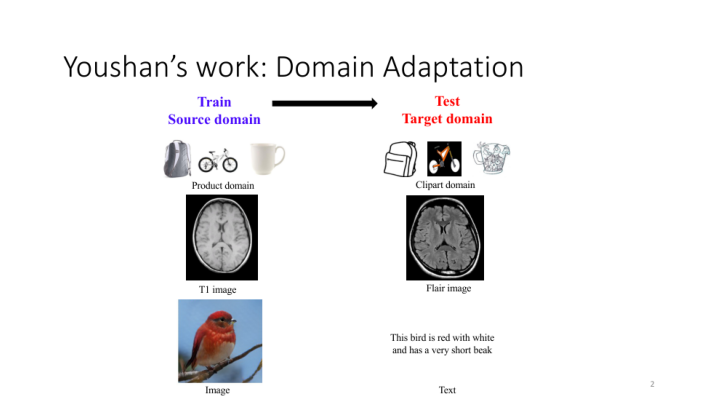

Question:

 What can domain adaptation be used for?

True Answer:

 Domain adaptation can be used to transfer knowledge from a source domain to a different target
domain.

Predicted Answer:

 Domain Adaptation



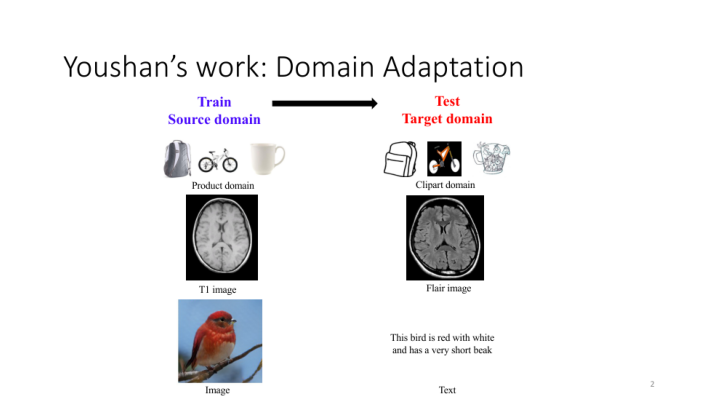

Question:

 How does the source domain differ from the target domain?

True Answer:

 The source domain consists of products and images, while the target domain includes cliparts, flair
images, and text.

Predicted Answer:

 Product domain



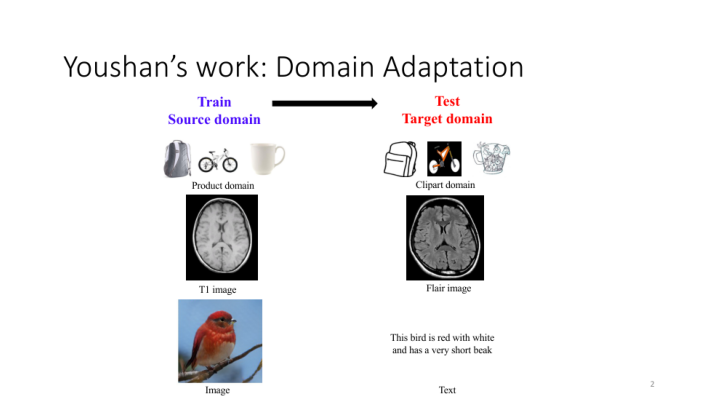

Question:

 Which image represents the clipart domain?

True Answer:

 The clipart domain is represented by images of a backpack, a bike, and a coffee cup.

Predicted Answer:

 Flair image



In [34]:
torch.cuda.empty_cache()

# Sample 5 random rows from the train_df
samples = train_df[10:30]

for _, row in samples.iterrows():
    question = row['question']
    image_path = row['path']
    image = Image.open(image_path).convert("RGB")

    # Process the image and the question using Pix2StructProcessor
    inputs = processor(images=image, text=question, return_tensors="pt").to(device, torch.bfloat16)

    # Generate an answer with the model
    model.eval()  # Set the model to evaluation mode
    with torch.no_grad():
        generated_ids = model.generate(**inputs)
    generated_text = processor.decode(generated_ids[0], skip_special_tokens=True)
    
    # Visualize the data
    plt.figure(figsize=(9, 9))
    raw_image = Image.open(image_path)
    plt.imshow(raw_image)
    plt.axis('off')
    plt.show()

    print(f"Question:\n\n {question}")
    print(f"\nTrue Answer:\n\n {textwrap.fill(row['answer'], width=100)}")
    print(f"\nPredicted Answer:\n\n {textwrap.fill(generated_text, width=100)}\n")
    print("="*50)

torch.cuda.empty_cache()

### Demo on Validation Samples (before training)

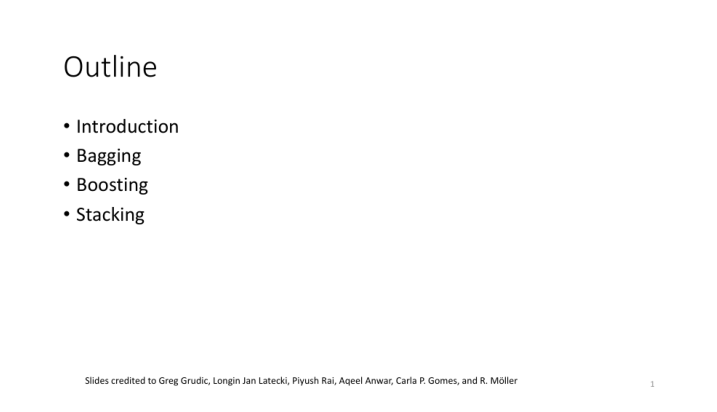

Question:

 Can you explain this slide?

True Answer:

 So here is an outline, first I give you guys a brief introduction of what is and ensemble methods
here, and then we'll talk about the 3 popular ensemble methods bagging and boosting, and stacking.

Predicted Answer:

 Outline



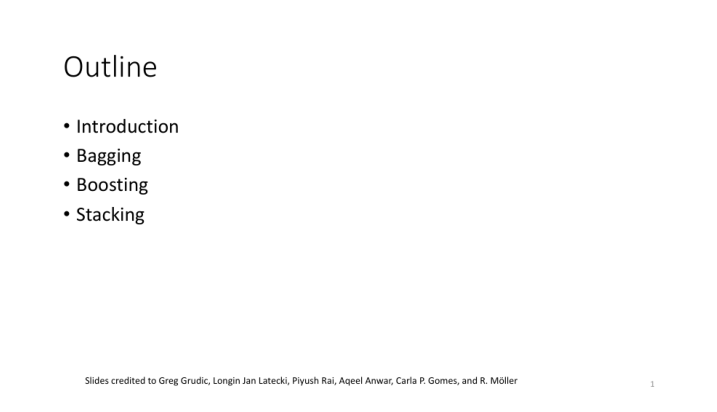

Question:

 What is the main purpose of the slide?

True Answer:

 The slide provides an outline of the main topics to be discussed.

Predicted Answer:

 Outline



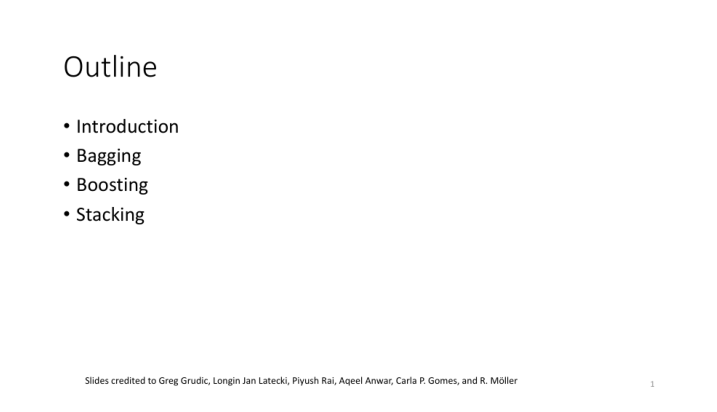

Question:

 How many main topics are mentioned in the outline?

True Answer:

 There are four main topics mentioned.

Predicted Answer:

 1



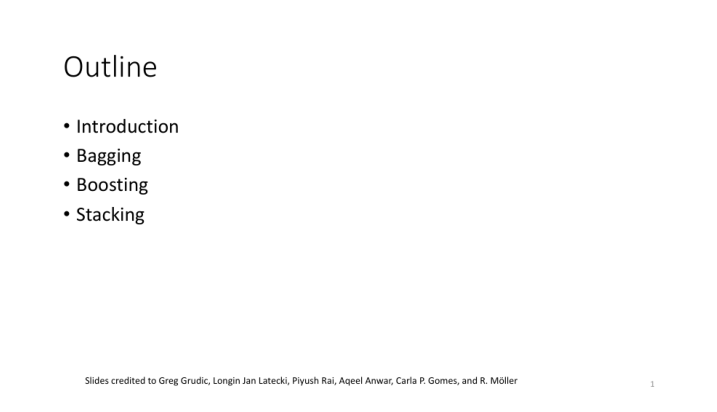

Question:

 Which ensemble learning method combines multiple models' predictions?

True Answer:

 Stacking combines multiple models' predictions.

Predicted Answer:

 Ensemble learning method



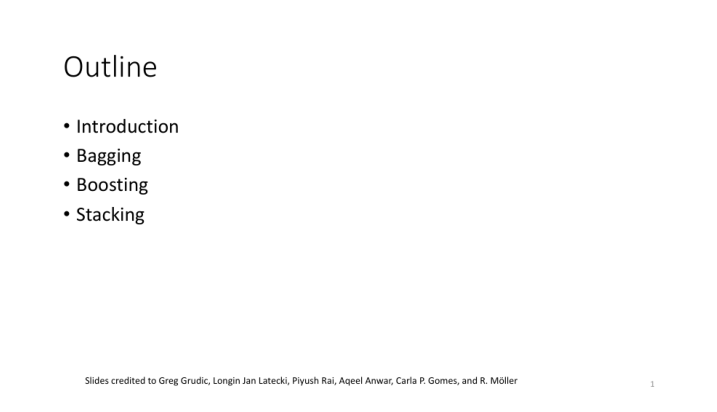

Question:

 What potential subtopics could be covered under 'Bagging'?

True Answer:

 Subtopics could include bootstrap aggregating, random subsampling, and decision trees.

Predicted Answer:

 Boosting



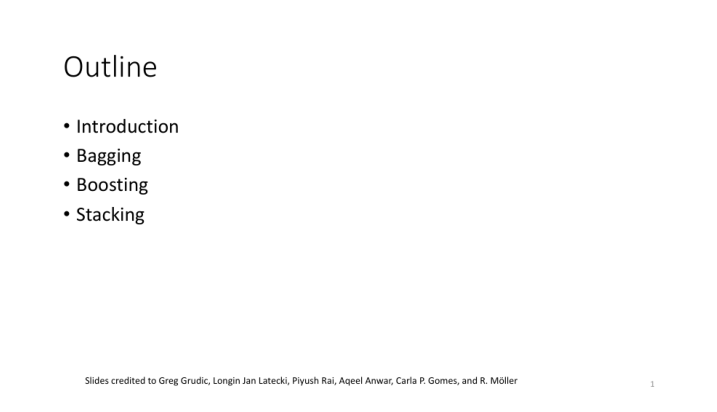

Question:

 Is 'Boosting' a method of improving model accuracy?

True Answer:

 Yes, 'Boosting' is a method to improve model accuracy by weighting misclassified instances.

Predicted Answer:

 Boosting



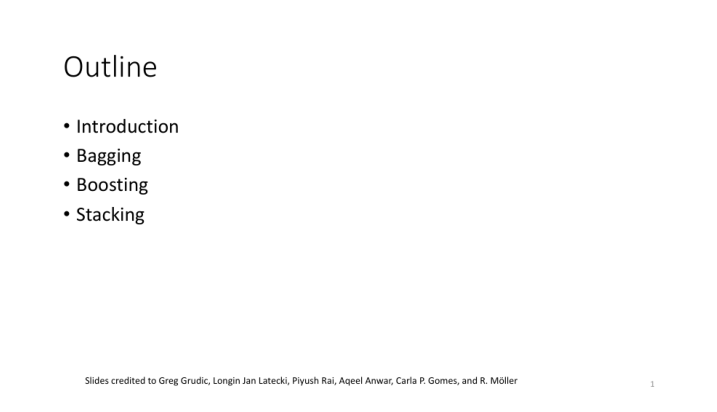

Question:

 Which ensemble method focuses on re-sampling?

True Answer:

 Bagging, or Bootstrap Aggregating, focuses on re-sampling.

Predicted Answer:

 Ensemble Method



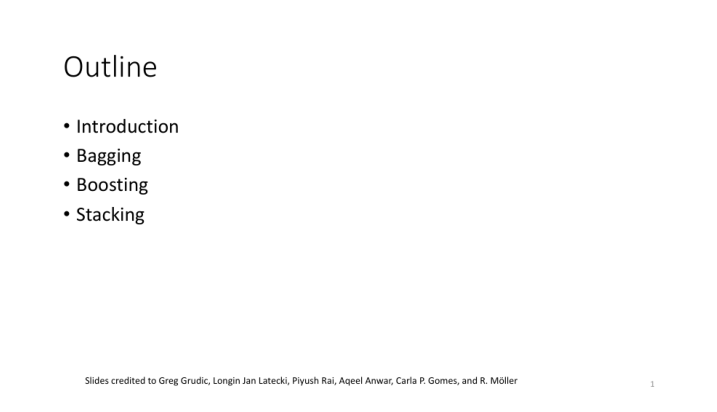

Question:

 Are all methods mentioned techniques for ensemble learning?

True Answer:

 Yes, all mentioned methods are techniques for ensemble learning.

Predicted Answer:

 Outline



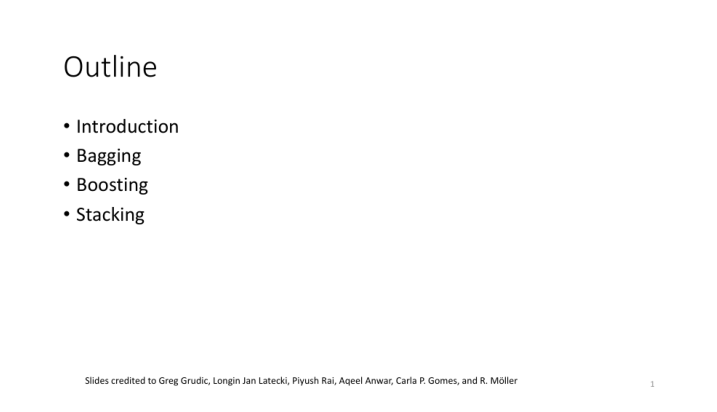

Question:

 What could the 'Introduction' part cover?

True Answer:

 The 'Introduction' could cover the basics of ensemble learning, its importance, and applications.

Predicted Answer:

 Bagging



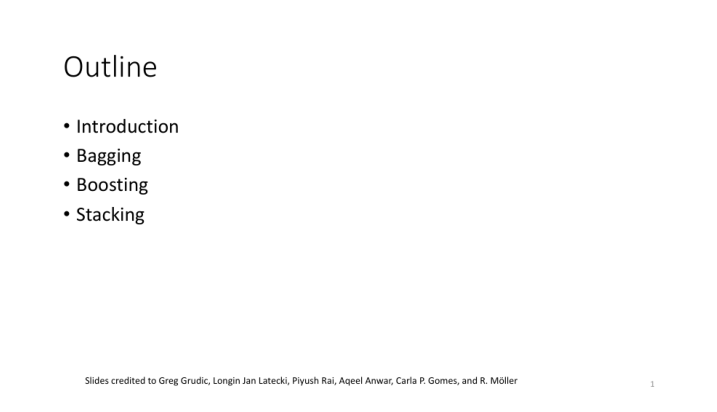

Question:

 Are the authors of the slide credited?

True Answer:

 Yes, the authors Greg Grudic, Longin Jan Latecki, Piyush Rai, Aqeel Anwar, Carla P. Gomes, and R.
Möller are credited.

Predicted Answer:

 Greg Grudic, Longin Jan Latecki, Piyush Rai, Aqeel An



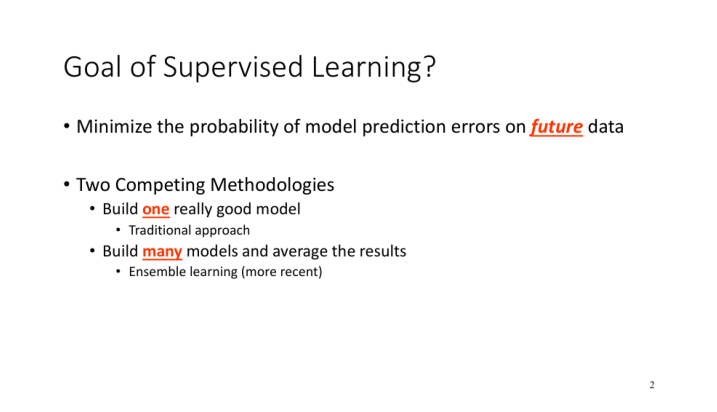

Question:

 Can you explain this slide?

True Answer:

 The slide explains the goal of supervised learning: to reduce prediction errors on future data. It
contrasts two methods: building a single strong model and using ensemble learning.

Predicted Answer:

 Goal of Supervised Learning?



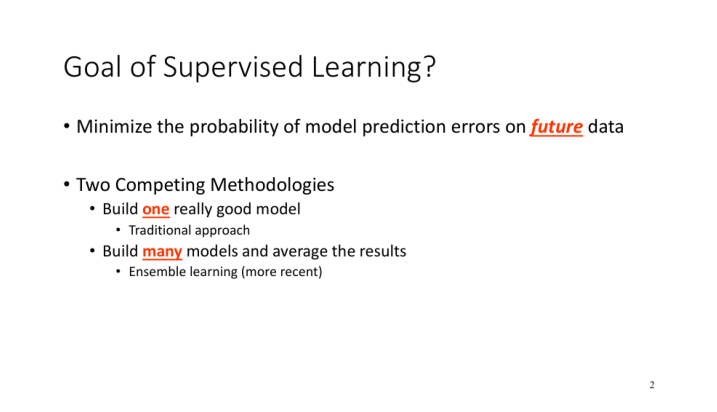

Question:

 What's the primary objective of supervised learning?

True Answer:

 The primary objective of supervised learning is to minimize the probability of model prediction
errors on future data.

Predicted Answer:

 Ensemble learning (more recent)



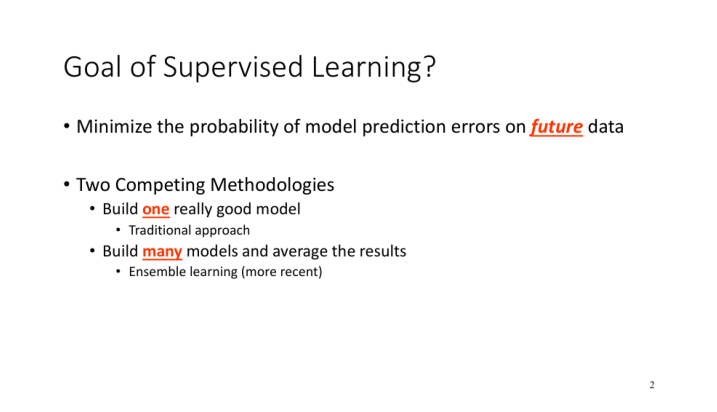

Question:

 Which approach is more recent, traditional or ensemble learning?

True Answer:

 Ensemble learning is the more recent approach.

Predicted Answer:

 Ensemble learning



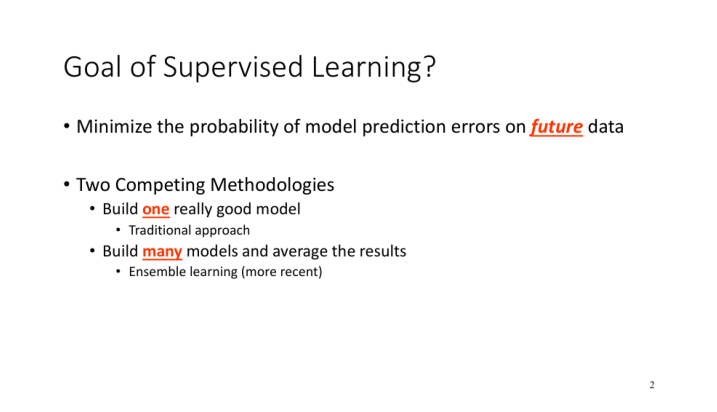

Question:

 How does ensemble learning work?

True Answer:

 Ensemble learning works by building multiple models and averaging their results.

Predicted Answer:

 more recent



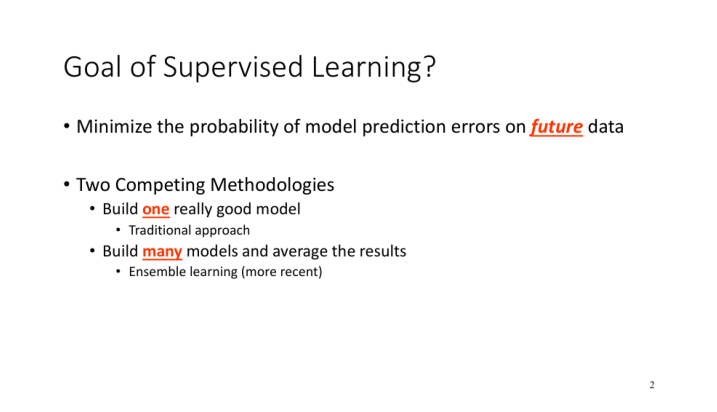

Question:

 What is the key difference between the two methodologies?

True Answer:

 The key difference is one focuses on a single strong model, while the other uses multiple models and
averages their outputs.

Predicted Answer:

 one really good model



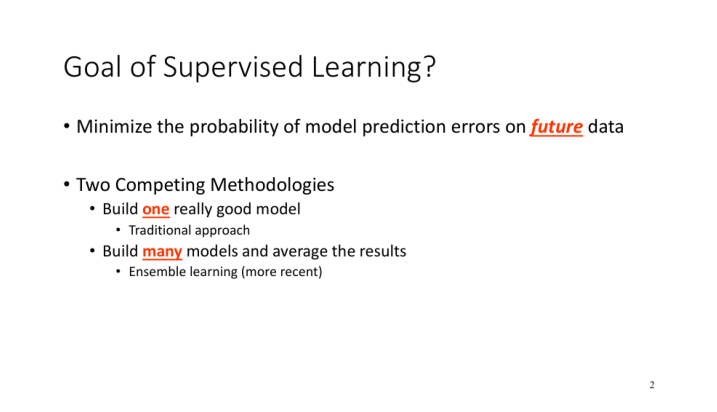

Question:

 Why might someone choose the traditional approach?

True Answer:

 Someone might choose the traditional approach for simplicity, computational efficiency, or if they
believe one model can capture the data's nuances.

Predicted Answer:

 Build one really good model



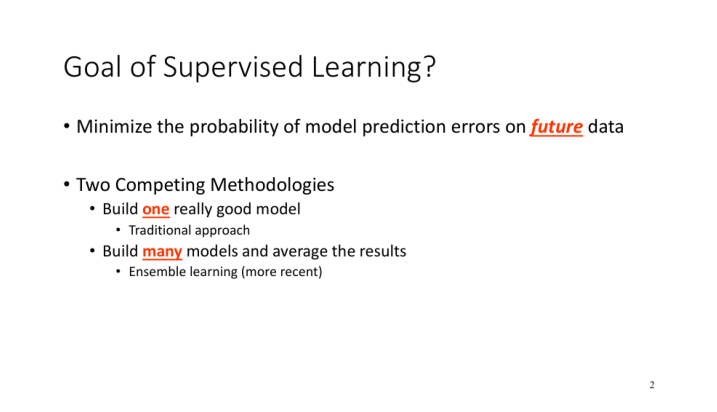

Question:

 What does ensemble learning aim to achieve?

True Answer:

 Ensemble learning aims to achieve better prediction accuracy by leveraging the strengths of multiple
models.

Predicted Answer:

 more recent



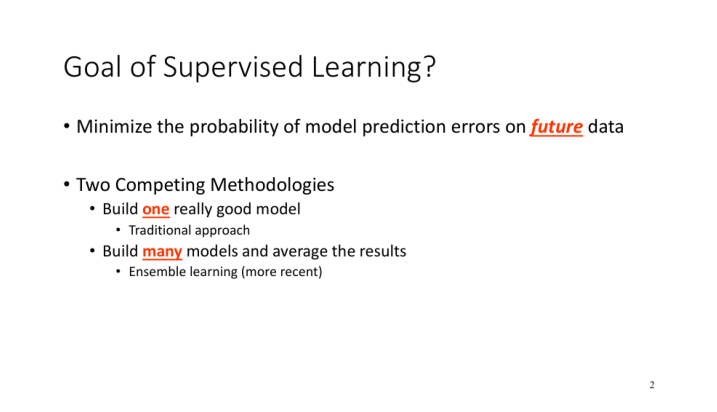

Question:

 Are prediction errors related to past or future data?

True Answer:

 Prediction errors are related to future data.

Predicted Answer:

 model prediction errors



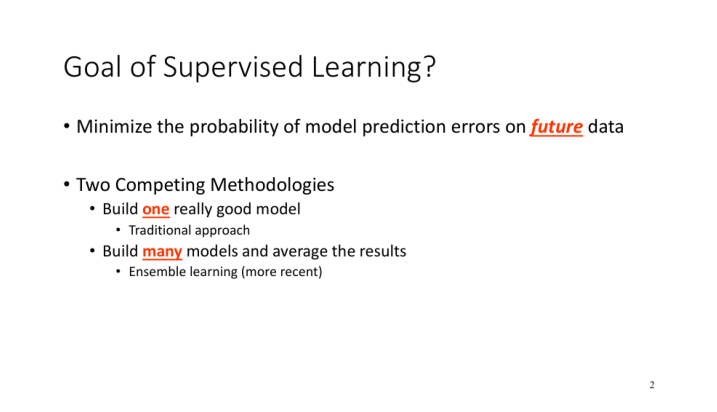

Question:

 Can ensemble learning offer more robust predictions?

True Answer:

 Yes, ensemble learning can offer more robust predictions by leveraging diverse models.

Predicted Answer:

 (more recent)



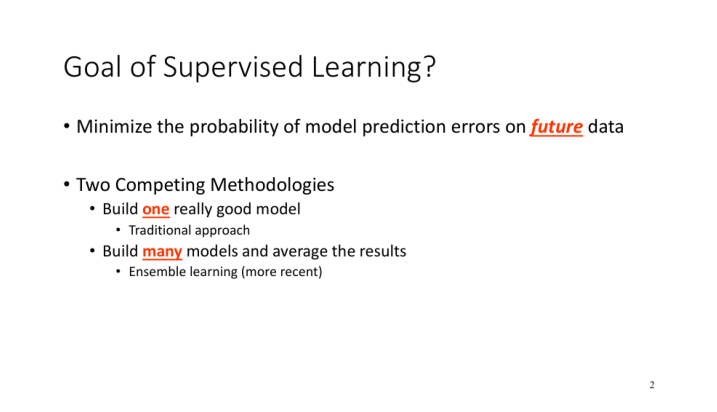

Question:

 Why might ensemble learning be preferred?

True Answer:

 Ensemble learning might be preferred for its ability to harness multiple models, potentially leading
to improved accuracy and reduced overfitting.

Predicted Answer:

 more recent



In [35]:
torch.cuda.empty_cache()

# Sample 5 random rows from the train_df
samples = val_df[10:30]

for _, row in samples.iterrows():
    question = row['question']
    image_path = row['path']
    image = Image.open(image_path).convert("RGB")

    # Process the image and the question using Pix2StructProcessor
    inputs = processor(images=image, text=question, return_tensors="pt").to(device, torch.bfloat16)

    # Generate an answer with the model
    model.eval()  # Set the model to evaluation mode
    with torch.no_grad():
        generated_ids = model.generate(**inputs)
    generated_text = processor.decode(generated_ids[0], skip_special_tokens=True)
    
    # Visualize the data
    plt.figure(figsize=(9, 9))
    raw_image = Image.open(image_path)
    plt.imshow(raw_image)
    plt.axis('off')
    plt.show()

    print(f"Question:\n\n {question}")
    print(f"\nTrue Answer:\n\n {textwrap.fill(row['answer'], width=100)}")
    print(f"\nPredicted Answer:\n\n {textwrap.fill(generated_text, width=100)}\n")
    print("="*50)

torch.cuda.empty_cache()

## Training

#### Auxiliary Functions

In [36]:
def update_plots(loss_values_train, loss_values_val, print_messages):
    clear_output(wait = True)

    # Display print messages
    for message in print_messages:
        print(message)

    fig, ax1 = plt.subplots(1, 1, figsize = (9, 5))

    # Plot loss values
    if len(loss_values_train) == 1:
        ax1.plot(range(1, len(loss_values_train) + 1), loss_values_train, label = "Train Loss", marker='o')
        ax1.plot(range(1, len(loss_values_val) + 1), loss_values_val, label = "Validation Loss", marker='o')
    else:
        ax1.plot(range(1, len(loss_values_train) + 1), loss_values_train, label = "Train Loss")
        ax1.plot(range(1, len(loss_values_val) + 1), loss_values_val, label = "Validation Loss")
    ax1.set_xlabel("Epoch")
    ax1.set_ylabel("Loss")
    ax1.legend()
    ax1.set_title("Loss Values")
    ax1.grid(linestyle = "--", linewidth = 0.75)

    plt.show()

def time_to_seconds(time_string):
    '''
    Input Format can be: '1 day, hh:mm:ss' or 'hh:mm:ss'
    '''
    # Initialize days to 0
    days = 0

    # Check if 'day' or 'days' is in the time_string
    if 'day' in time_string:
        
        # Split the string into the day part and the time part
        day_part, time_part = time_string.split(',', 1)

        # Extract the number of days
        days = int(day_part.split()[0])

        # The rest is the time string
        time_string = time_part.strip()

    # Now split the time string into its components
    time_components = time_string.split(':')
    hours = int(time_components[0])
    minutes = int(time_components[1])
    seconds = int(time_components[2])

    # Calculate total time in seconds including days
    time_in_seconds = days * 86400 + hours * 3600 + minutes * 60 + seconds

    return time_in_seconds

### Hyperparameters

In [37]:
initial_learning_rate = 1e-5
optimizer =optim.AdamW(model.parameters(), lr = initial_learning_rate)

loss_fct = nn.CrossEntropyLoss(ignore_index = pad_token_id)

In [38]:
# # Define a lambda function for the learning rate schedule
lambda_lr = lambda epoch: 0.5 ** epoch  # 0.5 = 1/2, this will reduce the LR by 2 times each epoch

# Create the learning rate scheduler
lr_scheduler = torch.optim.lr_scheduler.LambdaLR(optimizer, lr_lambda=lambda_lr)

In [41]:
# # Try loading the optimizer state
# optimizer_state_path = './Data/Optimizers/optimizer_state_2_1 day, 8_48_49.pth'
# try:
#     optimizer_state = torch.load(optimizer_state_path, map_location=torch.device('cpu'))
#     optimizer.load_state_dict(optimizer_state)
#     print("Optimizer state loaded successfully.")
    
#     # Optionally, inspect the optimizer state
#     # for var_name in optimizer_state:
#     #     print(var_name, "\t", optimizer_state[var_name])
    
#     torch.cuda.empty_cache()
# except Exception as e:
#     print("An error occurred while loading the optimizer state: ", e)

Optimizer state loaded successfully.


In [67]:
# new_learning_rate = 0.001  # Set the new learning rate to the desired value

# # # Update the learning rate
# for param_group in optimizer.param_groups:
#     param_group['lr'] = 0.5 * initial_learning_rate

In [39]:
current_learning_rate = optimizer.param_groups[0]['lr']
print("Current learning rate:", current_learning_rate)

Current learning rate: 1e-05


In [40]:
accumulation_steps = 10  # Number of steps over which to accumulate gradients

In [54]:
num_epochs = 5  # Define the number of epochs

## Training Loop

In [42]:
# from_beginning = True
from_beginning = False

In [55]:
torch.cuda.empty_cache()

if from_beginning == False:
    # Read the DataFrame from the CSV file
    # df = pd.read_csv('./data/training_outcomes/outcomes_Pix2StructForConditionalGeneration_5_3 days, 16_32_13.csv')
    df = outcomes

    # Assign each column of the DataFrame to its respective list variable
    epoch_list = df['Epoch'].tolist()
    history_learning_rate = df['Learning_Rate'].tolist()
    loss_values_train = df['Train_Loss'].tolist()
    loss_values_val = df['Validation_Loss'].tolist()
    # acc_train = df['Train_Accuracy'].tolist()
    # acc_val = df['Validation_Accuracy'].tolist()
    epoch_time = df['Time'].tolist()

    print_messages = ['\n\t ****** Training has begun. ******\n']
    for i in range(0, epoch_list[-1]):
        message = f'Epoch: {epoch_list[i]:03} | Learning Rate : {history_learning_rate[i]:.6E} | Train Loss: {loss_values_train[i]:.8f} | Val Loss: {loss_values_val[i]:.8f} | Time: {epoch_time[i]}'#Train Acc: {acc_train[i]:.6f} | Val Acc: {acc_val[i]:.6f} | Time: {epoch_time[i]}'
        print_messages.append(message)

    starting_epoch = epoch_list[-1] + 1
    print(f"Starting epoch : {starting_epoch}")
    dt = time_to_seconds(epoch_time[-1])

else: 
    epoch_list = []
    loss_values_train = []
    loss_values_val = []
    # acc_train = []
    # acc_val = []
    history_learning_rate = []
    epoch_time = []

    starting_epoch = 1
    print_messages = ['\n\t ****** Training has begun. ******\n']
    print(f"Starting epoch : {starting_epoch}")
    dt = 0

Starting epoch : 5



	 ****** Training has begun. ******

Epoch: 001 | Learning Rate : 1.000000E-05 | Train Loss: 0.26402857 | Val Loss: 2.25598825 | Time: 17:46:00
Epoch: 002 | Learning Rate : 1.000000E-05 | Train Loss: 0.23737283 | Val Loss: 2.17365407 | Time: 1 day, 8:48:49
Epoch: 003 | Learning Rate : 1.000000E-05 | Train Loss: 0.22733843 | Val Loss: 2.11113414 | Time: 2 days, 3:10:28
Epoch: 004 | Learning Rate : 1.000000E-05 | Train Loss: 0.21957924 | Val Loss: 2.07537767 | Time: 3 days, 0:18:50
Epoch: 005 | Learning Rate : 1.000000E-05 | Train Loss: 0.21418089 | Val Loss: 2.05782678 | Time: 3 days, 16:32:13


	 ****** Training has finished. ******

	Training time: 3 days, 16:32:13 [hh:mm:ss]


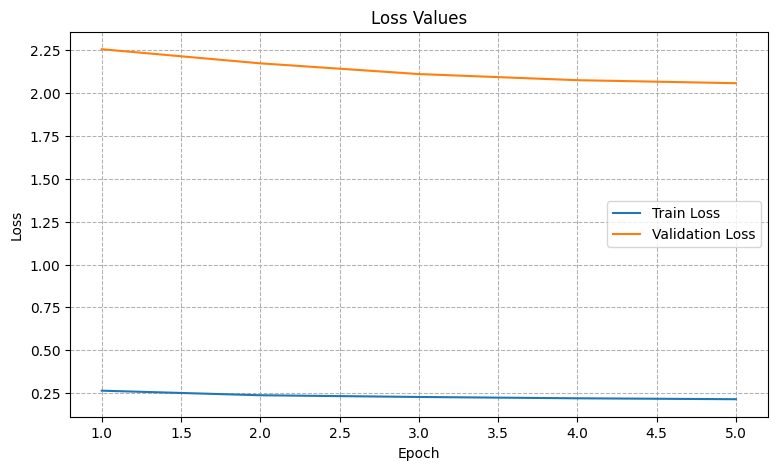

In [57]:
start = timer()

update_plots(loss_values_train, loss_values_val, print_messages)

for epoch in range(starting_epoch, num_epochs + 1):
    epoch_list.append(epoch)
    history_learning_rate.append(optimizer.param_groups[0]['lr'])

    # ===========================  Training ===========================
    model.train()
    total_loss = 0

    optimizer.zero_grad()  # Initialize gradients to zero

    train_progress_bar = tqdm(train_dataloader, desc = f"Training Epoch {epoch}", leave=False)
    for step, batch in enumerate(train_progress_bar):

        # Unpack the batch data and move to the device
        flattened_patches = batch["flattened_patches"].to(device)
        attention_mask = batch["attention_mask"].to(device)
        labels = batch["labels"].to(device)

        # Forward pass
        outputs = model(
            flattened_patches=flattened_patches,
            attention_mask=attention_mask,
            labels=labels
        )
        logits = outputs.logits

        # Compute the loss
        loss = loss_fct(logits.view(-1, logits.shape[-1]), labels.view(-1))
        loss = loss / accumulation_steps  # Scale loss to account for accumulation

        # Backward pass
        loss.backward()

        if (step + 1) % accumulation_steps == 0:
            optimizer.step()  # Update parameters every `accumulation_steps` steps
            optimizer.zero_grad()  # Reset gradients after update

        total_loss += loss.item() * accumulation_steps  # Scale back the loss

        # train_progress_bar.set_postfix({'epoch': epoch, 'loss': loss.item()})
        train_progress_bar.set_postfix(lr = history_learning_rate[-1], loss = loss.item())

    # train_progress_bar.close()

    # Calculate average loss over the training data
    avg_train_loss = total_loss / len(train_dataloader) / accumulation_steps
    loss_values_train.append(avg_train_loss)


    # =========================== Validation ===========================
    model.eval()  # Set model to evaluation mode
    total_val_loss = 0
    
    with torch.no_grad():  # Disable gradient calculation
        
        val_progress_bar =tqdm(val_dataloader, desc = f"Validation Epoch {epoch}", leave = False)
        for batch in val_progress_bar:
            # Unpack the batch data and move to the device
            flattened_patches = batch["flattened_patches"].to(device)
            attention_mask = batch["attention_mask"].to(device)
            labels = batch["labels"].to(device)

            # Forward pass
            outputs = model(
                flattened_patches=flattened_patches,
                attention_mask=attention_mask,
                labels=labels
            )
            logits = outputs.logits

            # Compute the loss
            loss = loss_fct(logits.view(-1, logits.shape[-1]), labels.view(-1))
            total_val_loss += loss.item()

            # Update progress bar description with validation loss and accuracy
            val_progress_bar.set_postfix(val_loss = loss.item())

    # Calculate average validation loss
    avg_val_loss = total_val_loss / len(val_dataloader)
    loss_values_val.append(avg_val_loss)

    # Update learning rate
    # lr_scheduler.step()


    # =========================== Print and plot info ===========================

    # Print training statistics
    epoch_time.append(timedelta(seconds = int(timer() - start) + dt).__str__().zfill(8))
    message = f"Epoch: {epoch:03} | Learning Rate : {history_learning_rate[-1]:.6E} | Train Loss: {loss_values_train[-1]:.8f} | Val Loss: {loss_values_val[-1]:.8f} | Time: {epoch_time[-1]}"#| Train Acc: {acc_train[-1]:.6f} | Val Acc: {acc_val[-1]:.6f} | Time: {epoch_time[-1]}"
    print_messages.append(message)

    # Update the plots
    update_plots(loss_values_train, loss_values_val, print_messages)# acc_train, acc_val, print_messages)

# Wrap up the training process
end = timer()
message = '\n\n\t ****** Training has finished. ******\n'

print_messages.append(message)

print(message)

message = f'\tTraining time: {timedelta(seconds = int(end - start) + dt)} [hh:mm:ss]'
print_messages.append(message)
print(message)

# Update the plots
update_plots(loss_values_train, loss_values_val, print_messages)# acc_train, acc_val, print_messages)
    
# Release GPU memory
torch.cuda.empty_cache()

#### Saving the Model, Optimizer State, and Training Process Data

In [58]:
# print_messages[-2:]

In [59]:
# Saving the Model Weights
torch.save(model.state_dict(), f'./data/models/model_weights_{model.__class__.__name__}__{epoch_list[-1]}_{epoch_time[-1].replace(":", "_")}.pth')

In [60]:
# Save the optimizer state
torch.save(optimizer.state_dict(), f'./data/Optimizers/optimizer_state_{epoch_list[-1]}_{epoch_time[-1].replace(":", "_")}.pth')

In [ ]:
# # Save the scheduler state
# torch.save(scheduler.state_dict(),  f'./data/Schedulers/scheduler_state_{epoch_list[-1]}_{epoch_time[-1].replace(":", "_")}.pth')

In [61]:
# Creating the DataFrame
outcomes = pd.DataFrame(
    {   'Epoch': epoch_list,
        'Learning_Rate': history_learning_rate,
        'Train_Loss': loss_values_train,
        'Validation_Loss': loss_values_val,
        # 'Train_Accuracy': acc_train,
        # 'Validation_Accuracy': acc_val,
        'Time': epoch_time,
    })

# saving the DataFrame as a CSV file
if epoch_list: # Check if epoch_list is not empty
    outcomes.to_csv(f'./data/training_outcomes/outcomes_{model.__class__.__name__}_{epoch_list[-1]}_{epoch_time[-1].replace(":", "_")}.csv', index = False)
else:
    print("epoch_list is empty, so the DataFrame cannot be saved with the specified filename format.")

### Demo on Trainig Samples (after training)

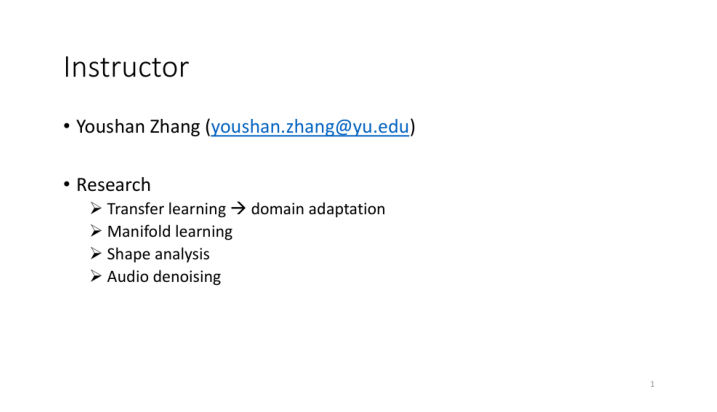

Question:

 Can you explain this slide?

True Answer:

 This slide provides information about the instructor, Youshan Zhang, including his email and main
research areas like transfer learning, manifold learning, and audio denoising.

Predicted Answer:

 The slide explains the research on the transfer learning and domain adaptation of audio denoising.
It



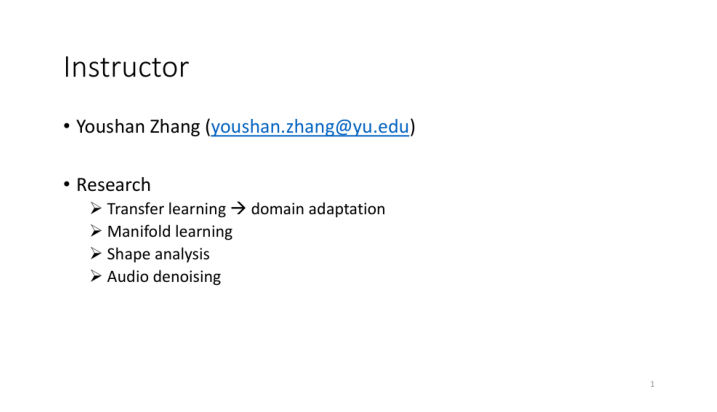

Question:

 Who is the instructor mentioned in the slide?

True Answer:

 The instructor mentioned in the slide is Youshan Zhang.

Predicted Answer:

 The instructor mentioned is Youshan Zhang.



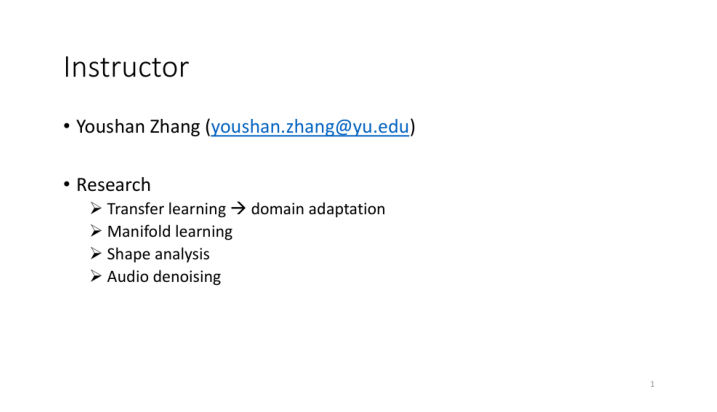

Question:

 What is the email of the instructor?

True Answer:

 The instructor's email is youshan.zhang@yu.edu.

Predicted Answer:

 The email is the email of the instructor.



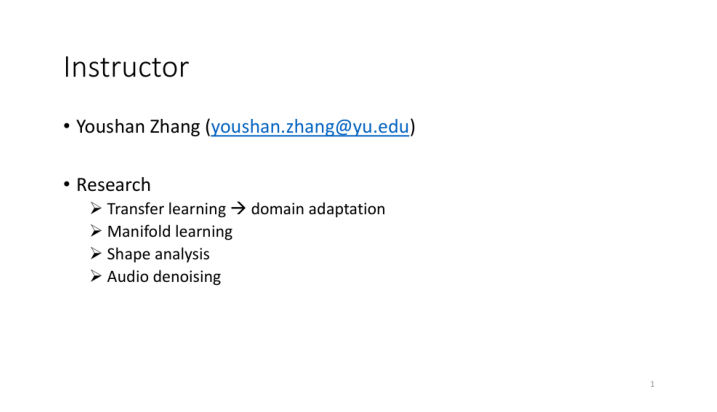

Question:

 Does Youshan Zhang specialize in audio denoising?

True Answer:

 Yes, audio denoising is one of Youshan Zhang's research areas.

Predicted Answer:

 Yes, Youshan Zhang specializes in audio denoising.



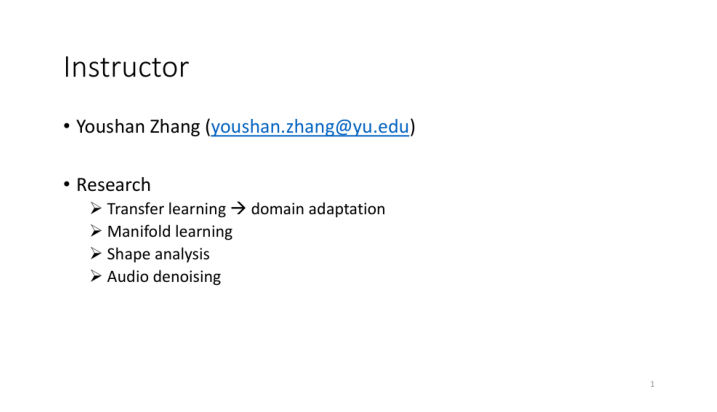

Question:

 What is transfer learning in relation to?

True Answer:

 Transfer learning is related to domain adaptation, as mentioned in the slide.

Predicted Answer:

 Transfer learning is related to domain adaptation, manifold learning, and shape analysis.



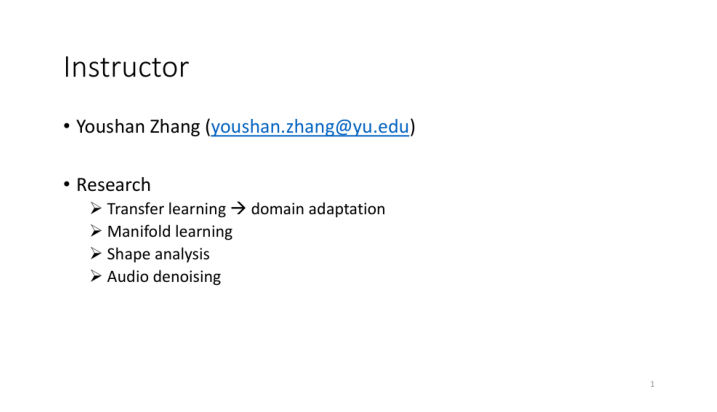

Question:

 List some research areas of the instructor.

True Answer:

 Some research areas are transfer learning, manifold learning, shape analysis, and audio denoising.

Predicted Answer:

 Research areas include Transfer learning, Domain adaptation, Manifold learning, Shape analysis,
Audio deno



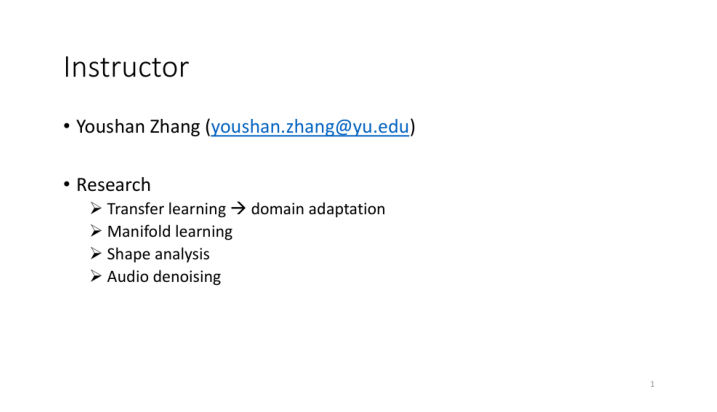

Question:

 Is manifold learning one of the research areas?

True Answer:

 Yes, manifold learning is one of the research areas.

Predicted Answer:

 Yes, manifold learning is one of the research areas.



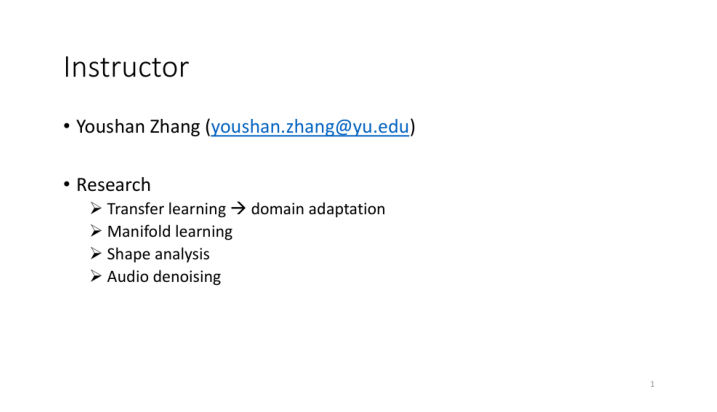

Question:

 Brainstorm applications of audio denoising.

True Answer:

 Applications can include voice assistants, hearing aids, audio recording, and telecommunication.

Predicted Answer:

 Audio denoising is used to enhance the audio quality, enhance the audio quality, and enhance



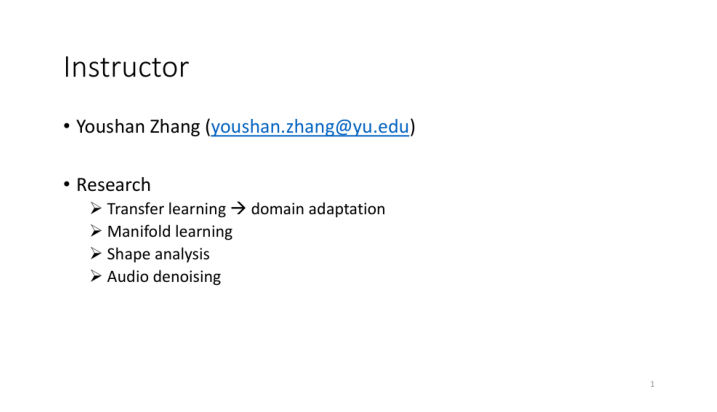

Question:

 What can transfer learning be used for?

True Answer:

 Transfer learning can be used for domain adaptation, enabling a model trained on one domain to work
on another.

Predicted Answer:

 Transfer learning can be used for domain adaptation, manifold learning, shape analysis, audio
denoising



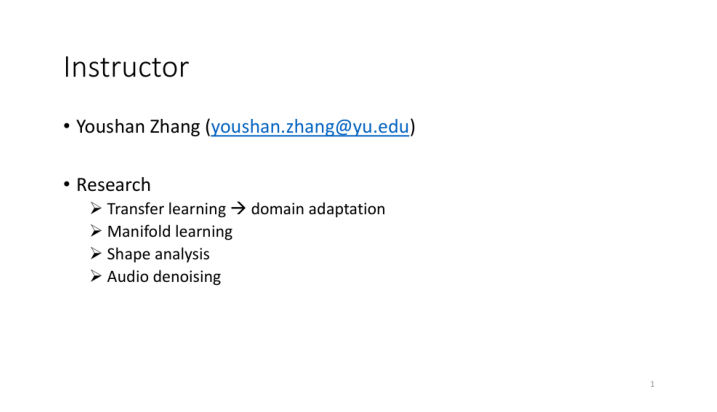

Question:

 What is the page number of this slide?

True Answer:

 The page number of this slide is 2.

Predicted Answer:

 The page number of this slide is 1.



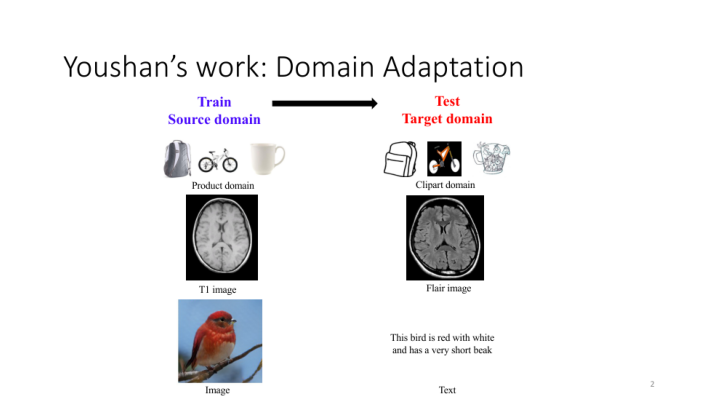

Question:

 Can you explain this slide?

True Answer:

 The slide illustrates Youshan's work on domain adaptation, showing the transition from source
domains like products to target domains like cliparts.

Predicted Answer:

 The slide explains how domain adaptation is a key component of domain adaptation. It explains how
domain adaptation



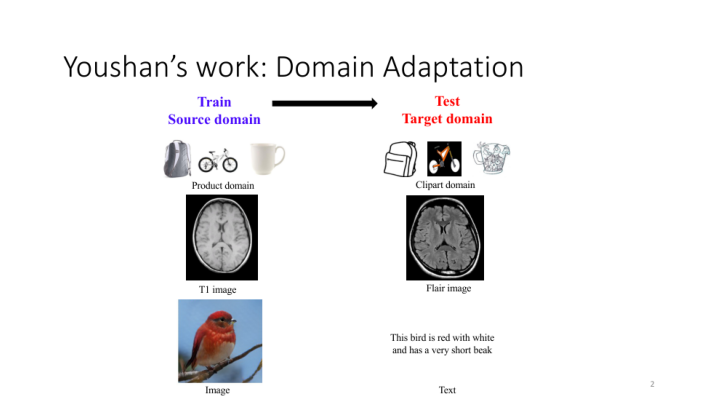

Question:

 What is the main topic of this slide?

True Answer:

 The main topic of the slide is 'Domain Adaptation' showcasing Youshan's work.

Predicted Answer:

 The main topic of this slide is Domain Adaptation.



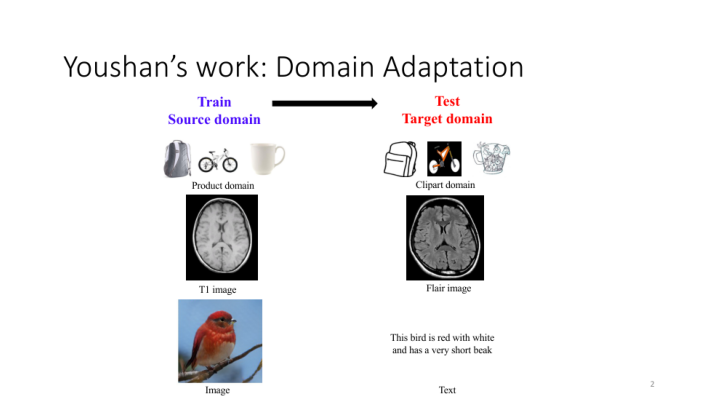

Question:

 Which domains are used for training?

True Answer:

 The source domain used for training includes the product domain and images.

Predicted Answer:

 The source domains are used for training.



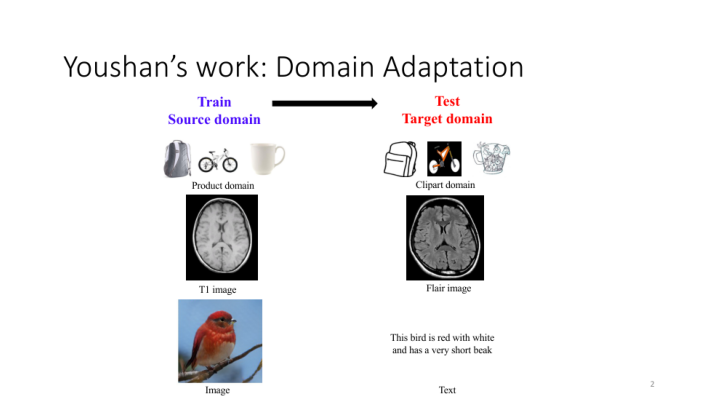

Question:

 Which domains are tested on?

True Answer:

 The target domains tested on include the clipart domain, flair images, and text.

Predicted Answer:

 The domains are tested on.



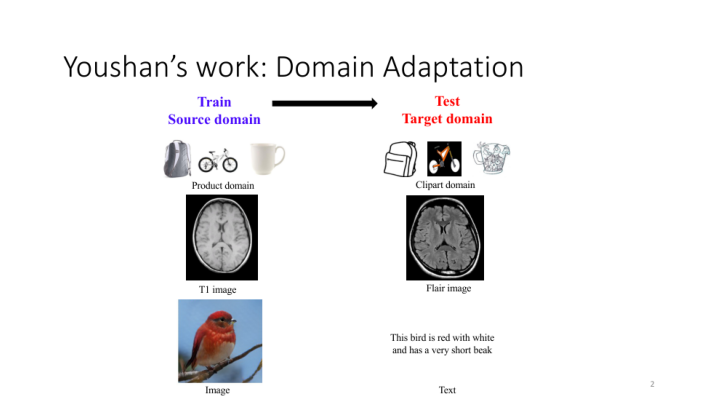

Question:

 What type of image is shown below the product domain?

True Answer:

 Below the product domain, there's a T1 image of the brain.

Predicted Answer:

 Image shows the T1 image.



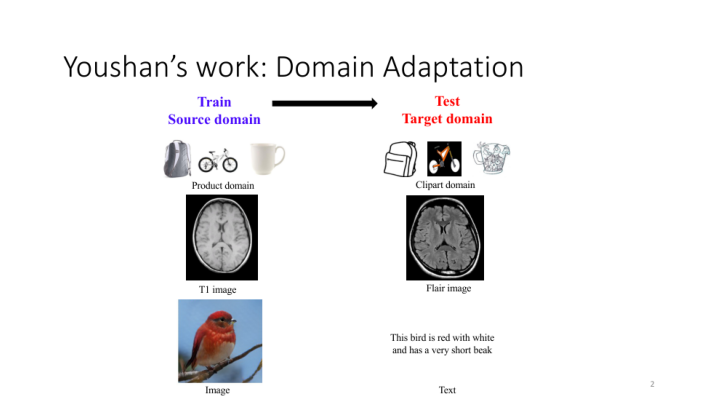

Question:

 Describe the bird image.

True Answer:

 The bird image shows a red bird with white patches and a very short beak.

Predicted Answer:

 The bird image is red with white and has a very short beak.



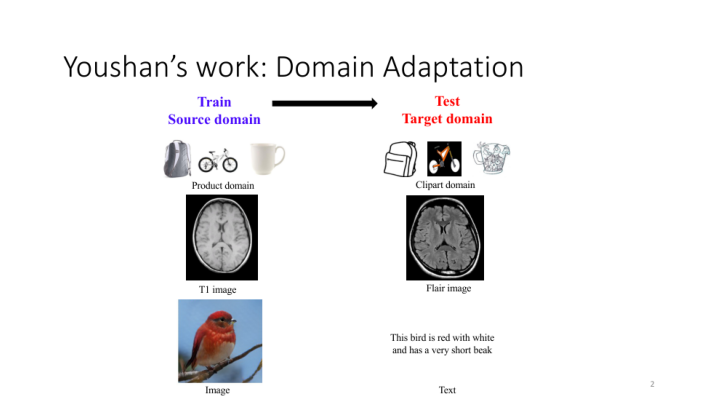

Question:

 Is the bird red?

True Answer:

 Yes, the bird is red with white patches.

Predicted Answer:

 Yes, the bird is red with white.



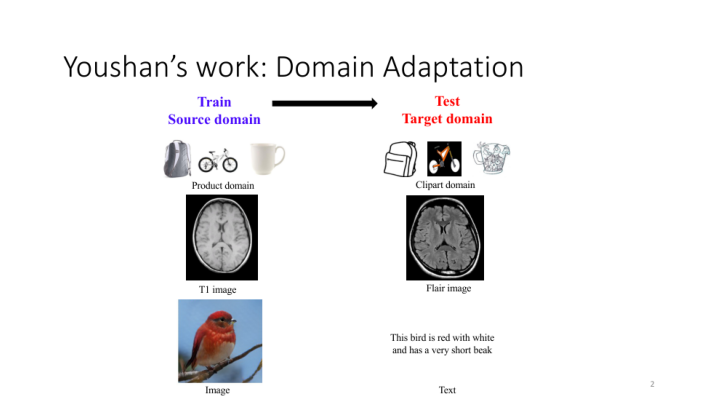

Question:

 What can domain adaptation be used for?

True Answer:

 Domain adaptation can be used to transfer knowledge from a source domain to a different target
domain.

Predicted Answer:

 Domain adaptation can be used to create a new domain.



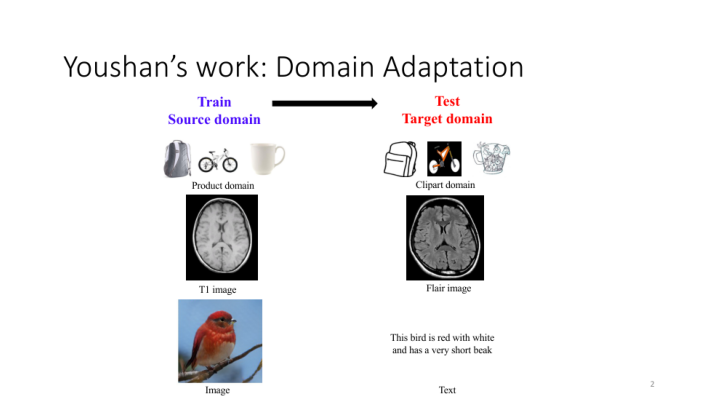

Question:

 How does the source domain differ from the target domain?

True Answer:

 The source domain consists of products and images, while the target domain includes cliparts, flair
images, and text.

Predicted Answer:

 The source domain is different from the target domain.



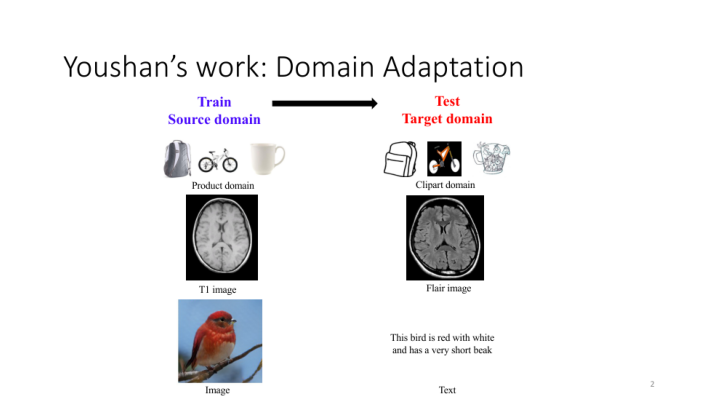

Question:

 Which image represents the clipart domain?

True Answer:

 The clipart domain is represented by images of a backpack, a bike, and a coffee cup.

Predicted Answer:

 The clipart domain represents the product domain.



In [51]:
torch.cuda.empty_cache()

# Sample 5 random rows from the train_df
samples = train_df[10:30]

for _, row in samples.iterrows():
    question = row['question']
    image_path = row['path']
    image = Image.open(image_path).convert("RGB")

    # Process the image and the question using Pix2StructProcessor
    inputs = processor(images=image, text=question, return_tensors="pt").to(device, torch.bfloat16)

    # Generate an answer with the model
    model.eval()  # Set the model to evaluation mode
    with torch.no_grad():
        generated_ids = model.generate(**inputs)
    generated_text = processor.decode(generated_ids[0], skip_special_tokens=True)
    
    # Visualize the data
    plt.figure(figsize=(9, 9))
    raw_image = Image.open(image_path)
    plt.imshow(raw_image)
    plt.axis('off')
    plt.show()

    print(f"Question:\n\n {question}")
    print(f"\nTrue Answer:\n\n {textwrap.fill(row['answer'], width=100)}")
    print(f"\nPredicted Answer:\n\n {textwrap.fill(generated_text, width=100)}\n")
    print("="*50)

torch.cuda.empty_cache()

### Demo on Validation Samples (after training)

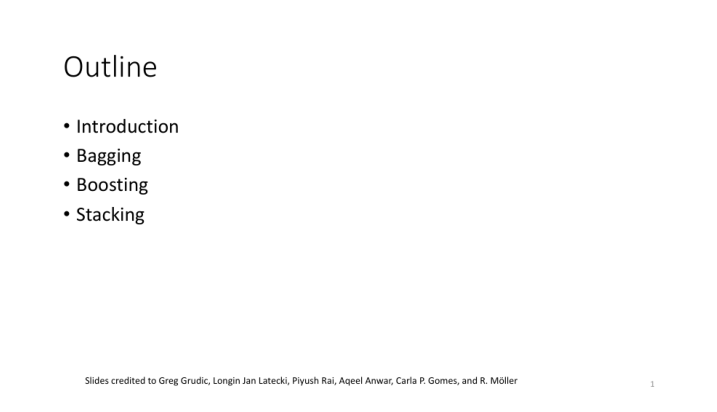

Question:

 Can you explain this slide?

True Answer:

 So here is an outline, first I give you guys a brief introduction of what is and ensemble methods
here, and then we'll talk about the 3 popular ensemble methods bagging and boosting, and stacking.

Predicted Answer:

 The slide explains the outline of the introduction, the bagging, and boosting.



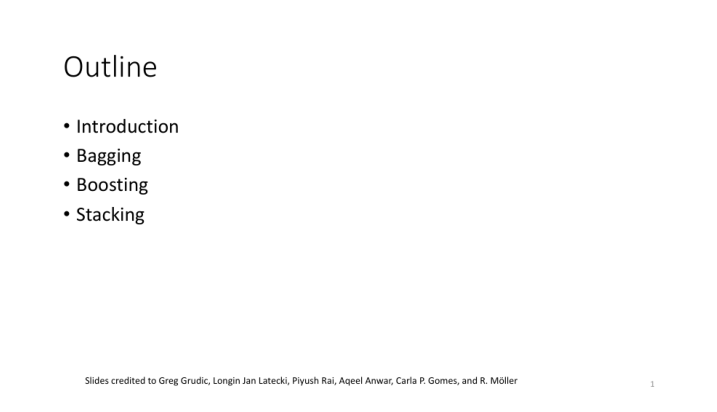

Question:

 What is the main purpose of the slide?

True Answer:

 The slide provides an outline of the main topics to be discussed.

Predicted Answer:

 The main purpose of the slide is to demonstrate the use of outline in the production of a product



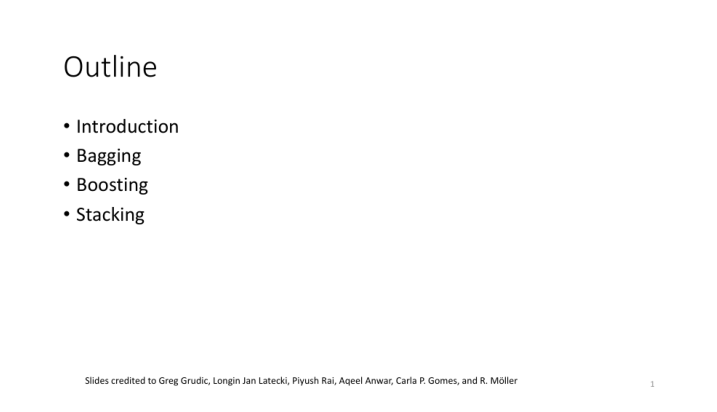

Question:

 How many main topics are mentioned in the outline?

True Answer:

 There are four main topics mentioned.

Predicted Answer:

 The main topics are introduction, bagging, boosting, stacking, and introduction.



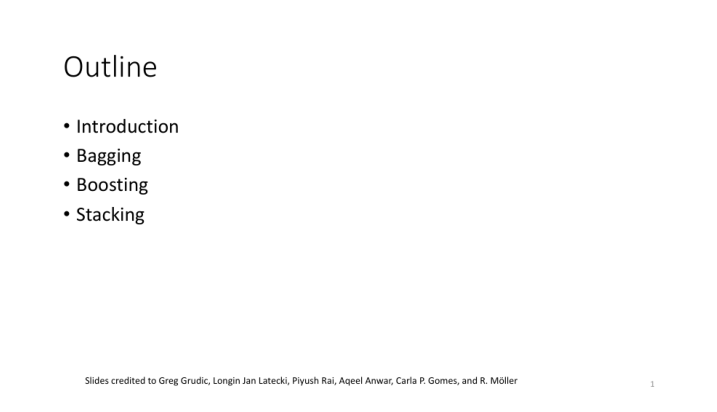

Question:

 Which ensemble learning method combines multiple models' predictions?

True Answer:

 Stacking combines multiple models' predictions.

Predicted Answer:

 Ensemble learning method combines multiple models' predictions.



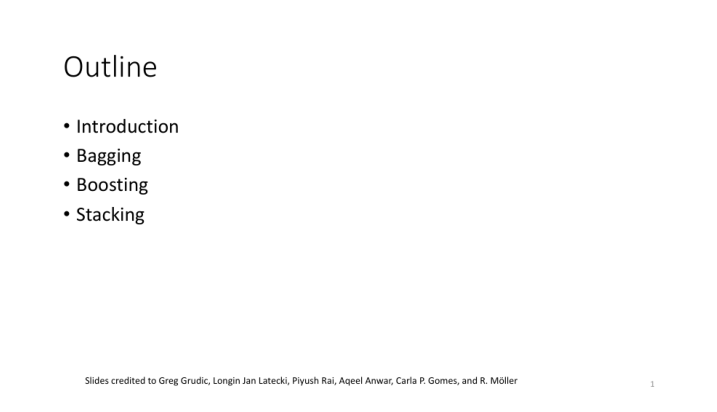

Question:

 What potential subtopics could be covered under 'Bagging'?

True Answer:

 Subtopics could include bootstrap aggregating, random subsampling, and decision trees.

Predicted Answer:

 The potential subtopics could be 'Bagging', 'Booting',



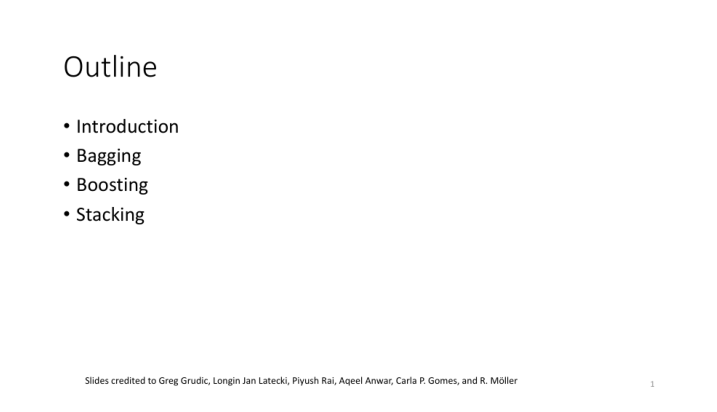

Question:

 Is 'Boosting' a method of improving model accuracy?

True Answer:

 Yes, 'Boosting' is a method to improve model accuracy by weighting misclassified instances.

Predicted Answer:

 Yes, 'Boosting' is a method of improving model accuracy.



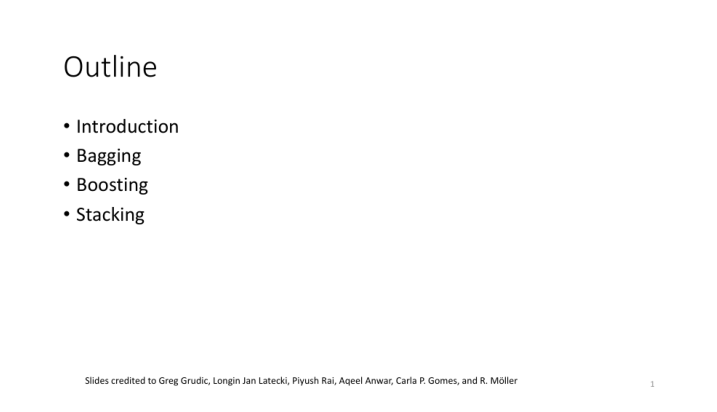

Question:

 Which ensemble method focuses on re-sampling?

True Answer:

 Bagging, or Bootstrap Aggregating, focuses on re-sampling.

Predicted Answer:

 The ensemble method focuses on re-sampling.



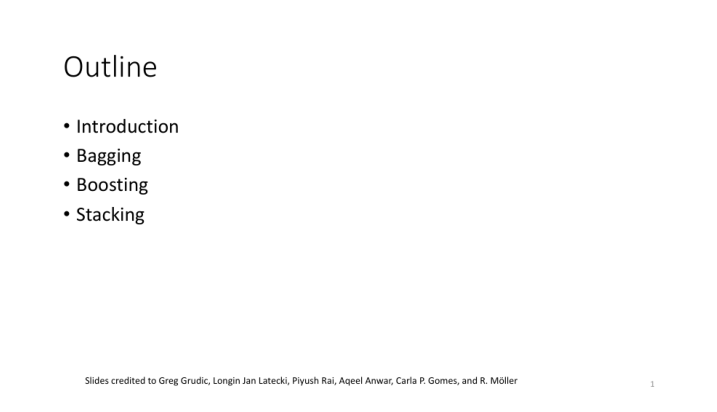

Question:

 Are all methods mentioned techniques for ensemble learning?

True Answer:

 Yes, all mentioned methods are techniques for ensemble learning.

Predicted Answer:

 Yes, all methods mentioned techniques are mentioned in the outline.



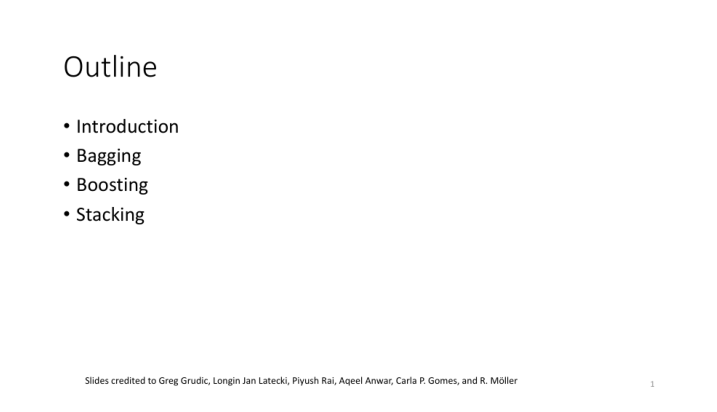

Question:

 What could the 'Introduction' part cover?

True Answer:

 The 'Introduction' could cover the basics of ensemble learning, its importance, and applications.

Predicted Answer:

 The 'Introduction' part covers the basics of the introduction process, including the bagging,



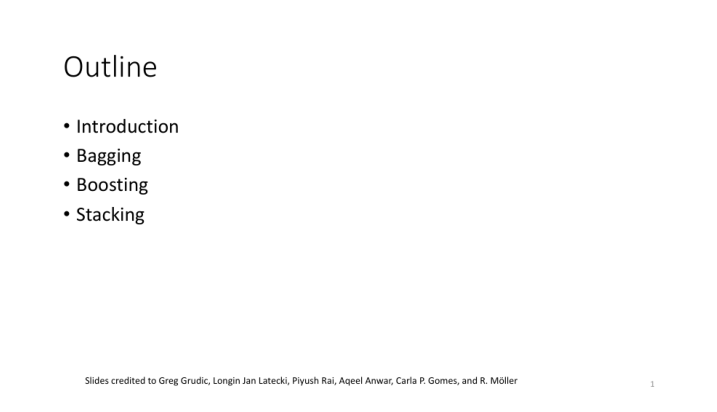

Question:

 Are the authors of the slide credited?

True Answer:

 Yes, the authors Greg Grudic, Longin Jan Latecki, Piyush Rai, Aqeel Anwar, Carla P. Gomes, and R.
Möller are credited.

Predicted Answer:

 Yes, the authors of the slide are Greg Grudic, Longin Jan Latecki, Pi



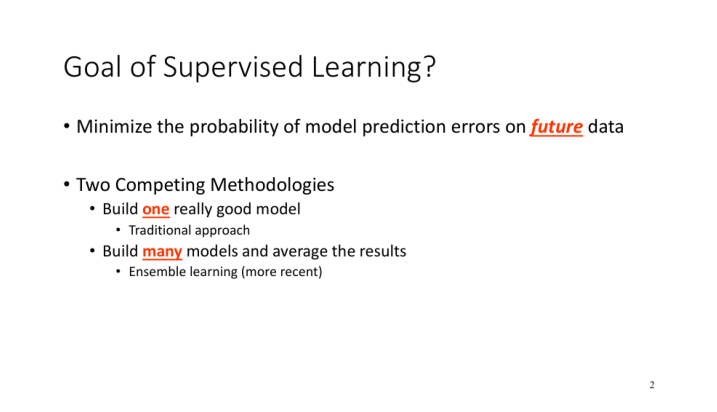

Question:

 Can you explain this slide?

True Answer:

 The slide explains the goal of supervised learning: to reduce prediction errors on future data. It
contrasts two methods: building a single strong model and using ensemble learning.

Predicted Answer:

 The slide describes the goal of supervised learning, highlighting the two competing methodologies.
It also discusses the



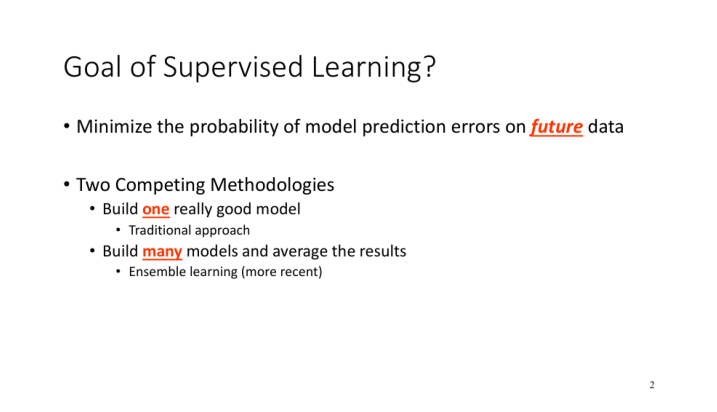

Question:

 What's the primary objective of supervised learning?

True Answer:

 The primary objective of supervised learning is to minimize the probability of model prediction
errors on future data.

Predicted Answer:

 The primary objective of supervised learning is to minimize the probability of model prediction
errors on future data.



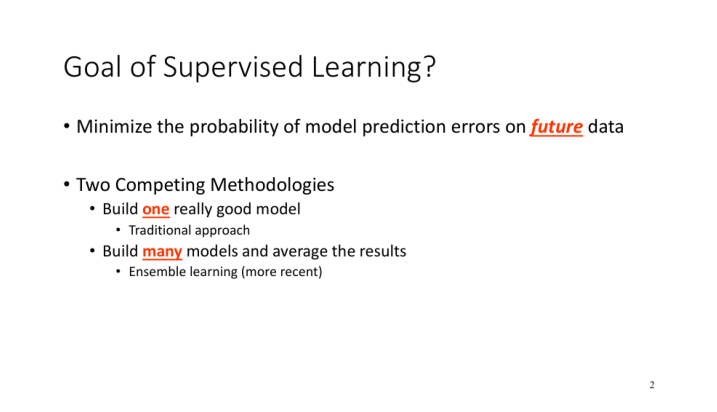

Question:

 Which approach is more recent, traditional or ensemble learning?

True Answer:

 Ensemble learning is the more recent approach.

Predicted Answer:

 More recent, traditional or ensemble learning approaches are more recent.



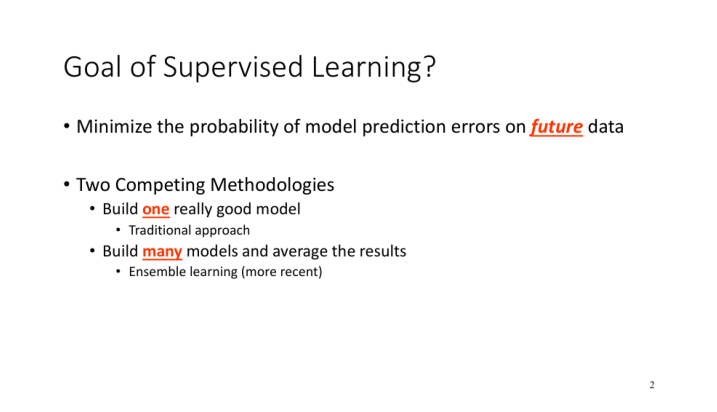

Question:

 How does ensemble learning work?

True Answer:

 Ensemble learning works by building multiple models and averaging their results.

Predicted Answer:

 Ensemble learning works by building models and averaging results.



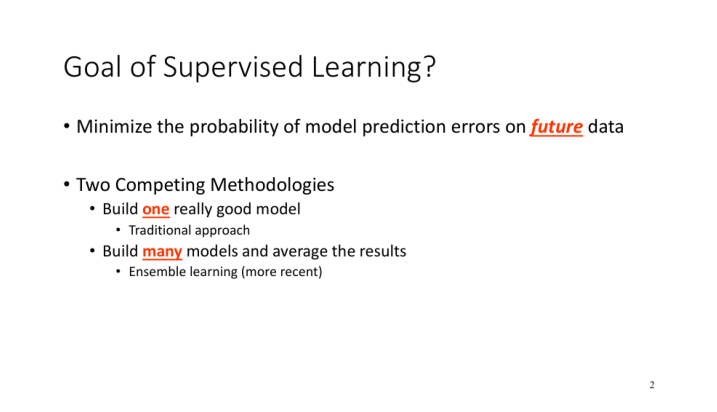

Question:

 What is the key difference between the two methodologies?

True Answer:

 The key difference is one focuses on a single strong model, while the other uses multiple models and
averages their outputs.

Predicted Answer:

 The key difference is the two methodologies are competing methodologies.



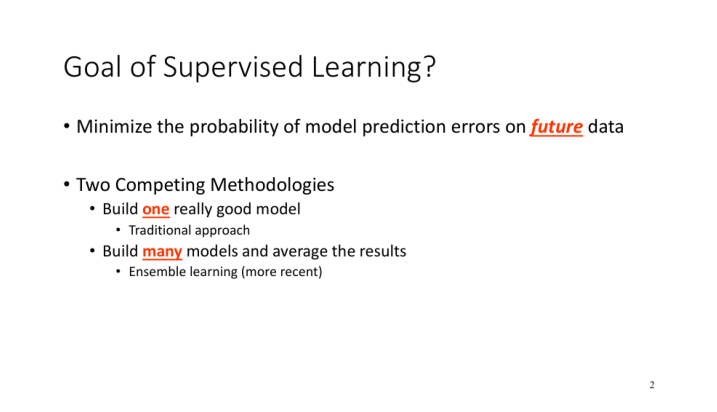

Question:

 Why might someone choose the traditional approach?

True Answer:

 Someone might choose the traditional approach for simplicity, computational efficiency, or if they
believe one model can capture the data's nuances.

Predicted Answer:

 The traditional approach might be more efficient, but it might not be the most effective.



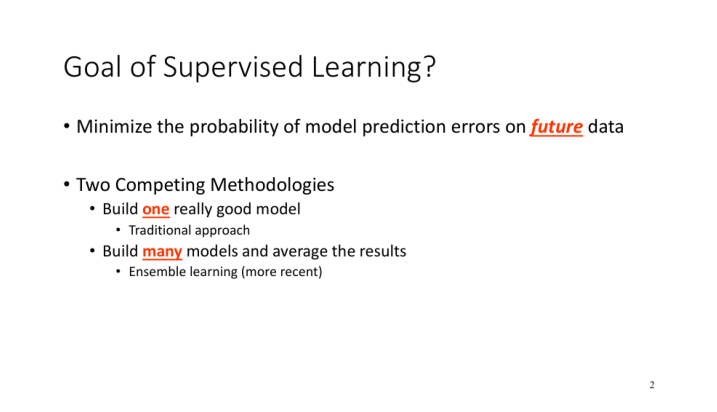

Question:

 What does ensemble learning aim to achieve?

True Answer:

 Ensemble learning aims to achieve better prediction accuracy by leveraging the strengths of multiple
models.

Predicted Answer:

 Ensemble learning aims to achieve more recent models and average the results.



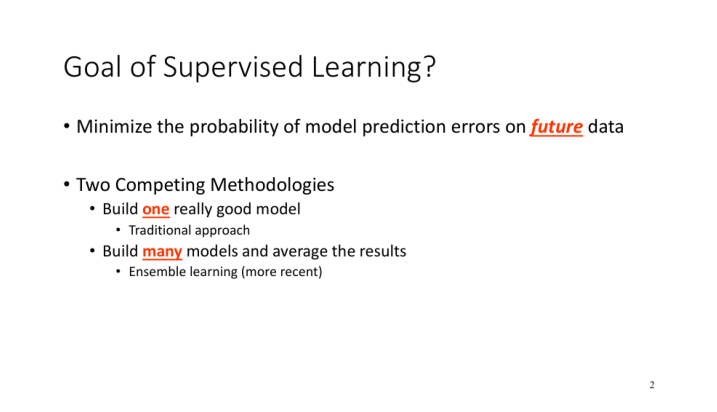

Question:

 Are prediction errors related to past or future data?

True Answer:

 Prediction errors are related to future data.

Predicted Answer:

 Yes, prediction errors are related to past or future data.



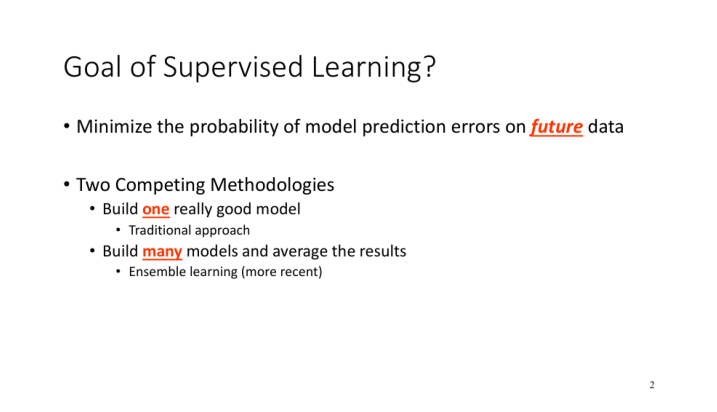

Question:

 Can ensemble learning offer more robust predictions?

True Answer:

 Yes, ensemble learning can offer more robust predictions by leveraging diverse models.

Predicted Answer:

 Yes, ensemble learning offers more robust predictions.



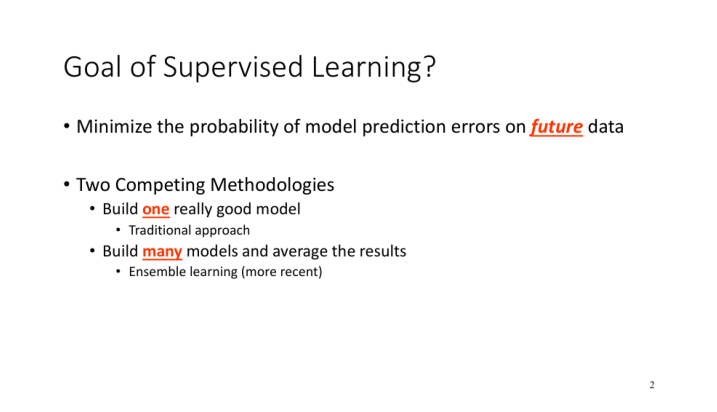

Question:

 Why might ensemble learning be preferred?

True Answer:

 Ensemble learning might be preferred for its ability to harness multiple models, potentially leading
to improved accuracy and reduced overfitting.

Predicted Answer:

 Ensemble learning is preferred because it allows for more recent models to be built.



In [62]:
torch.cuda.empty_cache()

# Sample 5 random rows from the train_df
samples = val_df[10:30]

for _, row in samples.iterrows():
    question = row['question']
    image_path = row['path']
    image = Image.open(image_path).convert("RGB")

    # Process the image and the question using Pix2StructProcessor
    inputs = processor(images=image, text=question, return_tensors="pt").to(device, torch.bfloat16)

    # Generate an answer with the model
    model.eval()  # Set the model to evaluation mode
    with torch.no_grad():
        generated_ids = model.generate(**inputs)
    generated_text = processor.decode(generated_ids[0], skip_special_tokens=True)
    
    # Visualize the data
    plt.figure(figsize=(9, 9))
    raw_image = Image.open(image_path)
    plt.imshow(raw_image)
    plt.axis('off')
    plt.show()

    print(f"Question:\n\n {question}")
    print(f"\nTrue Answer:\n\n {textwrap.fill(row['answer'], width=100)}")
    print(f"\nPredicted Answer:\n\n {textwrap.fill(generated_text, width=100)}\n")
    print("="*50)

torch.cuda.empty_cache()

## Random training samples

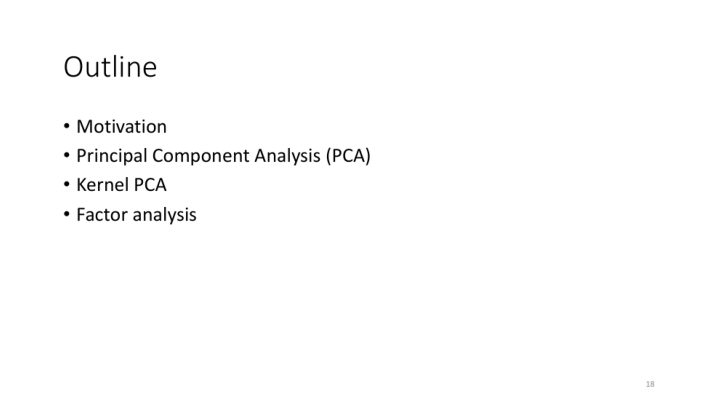

Question:

 List the topics in the order they appear.

True Answer:

 The topics are: Motivation, PCA, Kernel PCA, and Factor analysis.

Predicted Answer:

 The topics in the order they appear appear in the order they appear.



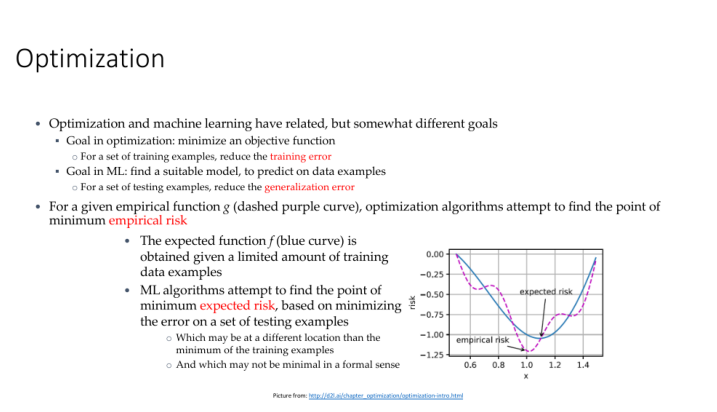

Question:

 Why might the point of minimum expected risk differ from the training examples minimum?

True Answer:

 The point of minimum expected risk might differ due to overfitting or variability in the data
distribution.

Predicted Answer:

 The point of minimum expected risk is the error on a set of testing examples.



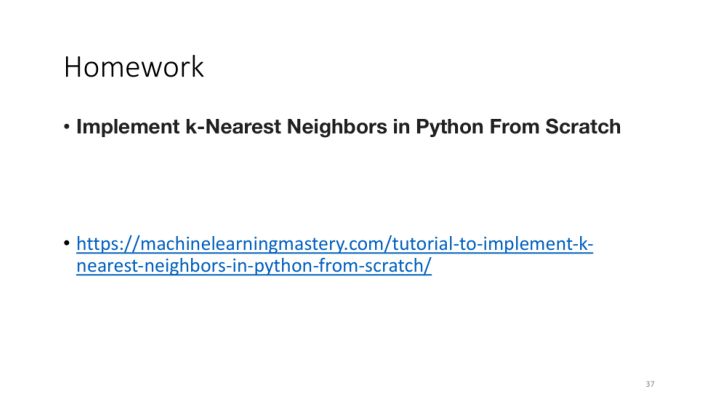

Question:

 What's the title of the provided link?

True Answer:

 The title is 'tutorial-to-implement-k-nearest-neighbors-in-python-from-scratch'.

Predicted Answer:

 The provided link is to the tutorial to implement k-Nearest Neighbors in



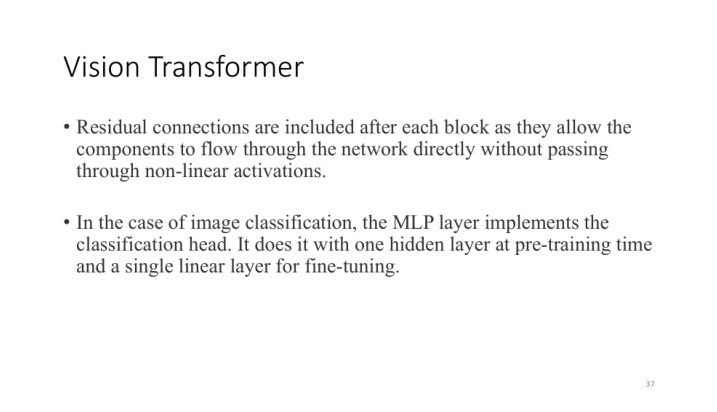

Question:

 How does the MLP layer function in image classification?

True Answer:

 For image classification, the MLP layer acts as the classification head.

Predicted Answer:

 The MLP layer implements the classification head.



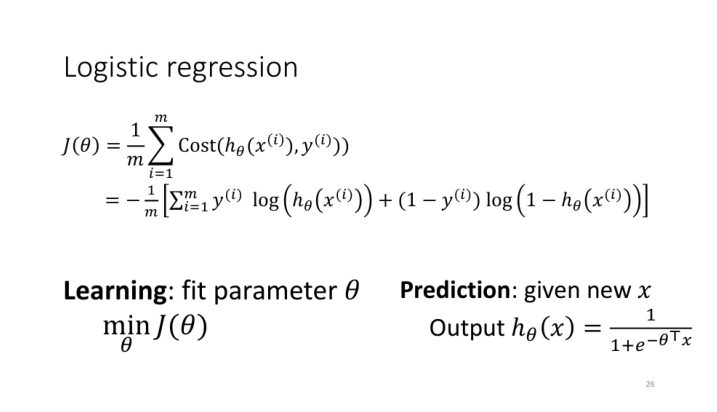

Question:

 What does 'θ' represent in this context?

True Answer:

 θ represents the parameter vector that needs to be learned for the logistic regression model.

Predicted Answer:

 'θ' represents the number of variables in the log.



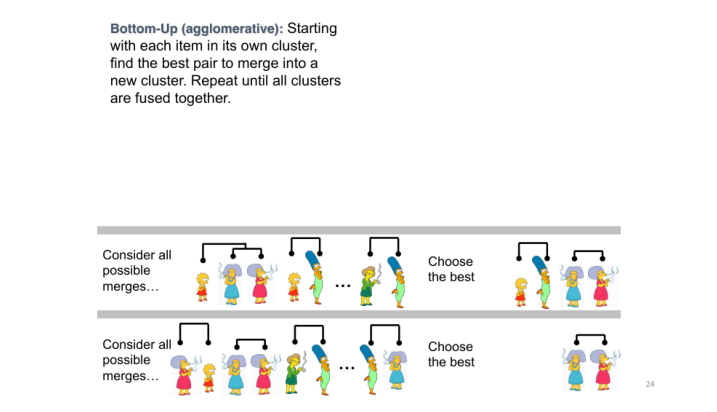

Question:

 What type of clustering method is being described?

True Answer:

 The slide describes the 'Bottom-Up' or agglomerative clustering method.

Predicted Answer:

 The clustering method is described as follows:



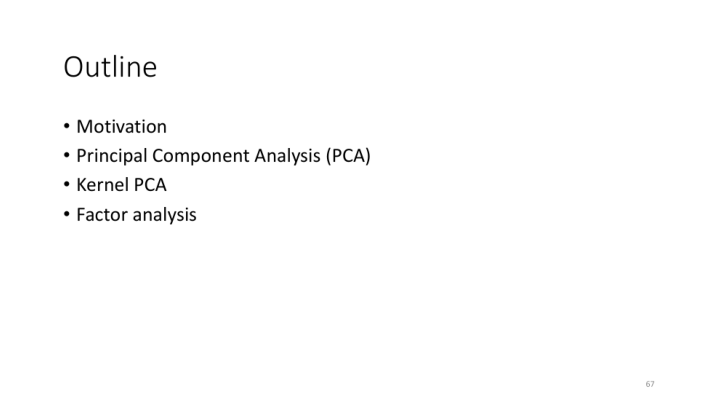

Question:

 Brainstorm applications of Factor Analysis.

True Answer:

 Factor Analysis can be used in psychology for personality tests, in finance for stock portfolio
design, and in marketing for consumer segmentation.

Predicted Answer:

 Applications include Motivation, Principal Component Analysis, Kernel PCA, and Factor analysis.



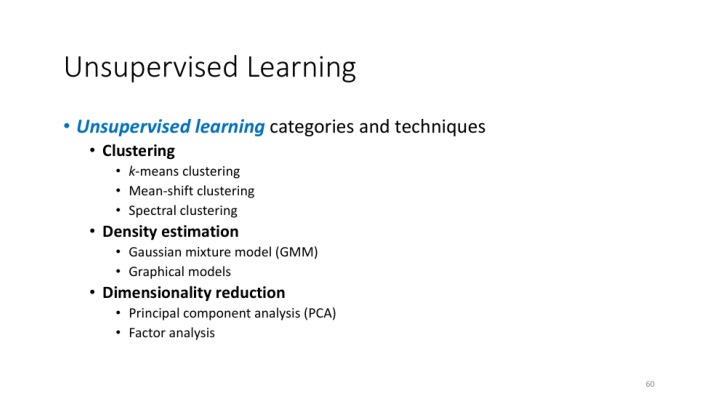

Question:

 Can you name a technique used for dimensionality reduction?

True Answer:

 One technique used for dimensionality reduction is 'Principal Component Analysis (PCA)'.

Predicted Answer:

 A technique used for dimensionality reduction is principal component analysis (PCA).



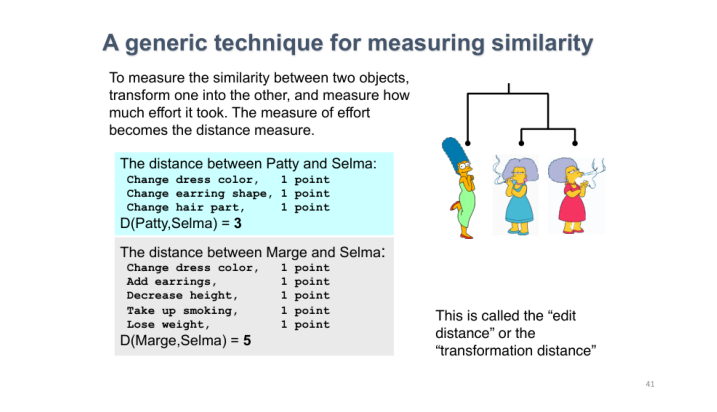

Question:

 What is the concept of 'transformation distance'?

True Answer:

 It's a measure of effort needed to transform one object into another, gauging their similarity.

Predicted Answer:

 The concept of 'transformation distance' is to measure the distance between two objects, and



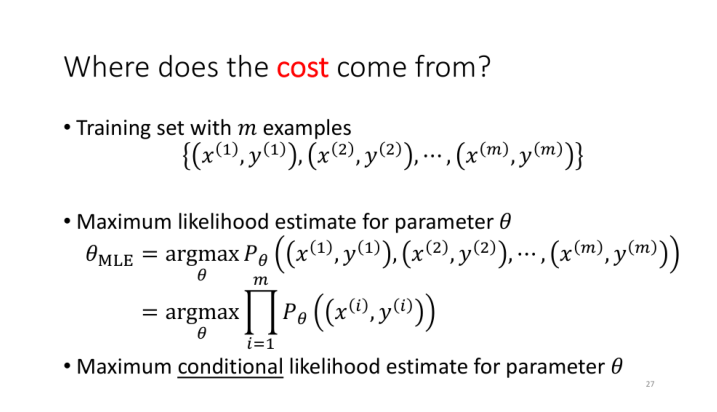

Question:

 Why is the likelihood written as a product over all training examples?

True Answer:

 This product represents the joint likelihood of observing all the training examples, assuming they
are independent.

Predicted Answer:

 The likelihood is written as a product over all training examples.



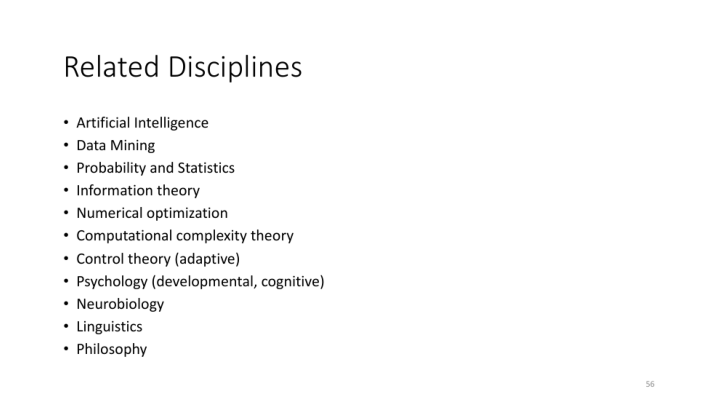

Question:

 Is Linguistics mentioned as a related discipline?

True Answer:

 Yes, Linguistics is mentioned as a related discipline.

Predicted Answer:

 Yes, Linguistics is mentioned as a related discipline.



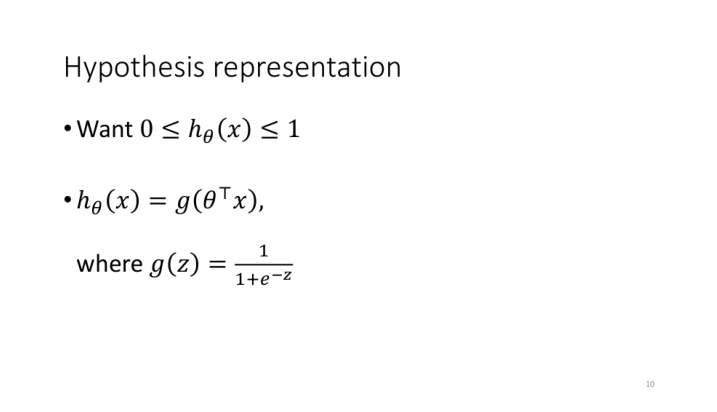

Question:

 What is the desired range for hθ(x) in this context?

True Answer:

 The desired range for hθ(x) is between 0 and 1.

Predicted Answer:

 The desired range for hθ(x) is 0.



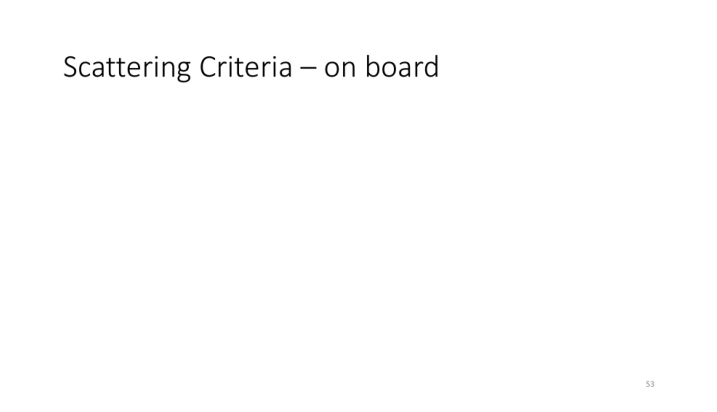

Question:

 What is meant by 'scattering criteria'?

True Answer:

 Scattering criteria typically refer to the rules or conditions that determine how particles scatter.

Predicted Answer:

 Scattering Criteria is meant to determine the quality of the data.



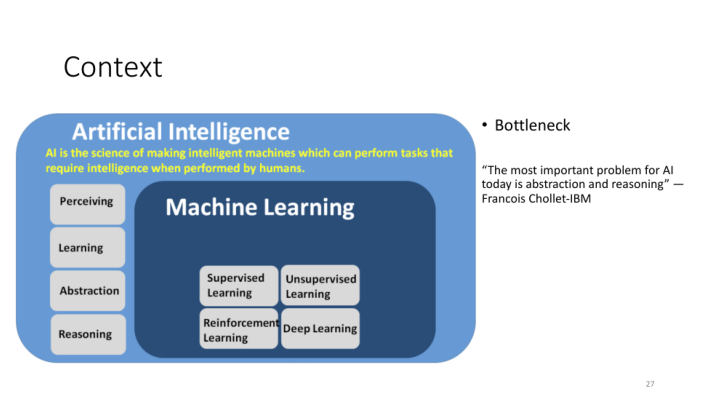

Question:

 Is Deep Learning a part of Machine Learning?

True Answer:

 Yes, Deep Learning is a part of Machine Learning.

Predicted Answer:

 Yes, Deep Learning is a part of Machine Learning.



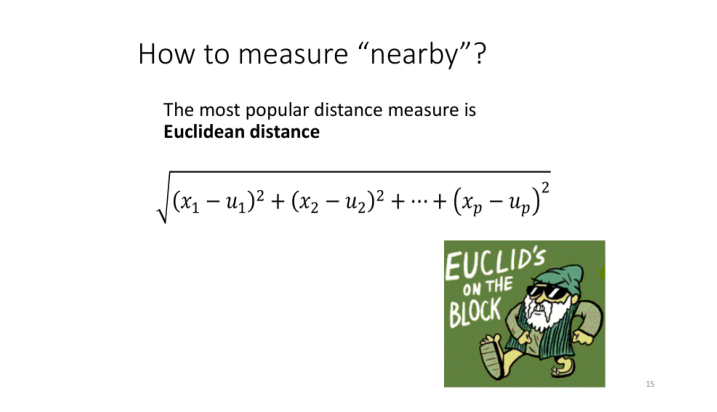

Question:

 Can Euclidean distance be negative?

True Answer:

 No, Euclidean distance is always non-negative.

Predicted Answer:

 Yes, Euclidean distance can be negative.



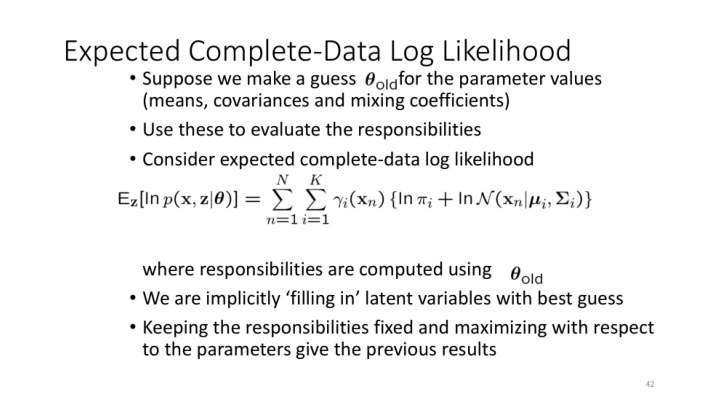

Question:

 How is the expected complete-data log likelihood represented?

True Answer:

 It's represented as Ez[ln p(x, z|θ)] with a summation over N and K.

Predicted Answer:

 The expected complete-data log likelihood is represented as 'In p(x,z|



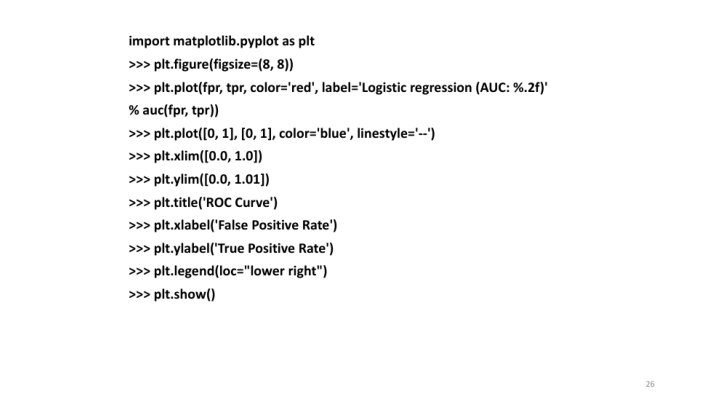

Question:

 Rewrite the code to display the title 'Precision-Recall Curve'.

True Answer:

 import matplotlib.pyplot as plt ... plt.title('Precision-Recall Curve')

Predicted Answer:

 The code displays the title 'Precision-Recall Curve'.



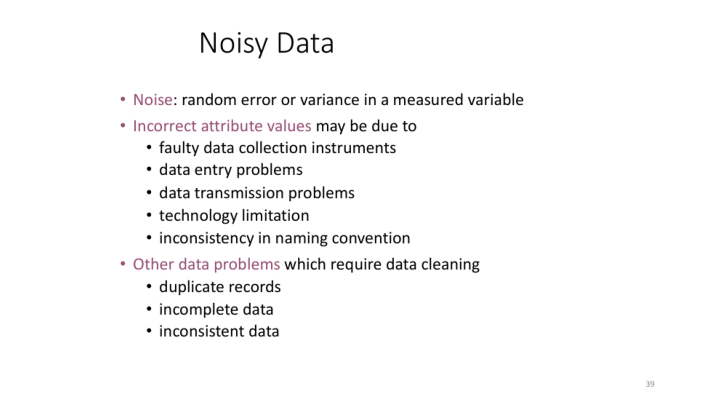

Question:

 Why is naming consistency important in data?

True Answer:

 Consistent naming ensures clarity, avoids misinterpretation, and promotes accurate data analysis.

Predicted Answer:

 Naming consistency is important in data because it helps ensure consistency in naming conventions.



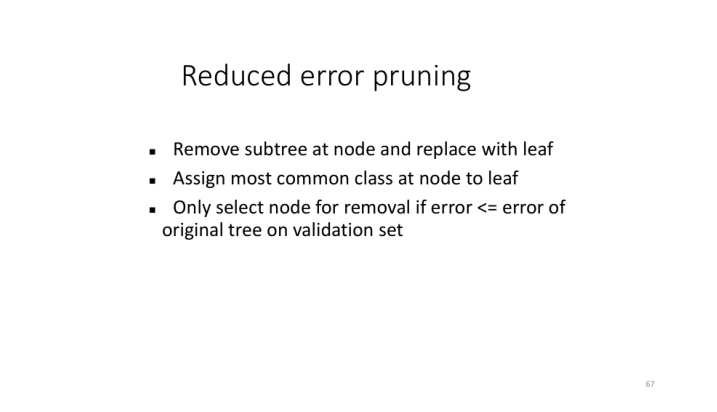

Question:

 How is the class determined for the new leaf after pruning?

True Answer:

 The most common class at the node is assigned to the new leaf.

Predicted Answer:

 The class is determined for the new leaf after pruning.



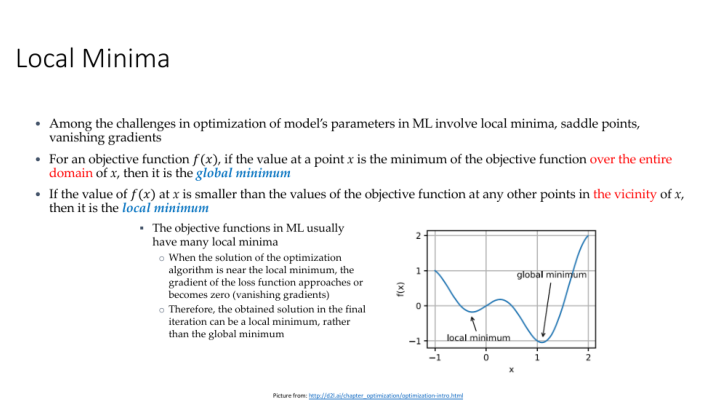

Question:

 Are objective functions in ML simple or complex?

True Answer:

 Objective functions in ML are usually complex with many local minima.

Predicted Answer:

 Yes, the objective functions in ML are simple and complex.



In [66]:
torch.cuda.empty_cache()

# Set a seed for reproducibility
random_seed = 42

# Sample 20 random rows from the train_df using the seed
samples = train_df.sample(n=20, random_state=random_seed)

for _, row in samples.iterrows():
    question = row['question']
    image_path = row['path']
    image = Image.open(image_path).convert("RGB")

    # Process the image and the question using Pix2StructProcessor
    inputs = processor(images=image, text=question, return_tensors="pt").to(device, torch.bfloat16)

    # Generate an answer with the model
    model.eval()  # Set the model to evaluation mode
    with torch.no_grad():
        generated_ids = model.generate(**inputs)
    generated_text = processor.decode(generated_ids[0], skip_special_tokens=True)
    
    # Visualize the data
    plt.figure(figsize=(9, 9))
    raw_image = Image.open(image_path)
    plt.imshow(raw_image)
    plt.axis('off')
    plt.show()

    print(f"Question:\n\n {question}")
    print(f"\nTrue Answer:\n\n {textwrap.fill(row['answer'], width=100)}")
    print(f"\nPredicted Answer:\n\n {textwrap.fill(generated_text, width=100)}\n")
    print("="*50)

torch.cuda.empty_cache()

## __Evaluation Metrics__

### __Prediction on Validation Data__

In [64]:
mat_val_df = val_df[["name","path","question","answer"]]
mat_val_df["predicted_answer"] = ""

In [65]:
mat_val_df

,name,path,question,answer,predicted_answer
8681,week_15_page_001.png,.\data\imgs\week_15\week_15_page_001.png,Can you explain this slide?,"The slide introduces a course titled 'AIM 5005 Machine Learning'. The specific lecture is 'Ensemble Learning', and the instructor is Dr. Youshan Zhang.",
8682,week_15_page_001.png,.\data\imgs\week_15\week_15_page_001.png,What is the course code?,The course code is 'AIM 5005'.,
8683,week_15_page_001.png,.\data\imgs\week_15\week_15_page_001.png,Who is the instructor for this lecture?,The instructor for this lecture is Dr. Youshan Zhang.,
8684,week_15_page_001.png,.\data\imgs\week_15\week_15_page_001.png,What topic is being covered in Lecture 15?,Lecture 15 covers the topic of 'Ensemble Learning'.,
8685,week_15_page_001.png,.\data\imgs\week_15\week_15_page_001.png,Which university does this slide represent?,The university logo displayed on the slide represents 'Peking University'.,
...,...,...,...,...,...
9411,week_16_page_012.png,.\data\imgs\week_16\week_16_page_012.png,Can you explain this slide?,"The slide titled 'Questions' showcases an image of a humanoid figure standing next to a large question mark, possibly indicating a session or segment for queries.",
9412,week_16_page_012.png,.\data\imgs\week_16\week_16_page_012.png,What is the primary focus of the slide?,"The primary focus of the slide is 'Questions', emphasized by the image of a humanoid figure beside a question mark.",
9413,week_16_page_012.png,.\data\imgs\week_16\week_16_page_012.png,What might be the purpose of this slide in a presentation?,The slide might be used to prompt audience interaction or to indicate the Q&A segment of a presentation.,
9414,week_16_page_012.png,.\data\imgs\week_16\week_16_page_012.png,What emotions might this slide evoke in an audience?,"The slide might evoke curiosity, anticipation, or a sense of engagement, prompting the audience to think of questions they have.",


In [67]:
torch.cuda.empty_cache()

# Predict and save the answers in the DataFrame
for index, row in mat_val_df.iterrows():

    question = row['question']
    image_path = row['path']
    image = Image.open(image_path).convert("RGB")

     # Process the image and the question using Pix2StructProcessor
    inputs = processor(images=image, text=question, return_tensors="pt").to(device, torch.bfloat16)

    # Generate an answer with the model
    model.eval()  # Set the model to evaluation mode
    with torch.no_grad():
        generated_ids = model.generate(**inputs)
    generated_text = processor.decode(generated_ids[0], skip_special_tokens=True)
    
    try:
        mat_val_df.at[index, "predicted_answer"] = generated_text
    except Exception as e:
        print(f"Error processing index {index}: {e}")
        mat_val_df.at[index, "predicted_answer"] = None

    torch.cuda.empty_cache()

In [68]:
mat_val_df.head()

,name,path,question,answer,predicted_answer
8681,week_15_page_001.png,.\data\imgs\week_15\week_15_page_001.png,Can you explain this slide?,"The slide introduces a course titled 'AIM 5005 Machine Learning'. The specific lecture is 'Ensemble Learning', and the instructor is Dr. Youshan Zhang.",The slide explains the AIM 5005 Machine Learning. It explains the structure of
8682,week_15_page_001.png,.\data\imgs\week_15\week_15_page_001.png,What is the course code?,The course code is 'AIM 5005'.,The course code is AIM 5005.
8683,week_15_page_001.png,.\data\imgs\week_15\week_15_page_001.png,Who is the instructor for this lecture?,The instructor for this lecture is Dr. Youshan Zhang.,The instructor for this lecture is Dr. Youshan Zhang.
8684,week_15_page_001.png,.\data\imgs\week_15\week_15_page_001.png,What topic is being covered in Lecture 15?,Lecture 15 covers the topic of 'Ensemble Learning'.,The topic is Ensemble Learning.
8685,week_15_page_001.png,.\data\imgs\week_15\week_15_page_001.png,Which university does this slide represent?,The university logo displayed on the slide represents 'Peking University'.,University of the Philippines


In [69]:
mat_val_df.to_csv("./Data/Pix2Struct_val_pred_2.csv")

### __Prediction on Training Data__

In [70]:
mat_train_df = train_df[["name","path","question","answer"]]
mat_train_df["predicted_answer"] = ""

In [71]:
mat_train_df

,name,path,question,answer,predicted_answer
0,week_01_page_001.png,.\data\imgs\week_01\week_01_page_001.png,Can you explain this slide?,"The slide introduces AIM 5005 Machine Learning course, with the first lecture focusing on an introduction to machine learning. The instructor is Dr. Youshan Zhang.",
1,week_01_page_001.png,.\data\imgs\week_01\week_01_page_001.png,Who is the instructor for this course?,The instructor is Dr. Youshan Zhang.,
2,week_01_page_001.png,.\data\imgs\week_01\week_01_page_001.png,What is the course code?,The course code is AIM 5005.,
3,week_01_page_001.png,.\data\imgs\week_01\week_01_page_001.png,What is the focus of Lecture 1?,Lecture 1 focuses on an introduction to machine learning.,
4,week_01_page_001.png,.\data\imgs\week_01\week_01_page_001.png,What is the date of the lecture?,The lecture date is 01/18/2023.,
...,...,...,...,...,...
8676,week_14_page_058.png,.\data\imgs\week_14\week_14_page_058.png,Can you explain this slide?,"The slide titled 'Questions' showcases an image of a humanoid figure standing next to a large question mark, possibly indicating a session or segment for queries.",
8677,week_14_page_058.png,.\data\imgs\week_14\week_14_page_058.png,What is the primary focus of the slide?,"The primary focus of the slide is 'Questions', emphasized by the image of a humanoid figure beside a question mark.",
8678,week_14_page_058.png,.\data\imgs\week_14\week_14_page_058.png,What might be the purpose of this slide in a presentation?,The slide might be used to prompt audience interaction or to indicate the Q&A segment of a presentation.,
8679,week_14_page_058.png,.\data\imgs\week_14\week_14_page_058.png,What emotions might this slide evoke in an audience?,"The slide might evoke curiosity, anticipation, or a sense of engagement, prompting the audience to think of questions they have.",


In [72]:
torch.cuda.empty_cache()

# Predict and save the answers in the DataFrame
for index, row in mat_train_df.iterrows():
    
    question = row['question']
    image_path = row['path']
    image = Image.open(image_path).convert("RGB")

     # Process the image and the question using Pix2StructProcessor
    inputs = processor(images=image, text=question, return_tensors="pt").to(device, torch.bfloat16)

    # Generate an answer with the model
    model.eval()  # Set the model to evaluation mode
    with torch.no_grad():
        generated_ids = model.generate(**inputs)
    generated_text = processor.decode(generated_ids[0], skip_special_tokens=True)
    
    try:
        mat_train_df.at[index, "predicted_answer"] = generated_text
    except Exception as e:
        print(f"Error processing index {index}: {e}")
        mat_train_df.at[index, "predicted_answer"] = None

    torch.cuda.empty_cache()

In [73]:
mat_train_df.to_csv("./Data/Pix2Struct_train_pred_2.csv")

### Load the Predicted Answers

In [74]:
mat_val_df = pd.read_csv("./Data/Pix2Struct_val_pred.csv")
mat_val_df['answer'] = mat_val_df['answer'].astype(str)
mat_val_df['predicted_answer'] = mat_val_df['predicted_answer'].astype(str)

In [75]:
mat_val_df.head()

,Unnamed: 0.1,Unnamed: 0,name,path,question,answer,predicted_answer,Cosine_Similarity,BLEU_Score,BLEU,ROUGE_Score
0,0,8681,week_15_page_001.png,.\data\imgs\week_15\week_15_page_001.png,Can you explain this slide?,"The slide introduces a course titled 'AIM 5005 Machine Learning'. The specific lecture is 'Ensemble Learning', and the instructor is Dr. Youshan Zhang.",The slide explains the AIM 5005 Machine Learning. It explains the structure of,0.385725,NaN,3.477910e-155,0.312500
1,1,8682,week_15_page_001.png,.\data\imgs\week_15\week_15_page_001.png,What is the course code?,The course code is 'AIM 5005'.,The course code is AIM 5005.,1.000000,NaN,5.081327e-01,0.666667
2,2,8683,week_15_page_001.png,.\data\imgs\week_15\week_15_page_001.png,Who is the instructor for this lecture?,The instructor for this lecture is Dr. Youshan Zhang.,The instructor for this lecture is Dr. Youshan Zhang.,1.000000,NaN,1.000000e+00,1.000000
3,3,8684,week_15_page_001.png,.\data\imgs\week_15\week_15_page_001.png,What topic is being covered in Lecture 15?,Lecture 15 covers the topic of 'Ensemble Learning'.,Ensemble Learning is being covered in Lecture 15.,0.566501,NaN,1.083268e-231,0.250000
4,4,8685,week_15_page_001.png,.\data\imgs\week_15\week_15_page_001.png,Which university does this slide represent?,The university logo displayed on the slide represents 'Peking University'.,University of the Future represents the future of machine learning.,0.398028,NaN,1.218332e-231,0.222222


In [76]:
mat_train_df = pd.read_csv("./Data/Pix2Struct_train_pred.csv")
mat_train_df['answer'] = mat_train_df['answer'].astype(str)
mat_train_df['predicted_answer'] = mat_train_df['predicted_answer'].astype(str)

In [77]:
mat_train_df.head()

,Unnamed: 0.1,Unnamed: 0,name,path,question,answer,predicted_answer,Cosine_Similarity,BLEU_Score,BLEU,ROUGE_Score
0,0,0,week_01_page_001.png,.\data\imgs\week_01\week_01_page_001.png,Can you explain this slide?,"The slide introduces AIM 5005 Machine Learning course, with the first lecture focusing on an introduction to machine learning. The instructor is Dr. Youshan Zhang.","The slide explains the introduction to machine learning, and the lecture 1 discusses the introduction to machine",0.487396,NaN,2.043394e-78,0.388889
1,1,1,week_01_page_001.png,.\data\imgs\week_01\week_01_page_001.png,Who is the instructor for this course?,The instructor is Dr. Youshan Zhang.,The instructor for this course is Dr. Youshan Zhang.,0.872582,NaN,3.549481e-01,0.800000
2,2,2,week_01_page_001.png,.\data\imgs\week_01\week_01_page_001.png,What is the course code?,The course code is AIM 5005.,The course code is AIM 5005.,1.000000,NaN,1.000000e+00,1.000000
3,3,3,week_01_page_001.png,.\data\imgs\week_01\week_01_page_001.png,What is the focus of Lecture 1?,Lecture 1 focuses on an introduction to machine learning.,Lecture 1: Introduction to machine learning,0.789151,NaN,5.087741e-155,0.533333
4,4,4,week_01_page_001.png,.\data\imgs\week_01\week_01_page_001.png,What is the date of the lecture?,The lecture date is 01/18/2023.,The date of the lecture is 01/18/2023.,0.990354,NaN,8.761983e-155,0.666667


### Cosine Similarity

In [78]:
mat_train_df["Cosine_Similarity"] = ""
mat_val_df["Cosine_Similarity"] = ""

In [79]:
def calculate_average_cosine_similarity(my_df):
    # Initialize the TF-IDF Vectorizer
    vectorizer = TfidfVectorizer()

    # Fit and transform the data
    vec = vectorizer.fit_transform(my_df['answer'].tolist() + my_df['predicted_answer'].tolist())

    # Calculate cosine similarities for each row
    my_df['Cosine_Similarity'] = [
        cosine_similarity(vec[i:i+1], vec[len(my_df) + i:len(my_df) + i + 1])[0][0]
        for i in range(len(my_df))
    ]

    # Calculate the average cosine similarity
    average_cosine_similarity = np.mean(my_df['Cosine_Similarity'])

    return my_df, average_cosine_similarity

In [80]:
updated_mat_train_df, average_similarity = calculate_average_cosine_similarity(mat_train_df)

print("Average Cosine Similarity for the training data:", average_similarity)

Average Cosine Similarity for the training data: 0.40013588186449756


In [81]:
updated_mat_val_df, average_similarity = calculate_average_cosine_similarity(mat_val_df)

print("Average Cosine Similarity for the validation data:", average_similarity)

Average Cosine Similarity for the validation data: 0.3994276556199733


### BLEU Score

In [82]:
mat_train_df = updated_mat_train_df
mat_val_df = updated_mat_val_df

In [83]:
mat_train_df["BLEU_Score"] = ""
mat_val_df["BLEU_Score"] = ""

In [84]:
def calculate_bleu(actual, predicted):
    return sentence_bleu([actual.split()], predicted.split())

def calculate_and_add_bleu_scores(my_df):
    # Calculate BLEU scores for each row
    my_df['BLEU'] = my_df.apply(lambda row: calculate_bleu(row['answer'], row['predicted_answer']), axis=1)

    # Calculate the average BLEU score
    average_bleu_score = np.mean(my_df['BLEU'])

    return my_df, average_bleu_score

In [85]:
updated_mat_train_df, average_bleu = calculate_and_add_bleu_scores(mat_train_df)
print("Average BLEU Score for training data:", average_bleu)

Average BLEU Score for training data: 0.09807984777859341


In [86]:
updated_mat_val_df, average_bleu = calculate_and_add_bleu_scores(mat_val_df)
print("Average BLEU Score for validation data:", average_bleu)

Average BLEU Score for validation data: 0.08890239990845954


### ROUGE Score

In [87]:
mat_train_df = updated_mat_train_df
mat_val_df = updated_mat_val_df

In [88]:
mat_train_df["ROUGE_Score"] = ""
mat_val_df["ROUGE_Score"] = ""

In [89]:
def calculate_and_add_rouge_scores(my_df):
    # Initialize Rouge
    rouge = Rouge()

    # Calculate ROUGE scores for each row
    rouge_scores = my_df.apply(lambda row: rouge.get_scores(row['predicted_answer'], row['answer'])[0]['rouge-l']['f'], axis=1)
    my_df['ROUGE_Score'] = rouge_scores

    # Calculate the average ROUGE score
    average_rouge_score = np.mean(rouge_scores)

    return my_df, average_rouge_score

In [90]:
updated_mat_train_df, average_rouge = calculate_and_add_rouge_scores(mat_train_df)
print("Average ROUGE Score for training data:", average_rouge)

Average ROUGE Score for training data: 0.352531806764268


In [91]:
updated_mat_val_df, average_bleu = calculate_and_add_rouge_scores(mat_val_df)
print("Average ROUGE Score for validation data:", average_bleu)

Average ROUGE Score for validation data: 0.3513274701022685


In [92]:
mat_train_df = updated_mat_train_df
mat_val_df = updated_mat_val_df

In [93]:
mat_train_df.to_csv("./Data/Pix2Struct_train_pred.csv")
mat_val_df.to_csv("./Data/Pix2Struct_val_pred.csv")

### Tuning training

In [23]:
# torch.manual_seed(42)

# model = Pix2StructForConditionalGeneration.from_pretrained("google/pix2struct-docvqa-large", torch_dtype=torch.bfloat16).to("cuda")
# # processor = Pix2StructProcessor.from_pretrained("google/pix2struct-docvqa-large")
# # processor = AutoProcessor.from_pretrained("google/pix2struct-docvqa-large")
# processor = Pix2StructProcessor.from_pretrained("google/pix2struct-docvqa-large")

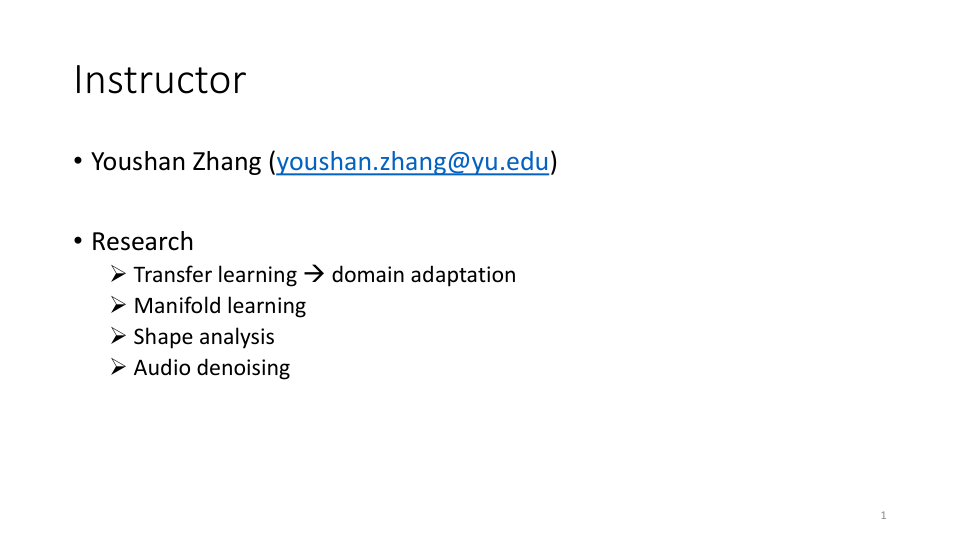

In [59]:
# # Load image from URL
# image = Image.open(data_dir + 'demo_img' + '/' + 'week_01_page_002.png').convert('RGB')
# image 

In [60]:
# question = "What is the email of the instructor?"
# true_answer = "The instructor's email is youshan.zhang@yu.edu."


# # question = "List some research areas of the instructor."
# # true_answer = "Some research areas are transfer learning, manifold learning, shape analysis, and audio denoising."

In [61]:
# # Process and store both examples
# examples = []
# for qa in [
#     {"question": "What is the email of the instructor?", "true_answer": "The instructor's email is youshan.zhang@yu.edu."},
#     {"question": "List some research areas of the instructor.", "true_answer": "Some research areas are transfer learning, manifold learning, shape analysis, and audio denoising."}
# ]:
#     inputs = processor(images=image, text=qa["question"], return_tensors="pt").to(torch.bfloat16)

#     true_answer = processor.tokenizer(text=qa["true_answer"], return_tensors='pt', max_length=30, padding='max_length')
#     labels = true_answer.input_ids.to(device)

#     examples.append({
#         "flattened_patches": inputs['flattened_patches'],
#         "attention_mask": inputs['attention_mask'],
#         "labels": labels
#     })

In [ ]:
# torch.manual_seed(42)

# model = Pix2StructForConditionalGeneration.from_pretrained("google/pix2struct-base")
# processor = AutoProcessor.from_pretrained("google/pix2struct-base")

In [63]:
# # Get the EOS token
# eos_token =  processor.tokenizer.eos_token
# eos_token_id =  processor.tokenizer.eos_token_id

# # Get the BOS token
# bos_token =  processor.tokenizer.bos_token
# bos_token_id =  processor.tokenizer.bos_token_id

# # Get the PAD token
# pad_token =  processor.tokenizer.pad_token
# pad_token_id =  processor.tokenizer.pad_token_id

# print("EOS token:", eos_token)
# print("EOS token ID:", eos_token_id)
# print("BOS token:", bos_token)
# print("BOS token ID:", bos_token_id)
# print("PAD token:", pad_token)
# print("PAD token ID:", pad_token_id)

Using bos_token, but it is not set yet.


EOS token: </s>
EOS token ID: 1
BOS token: None
BOS token ID: None
PAD token: <pad>
PAD token ID: 0


In [27]:
# inputs = processor(images=image, text=question, return_tensors="pt").to(torch.bfloat16)

# # Process the answer text
# encoded_text = processor.tokenizer(text = true_answer, return_tensors='pt', max_length = 30, padding='max_length')
# labels = encoded_text.input_ids

In [38]:
# labels

tensor([[  971,  1152,  1430,   313,  2766,  1729,   275, 30137,  1729,   275,
          2389,  1578,   275,   282,  4135,   375,  1178, 12785,   274,     1,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0]],
       device='cuda:0')

In [29]:
# processor.batch_decode(labels)

["The instructor's email is youshan.zhang@yu.edu.</s><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad>"]

In [30]:
# # Ensure tensors are on the correct device
# flattened_patches = inputs['flattened_patches'].to(device)
# attention_mask = inputs['attention_mask'].to(device)
# labels = labels.to(device)

In [27]:
# optimizer = AdamW(model.parameters(), lr=1e-4)

In [65]:
# # loss_fct = nn.CrossEntropyLoss(ignore_index=-100, reduction="mean")
# # loss_fct = nn.CrossEntropyLoss(reduction="mean")
# # loss_fct = nn.CrossEntropyLoss()
# loss_fct = nn.CrossEntropyLoss(ignore_index = pad_token_id)

In [29]:
# loss_values_train = []

In [76]:
# torch.cuda.empty_cache()


# # Training loop
# for epoch in range(1, 50 + 1):

#     # ===========================  Training ===========================  
#     model.train()

#     total_loss = 0
    
#     for example in examples:
#         flattened_patches = example["flattened_patches"].to(device)
#         attention_mask = example["attention_mask"].to(device)
#         labels = example["labels"].to(device)

#         # Zero the gradients
#         optimizer.zero_grad()

#         outputs = model(
#             flattened_patches=flattened_patches,
#             attention_mask=attention_mask,
#             labels=labels
#         )

#         logits = outputs.logits

#         # Compute the loss
#         # loss = outputs.loss
#         loss = loss_fct(logits.view(-1, logits.shape[-1]), labels.view(-1))

#         # Backward pass
#         loss.backward()

#         # Update parameters
#         optimizer.step()

#     if epoch % 5 == 0:
#         model.eval()
#         print(f'Epoch: {epoch}, Train loss: {loss.item()}')
#         for example in examples:
#             prediction = model.generate(
#                 flattened_patches=example["flattened_patches"].to(device),
#                 attention_mask=example["attention_mask"].to(device)
#             )
#             true_answer = example["labels"].to(device)
#             print(f'True Answer: {processor.batch_decode(true_answer)}')
#             print(f'Prediction: {processor.batch_decode(prediction)}')
#         print()
#         model.train()

# torch.cuda.empty_cache()

Epoch: 5, Train loss: 0.00130462646484375
True Answer: ["The instructor's email is youshan.zhang@yu.edu.</s><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad>"]
Prediction: ["<pad> The instructor's email is youshan.zhang@yu.edu.</s>"]
True Answer: ['Some research areas are transfer learning, manifold learning, shape analysis, and audio denoising.</s><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad>']
Prediction: ['<pad> Some research areas are transfer learning, manifold learning, shape analysis, and audio denoising.']

Epoch: 10, Train loss: 0.000240325927734375
True Answer: ["The instructor's email is youshan.zhang@yu.edu.</s><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad>"]
Prediction: ["<pad> The instructor's email is youshan.zhang@yu.edu.</s>"]
True Answer: ['Some research areas are transfer learning, manifold learning, shape analysis, and audio denoising.</s><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad>']
Prediction: ['<pad> Some research ar

In [32]:
# processor.batch_decode(model.generate(**inputs.to(device)))

['<pad> Some research areas are transfer learning, manifold learning, shape analysis, and audio denoising.']